In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from skimage.io import imread, imshow
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler
import os
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

In [2]:
for dirname, _, filenames in os.walk('C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset'):
    for filename in filenames:
        print(os.path.join(dirname, filename))


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset\100_10.jpg
C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset\101_11.jpg
C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset\102_11.jpg
C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset\103_11.jpg
C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset\104_11.jpg
C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset\105_11.jpg
C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset\106_11.jpg
C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset\107_11.jpg
C:\Users\Vikram\Desktop\All Files\Study\All Engi

In [3]:
def order_pics(pics):
    ordered_pics = []
    ordered_targ = []
    for i in range(41):
        num = i + 1
        for pic in pics:
            if int(pic.split('_')[1].replace('.jpg','')) == num:
                ordered_pics.append(pic)
                ordered_targ.append(num)
    return ordered_pics, ordered_targ
    
def load_images_from_folder(folder):
    images = []
    pics = os.listdir(folder)
    pics, target = order_pics(pics)
    for filename in pics:
        img = cv2.imread(os.path.join(folder,filename))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.resize(img, (80, 80), interpolation = cv2.INTER_AREA)
        if img is not None:
            images.append(img)
    return images, target

In [4]:
folder = 'C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Dataset'
X, y = load_images_from_folder(folder)

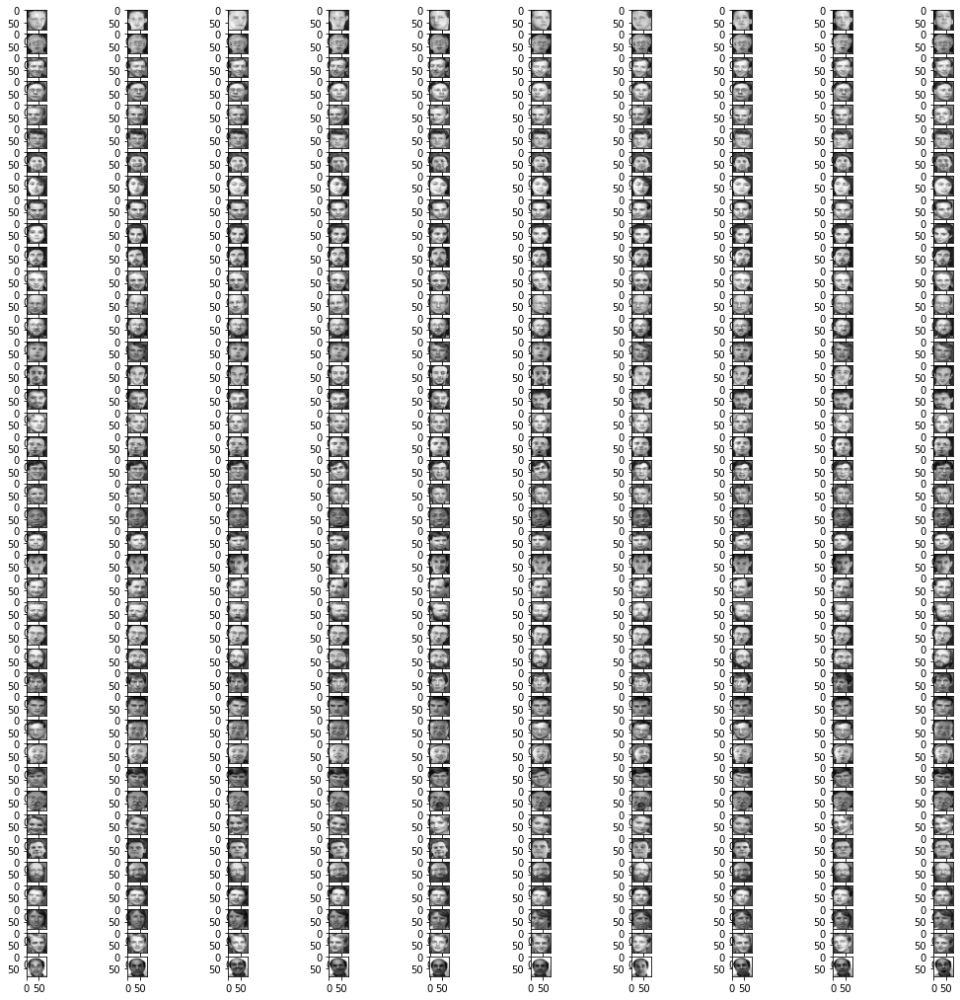

In [5]:
fig, axes = plt.subplots(41, 10, figsize=(18, 18))
for i, ax in enumerate(axes.flat):
    ax.imshow(np.array(X)[i].reshape(80, 80), cmap='gray')

In [19]:
from PIL import Image
import os

def imgcrop(input, xPieces, yPieces):
    filename, file_extension = os.path.splitext(input)
    im = Image.open(input)
    imgwidth, imgheight = im.size
    height = imgheight // yPieces
    width = imgwidth // xPieces
    
    directory = "img_" + filename
    parent_dir = "C://Users/Vikram/Desktop/All Files/Study/All Engineering/Assignments/College/Projects/Special Topics/Project Files/Split Images/"
    path = os.path.join(parent_dir, directory)             
    os.mkdir(path)
            
    for i in range(0, yPieces):
        for j in range(0, xPieces):
            box = (j * width, i * height, (j + 1) * width, (i + 1) * height)
            a = im.crop(box)
        
            a.save("Split Images/" +"img_" + filename + "/" + filename + "_" + str(i) + "_" + str(j) + file_extension)
            
                

In [21]:
from glob import glob
for img in glob("*.jpg"):
    imgcrop(img,5,5)

In [22]:
import glob
import matplotlib.image as image

In [48]:
import numpy as np
from numpy.linalg import eig
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn import datasets
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.feature_extraction import DictVectorizer

In [97]:
import random
import math    
import copy   
import sys 

In [102]:
import warnings
warnings.filterwarnings('ignore')

In [123]:
def fitness_rastrigin(position):
    fitnessVal = 0.0
    for i in range(len(position)):
        xi = position[i]
        fitnessVal += (xi * xi) - (10 * math.cos(2 * math.pi * xi)) + 10
    return fitnessVal
 
#sphere function
def fitness_sphere(position):
    fitnessVal = 0.0
    for i in range(len(position)):
        xi = position[i]
        fitnessVal += (xi*xi);
    return fitnessVal;

In [124]:
class Particle:
    def __init__(self, fitness, dim, minx, maxx, seed):
        self.rnd = random.Random(seed)

        
        self.position = [0.0 for i in range(dim)]

         
        self.velocity = [0.0 for i in range(dim)]

        
        self.best_part_pos = [0.0 for i in range(dim)]

        
        for i in range(dim):
            self.position[i] = ((maxx - minx) * self.rnd.random() + minx)
            self.velocity[i] = ((maxx - minx) * self.rnd.random() + minx)

        
        self.fitness = fitness(self.position) 

        
        self.best_part_pos = copy.copy(self.position)
        self.best_part_fitnessVal = self.fitness 

In [125]:
def pso(fitness, max_iter, n, dim, minx, maxx):
  
    w = 0.729    
    c1 = 1.49445 
    c2 = 1.49445
    
    rnd = random.Random(0)
 
  
    swarm = [Particle(fitness, dim, minx, maxx, i) for i in range(n)]
 
  
    best_swarm_pos = [0.0 for i in range(dim)]
    best_swarm_fitnessVal = sys.float_info.max 
 
  
    for i in range(n): 
        if swarm[i].fitness < best_swarm_fitnessVal:
            best_swarm_fitnessVal = swarm[i].fitness
            best_swarm_pos = copy.copy(swarm[i].position)
 
  
    Iter = 0
    while Iter < max_iter:
     
   
        if Iter % 10 == 0 and Iter > 1:
            print("Iter = " + str(Iter) + " best fitness = %.3f" % best_swarm_fitnessVal)

        for i in range(n):

          
            for k in range(dim):
                r1 = rnd.random()    
                r2 = rnd.random()

                swarm[i].velocity[k] = (
                                     (w * swarm[i].velocity[k]) +
                                     (c1 * r1 * (swarm[i].best_part_pos[k] - swarm[i].position[k])) + 
                                     (c2 * r2 * (best_swarm_pos[k] -swarm[i].position[k]))
                                   ) 


                
                
                if swarm[i].velocity[k] < minx:
                    swarm[i].velocity[k] = minx
                elif swarm[i].velocity[k] > maxx:
                    swarm[i].velocity[k] = maxx


          
            for k in range(dim):
                swarm[i].position[k] += swarm[i].velocity[k]

          
            swarm[i].fitness = fitness(swarm[i].position)

          
            if swarm[i].fitness < swarm[i].best_part_fitnessVal:
                swarm[i].best_part_fitnessVal = swarm[i].fitness
                swarm[i].best_part_pos = copy.copy(swarm[i].position)

          
            if swarm[i].fitness < best_swarm_fitnessVal:
                best_swarm_fitnessVal = swarm[i].fitness
                best_swarm_pos = copy.copy(swarm[i].position)

        
        Iter += 1
  
    return best_swarm_pos

In [152]:
print ("The matrix for 1_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
    #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 4)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 4)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")
    


The matrix for 1_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 38  39  41  44  43  42  42  45  52  59  77  82  69  62]
 [ 45  47  50  50  47  42  42  43  41  47  64  70  61  60]
 [ 46  51  55  53  47  43  44  46  49  51  61  65  57  58]
 [ 40  47  50  46  42  44  50  54  68  63  64  61  50  50]
 [ 40  46  46  40  39  47  56  61  70  60  56  50  38  39]
 [ 47  51  48  40  41  52  61  61  59  48  44  42  37  42]
 [ 49  53  49  43  47  59  62  57  53  42  40  42  42  51]
 [ 45  49  47  44  51  63  63  54  52  41  39  42  43  52]
 [ 45  51  44  39  48  53  50  52  56  49  41  42  56  72]
 [ 47  56  51  42  45  47  50  58  57  55  55  61  77  92]
 [ 41  55  55  46  46  49  56  70  60  65  72  82  96 107]
 [ 41  58  60  54  54  52  54  64  54  65  79  93 107 117]
 [ 50  63  64  60  62  56  47  46  49  65  85 102 117 128]
 [

Iter = 10 best fitness = 124.641
Iter = 20 best fitness = 124.641
Iter = 30 best fitness = 100.052
Iter = 40 best fitness = 92.372
Iter = 50 best fitness = 66.267
Iter = 60 best fitness = 59.901
Iter = 70 best fitness = 51.167
Iter = 80 best fitness = 41.750
Iter = 90 best fitness = 38.756

PSO completed


Best solution found:
['2.033898', '2.011877', '0.017581', '0.992495', '-1.901669', '-0.995487', '2.001591', '1.974851', '0.896342', '-0.005149', '-0.016588', '-0.035926', '-0.997750', '1.966871', '-0.992676', '1.986732']
fitness of best solution = 37.211104

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 6.453
Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.31

Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 68  52  50  55  47  42  48  52  52  49  44  43  53  65]
 [ 77  57  51  54  47  44  49  50  69  65  57  56  65  77]
 [ 68  51  49  57  57  59  65  64  60  55  49  52  67  84]
 [ 63  56  64  77  79  81  86  84  55  50  45  50  6

Iter = 60 best fitness = 59.901
Iter = 70 best fitness = 51.167
Iter = 80 best fitness = 41.750
Iter = 90 best fitness = 38.756

PSO completed


Best solution found:
['2.033898', '2.011877', '0.017581', '0.992495', '-1.901669', '-0.995487', '2.001591', '1.974851', '0.896342', '-0.005149', '-0.016588', '-0.035926', '-0.997750', '1.966871', '-0.992676', '1.986732']
fitness of best solution = 37.211104

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 6.453
Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO c

Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_1_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[151 154 158 162 166 168 168 168 165 165 166 169 172 173]
 [153 155 159 163 167 168 169 169 168 167 168 171 173 174]
 [156 158 162 165 168 169 170 170 171 170 170 172 174 175]
 [160 162 164 167 169 170 170 170 172 171 170 172 174 175]
 [164 165 166 168 169 17

  3.49582039e-04 2.59438243e-04 3.29794376e-05 2.00075255e-04]]



Pandas DataFrame for the above Numpy array: 


          0         1         2         3         4         5         6   \
0   0.000341  0.000264  0.000163  0.000073  0.000547  0.000099  0.000176   
1   0.000264  0.000286  0.000273  0.000204  0.000090  0.000215  0.000356   
2   0.000163  0.000273  0.000354  0.000306  0.000174  0.000317  0.000532   
3   0.000073  0.000204  0.000306  0.000279  0.000147  0.000301  0.000532   
4   0.000547  0.000090  0.000174  0.000147  0.000033  0.000191  0.000418   
5   0.000099  0.000215  0.000317  0.000301  0.000191  0.000380  0.000090   
6   0.000176  0.000356  0.000532  0.000532  0.000418  0.000090  0.000481   
7   0.000240  0.000488  0.000174  0.000185  0.000055  0.000323  0.000246   
8   0.000543  0.000336  0.000108  0.000147  0.000552  0.000266  0.000246   
9   0.000310  0.000128  0.000488  0.000543  0.000385  0.000128  0.000154   
10  0.000547  0.000341  0.000121  0.000191  0.0000

Iter = 30 best fitness = 100.052
Iter = 40 best fitness = 92.372
Iter = 50 best fitness = 66.267
Iter = 60 best fitness = 59.901
Iter = 70 best fitness = 51.167
Iter = 80 best fitness = 41.750
Iter = 90 best fitness = 38.756

PSO completed


Best solution found:
['2.033898', '2.011877', '0.017581', '0.992495', '-1.901669', '-0.995487', '2.001591', '1.974851', '0.896342', '-0.005149', '-0.016588', '-0.035926', '-0.997750', '1.966871', '-0.992676', '1.986732']
fitness of best solution = 37.211104

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 6.453
Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
It

Iter = 70 best fitness = 51.167
Iter = 80 best fitness = 41.750
Iter = 90 best fitness = 38.756

PSO completed


Best solution found:
['2.033898', '2.011877', '0.017581', '0.992495', '-1.901669', '-0.995487', '2.001591', '1.974851', '0.896342', '-0.005149', '-0.016588', '-0.035926', '-0.997750', '1.966871', '-0.992676', '1.986732']
fitness of best solution = 37.211104

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 6.453
Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:


Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[145 161 145 135 131 122 128 124 119 135 142 147 158 162]
 [156 162 159 168 161 145 154 152 144 150 153 160 171 166]
 [185 178 174 181 164 151 155 131 126 132 136 149 167 168]
 [191 172 154 141 112 110 120  84  89 107 114 121 142 159]
 [148 132 130 132  91  6

Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[168 171 181 183 176 178 180 171 173 171 168 163 152 138]
 [176 176 184 185 177 179 179 168 179 175 172 166 156 147]
 [183 181 186 186 179 180 178 165 175 174 172 167 156 144]
 [182 179 183 183 178 180 178 165 163 164 165 160 146 128]
 [170 169 175 178 174 17

Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[140 118 107 136 147 129 133 143 152 147 143 143 145 146]
 [136 153 154 132 130 154 164 160 178 183 182 166 145 131]
 [122 106 120 113 107 104  82  93 119 137 157 163 155 147]
 [121 129 158 117  97 109  71  66 113 113 119 135 152 158]
 [118 134 177 136  94  94  87 125 165 138 112 112 136 157]
 [141 126 161 169 141 108 108 168 157 136 115 112 128 149]
 [127 136 144 140 139 141 133 125 147 142 136 133 134 138]
 [

Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[142 151 141 117  68  40  55  55  48  54  76  35  57  41]
 [138 151 147 128  81  50  58  51  59  66  66  53  56  38]
 [138 151 152 142  96  57  60  55  79 139 132 102  57  37]
 [148 149 152 153 106  57  68  83 128 189 179 149  92  28]
 [161 148 148 161 118  68  93 131 178 161 145 161 151  36]
 [167 152 149 164 132  95 128 166 170 149 148 156 174  90]
 [165 161 156 162 142 127 152 164 139 167 183 154 159 147]
 [

Iter = 10 best fitness = 124.641
Iter = 20 best fitness = 124.641
Iter = 30 best fitness = 100.052
Iter = 40 best fitness = 92.372
Iter = 50 best fitness = 66.267
Iter = 60 best fitness = 59.901
Iter = 70 best fitness = 51.167
Iter = 80 best fitness = 41.750
Iter = 90 best fitness = 38.756

PSO completed


Best solution found:
['2.033898', '2.011877', '0.017581', '0.992495', '-1.901669', '-0.995487', '2.001591', '1.974851', '0.896342', '-0.005149', '-0.016588', '-0.035926', '-0.997750', '1.966871', '-0.992676', '1.986732']
fitness of best solution = 37.211104

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 6.453
Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.31



Best solution found:
['2.033898', '2.011877', '0.017581', '0.992495', '-1.901669', '-0.995487', '2.001591', '1.974851', '0.896342', '-0.005149', '-0.016588', '-0.035926', '-0.997750', '1.966871', '-0.992676', '1.986732']
fitness of best solution = 37.211104

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 6.453
Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498

Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[173 174 172 168 167 170 169 165 170 171 172 171 169 168]
 [169 173 174 171 170 172 172 170 172 173 173 172 170 169]
 [161 170 177 175 172 174 176 177 174 176 176 174 172 170]
 [155 168 179 178 174 174 179 181 178 179 179 177 174 172]
 [154 168 180 180 175 175 179 183 181 181 181 179 175 173]
 [159 172 183 181 176 176 180 182 182 183 183 180 176 173]
 [168 179 186 184 179 179 181 182 183 184 183 180 176 173]
 [175 184 189 185 181 181 182 182

Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[160 173 154 145 145 145 162 170 179 161 175 162  87  34]
 [166 170 157 156 144 129 159 191 169 178 172 110  40  40]
 [161 163 150 149 138 131 162 184 170 133 100  65  36  42]
 [167 173 156 146 146 159 171 148 125  65  36  48  4

Iter = 60 best fitness = 59.901
Iter = 70 best fitness = 51.167
Iter = 80 best fitness = 41.750
Iter = 90 best fitness = 38.756

PSO completed


Best solution found:
['2.033898', '2.011877', '0.017581', '0.992495', '-1.901669', '-0.995487', '2.001591', '1.974851', '0.896342', '-0.005149', '-0.016588', '-0.035926', '-0.997750', '1.966871', '-0.992676', '1.986732']
fitness of best solution = 37.211104

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 6.453
Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO c

Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[185 193 195 193 197 201 191 174 164 166 165 157 146 138]
 [182 190 194 193 197 202 196 183 182 183 182 178 171 167]
 [173 184 191 192 197 203 201 193 193 192 191 189 187 185]
 [162 174 185 191 196 201 201 197 195 192 190 189 188 187]
 [153 164 177 186 192 19

Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_1_1\1_1_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[141 139 136 133 130 128 127 127 123 121 118 118 120 122]
 [157 154 150 145 140 137 135 135 135 133 133 136 141 146]
 [177 174 170 164 160 157 155 154 149 148 149 152 158 163]
 [185 183 179 175 172 170 169 169 166 165 163 165 16

15  0.000142  0.000175  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 124.641
Iter = 20 best fitness = 124.641
Iter = 30 best fitness = 100.052
Iter = 40 best fitness = 92.372
Iter = 50 best fitness = 66.267
Iter = 60 best fitness = 59.901
Iter = 70 best fitness = 51.167
Iter = 80 best fitness = 41.750
Iter = 90 best fitness = 38.756

PSO completed


Best solution found:
['2.033898', '2.011877', '0.017581', '0.992495', '-1.901669', '-0.995487', '2.001591', '1.974851', '0.896342', '-0.005149', '-0.016588', '-0.035926', '-0.997750', '1.966871', '-0.992676', '1.986732']
fitness of best solution = 37.211104

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere func

Iter = 20 best fitness = 1.575
Iter = 30 best fitness = 0.501
Iter = 40 best fitness = 0.310
Iter = 50 best fitness = 0.167
Iter = 60 best fitness = 0.083
Iter = 70 best fitness = 0.031
Iter = 80 best fitness = 0.013
Iter = 90 best fitness = 0.007

PSO completed


Best solution found:
['0.006945', '0.008470', '-0.014918', '-0.018119', '-0.005656', '-0.008137', '0.000838', '-0.020682', '0.015498', '-0.027041', '0.003851', '0.015598', '-0.014531', '-0.013487', '-0.000604', '0.008571']
fitness of best solution = 0.002894

End particle swarm for sphere function



In [153]:
print ("The matrix for 2_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)

    #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")
    

The matrix for 2_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\2_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 45  52  46  40  48  54  56  62  60  64  69  71  70  68]
 [ 64  71  65  58  65  70  72  78  85  88  90  91  89  88]
 [ 65  74  69  63  70  74  76  82 100 103 105 107 107 109]
 [ 53  66  67  66  74  79  80  87 104 109 115 120 124 127]
 [ 49  66  74  79  91  97  99 107 117 123 133 140 144 146]
 [ 46  66  77  83  97 106 112 121 132 139 148 155 157 155]
 [ 49  67  75  79  93 104 114 127 140 145 152 157 158 156]
 [ 61  77  81  81  94 107 120 136 143 147 153 156 158 158]
 [ 67  76  78  84  99 109 117 130 139 146 153 154 156 160]
 [ 62  74  80  87 102 110 118 132 136 144 151 153 156 160]
 [ 63  78  87  93 104 109 116 131 133 142 150 153 157 161]
 [ 70  86  93  95 101 104 111 127 130 139 148 153 158 163]
 [ 71  85  89  89  94  97 106 123 125 135 145 151 156 161]
 [

Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:


Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\2_1_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[131 132 134 136 135 131 126 122 118 116 110 102  94  90]
 [161 162 165 173 179 177 169 161 153 149 142 131 121 116]
 [162 162 168 181 192 193 182 171 166 161 151 139 128 121]
 [167 169 176 187 195 196 189 181 181 176 167 155 146 140]
 [175 180 186 190 191 190 188 187 187 184 177 169 163 160]
 [172 177 181 180 176 173 175 178 173 172 169 164 160 160]
 [175 177 179 178 176 175 175 176 171 171 170 167 164 163]
 [170 169 170 172 174 174 171 168 1

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '



Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\2_1_1_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[172 170 169 168 168 169 171 172 169 170 171 172 173 173]
 [174 173 173 172 172 172 171 171 173 173 174 175 176 176]
 [173 173 174 174 173 172 171 170 175 175 175 176 177 178]
 [170 170 169 169 169 170 170 171 174 174 174 174 176 178]
 [168 167 166 165 166 169 172 174 173 174 175 176 178 180]
 [168 167 166 166 167 169 172 174 174 175 178 180 183 184]
 [166 167 168 169 169 168 166 165 171 174 178 182 184 185]
 [162 164 168 170 168 164 158 155 167 170 176 181 183 184]
 [168 164 166 170 165 

Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter

Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter 

          0         1         2         3         4         5         6   \
0   0.000329  0.000552  0.000512  0.000552  0.000413  0.000109  0.000599   
1   0.000552  0.000596  0.000010  0.000356  0.000433  0.000148  0.000309   
2   0.000512  0.000010  0.000349  0.000460  0.000200  0.000243  0.000240   
3   0.000552  0.000356  0.000460  0.000255  0.000151  0.000203  0.000054   
4   0.000413  0.000433  0.000200  0.000151  0.000616  0.000265  0.000525   
5   0.000109  0.000148  0.000243  0.000203  0.000265  0.000168  0.000406   
6   0.000599  0.000309  0.000240  0.000054  0.000525  0.000406  0.000183   
7   0.000054  0.000294  0.000507  0.000166  0.000626  0.000401  0.000220   
8   0.000354  0.000527  0.000067  0.000329  0.000191  0.000040  0.000505   
9   0.000186  0.000468  0.000017  0.000277  0.000173  0.000015  0.000480   
10  0.000468  0.000225  0.000398  0.000621  0.000532  0.000374  0.000223   
11  0.000423  0.000272  0.000349  0.000448  0.000324  0.000134  0.000614   
12  0.000604

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\2_1_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[185 162 177 193 184 189 170 109  93 117 154 161 128  98]
 [176 161 173 187 183 186 173 136  98 109 134 142 125 115]
 [166 161 166 178 183 181 174 166 121 114 121 127 122 126]
 [164 165 160 169 184 

Iter = 10 best fitness = 172.458
Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.87

Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\2_1_3_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[182 181 180 178 176 174 172 171 174 172 171 169 168 169]
 [184 184 182 181 179 176 175 174 172 171 169 168 167 168]
 [187 186 186 184 182 180 178 176 172 170 168 167 166 166]
 [188 188 187 186 184 182 179 177 174 172 170 167 165 164]
 [188 188 188 187 185 182 




Maximized Function Value is: 


[[3.66812925e-04 1.98439779e-04 3.30732965e-05 6.73492583e-04
  5.62246040e-04 2.37526402e-04 1.29286523e-04 1.20266533e-05
  6.34405960e-04 1.71379809e-04 7.24605860e-04 3.21712975e-04
  5.47212724e-04 2.79619689e-04 4.32959518e-04 1.38306513e-04]
 [1.98439779e-04 6.31399297e-05 2.82626352e-04 3.87859568e-04
  1.56346493e-04 1.02226553e-04 2.76613025e-04 6.10352654e-04
  4.81066131e-05 6.10352654e-04 6.88525900e-04 5.71266030e-04
  5.50219387e-04 6.64472593e-04 1.11246543e-04 1.20266533e-04]
 [3.30732965e-05 2.82626352e-04 2.10466432e-05 3.99886221e-04
  4.54006161e-04 9.62132262e-05 1.23273196e-04 2.22493086e-04
  5.08126101e-04 2.61579709e-04 6.43425950e-04 7.81732463e-05
  2.04453106e-04 6.49439277e-04 2.76613025e-04 2.61579709e-04]
 [6.73492583e-04 3.87859568e-04 3.99886221e-04 3.36746292e-04
  1.20266533e-05 6.91532563e-04 7.21599196e-04 1.05233216e-04
  1.11246543e-04 5.89306010e-04 1.20266533e-04 7.57679156e-04
  2.43539729e-04 3.90866231e-05 


PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\2_1_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[177 177 181 189 194 187 169 153 190 172 156 150 147 144]
 [149 149 153 166 180 186 182 175 176 155 135 131 136 139]
 [147 147 151 162 174 179 175 169 145 130 119 124 138 147]
 [159 161 166 173 176 167 151 137 111 113 122 139 157 165]
 [156 159 166 172 171 159 139 124 103 117 137 156 169 175]
 [156 158 161 165 165 157 144 134 120 134 150 159 164 171]
 [159 160 162 165 165 159 151 144 138 147 154 155 159 166]
 [151 154 160 165 167 162 153 146 144 150 154 155 160 168]
 [161 1

Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter 

Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\2_1_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[195 196 197 197 196 193 189 187 189 186 181 175 169 164]
 [195 196 197 197 196 193 191 189 187 185 181 176 172 169]
 [191 192 194 195 195 193 191 189 185 184 181 178 176 175]
 [186 187 190 192 193 192 190 189 184 183 180 177 176 176]
 [182 184 187 190 192 192 192 191 184 181 178 174 172 172]
 [177 180 184 188 191 192 192 191 182 179 175 170 168 167]
 [168 170 175 180 184 185 186 186 180 177 172 167 165 164]
 [158 161 166 171 176 178 179 179 1

Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter 

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_2_1\2_1_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[161 165 157 156 155 110  50  25  36  3

In [155]:
print ("The matrix for 3_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
    #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -7, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -7, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 3_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\3_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 33  36  41  45  45  42  36  33  28  51  73  78  71  64]
 [ 46  48  51  55  55  52  47  43  55  73  90  94  90  89]
 [ 49  50  53  57  60  61  60  58  66  78  89  92  95 101]
 [ 50  50  51  53  59  66  72  77  83  93 103 110 117 126]
 [ 61  60  57  55  56  64  78  88  96 108 121 130 138 145]
 [ 64  66  64  57  52  58  75  91 102 115 129 138 144 148]
 [ 49  59  66  62  57  64  86 106 124 136 146 150 151 154]
 [ 33  50  67  71  70  81 107 131 132 142 148 146 144 148]
 [ 31  46  60  72  79  82 104 141 146 147 145 144 148 153]
 [ 37  50  61  71  79  83 104 138 146 147 146 144 148 153]
 [ 42  53  62  71  82  88 106 135 145 147 147 146 149 154]
 [ 39  52  62  74  89  97 111 135 145 149 150 149 151 155]
 [ 33  49  62  77  95 104 116 135 146 150 153 152 153 157]
 [

Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 62.017
Iter = 20 best fitness = 19.598
Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter = 90 best fitness = 0.084

PSO completed


Best solution found:
['0.011134', '-0.099236', '0.08

Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter = 90 best fitness = 0.084

PSO completed


Best solution found:
['0.011134', '-0.099236', '0.085724', '-0.026586', '0.028784', '-0.005709', '0.006621', '0.003645', '-0.004316', '-0.004306', '-0.024157', '-0.007179', '-0.083568', '0.018960', '-0.003694', '-0.064542']
fitness of best solution = 0.031140

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\3_1_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 91  96  98  89  76  70  73  79  80  77  75  74  68  61]
 [130 127 128 126 109  88  86  97 100  96  94  90  83  75]
 [156 145 145 152 136 105  96 107  93  90  88  85  76  67]
 [155 145 144 151 145 123 107 105  88  89  92  92  83  73]
 [153 151 147 147 150 146 127 107  88  94 102 106  98  86]
 [158 159 154 148 152 156 

Iter = 50 best fitness = 88.045
Iter = 60 best fitness = 75.358
Iter = 70 best fitness = 67.947
Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 62.017
Iter = 20 best fitness = 19.598
Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter

Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter = 90 best fitness = 0.084

PSO completed


Best solution found:
['0.011134', '-0.099236', '0.085724', '-0.026586', '0.028784', '-0.005709', '0.006621', '0.003645', '-0.004316', '-0.004306', '-0.024157', '-0.007179', '-0.083568', '0.018960', '-0.003694', '-0.064542']
fitness of best solution = 0.031140

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\3_1_1_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[169 169 170 171 171 172 173 173 177 178 180 186 192 196]
 [169 169 170 170 171 172 173 173 176 177 180 185 192 196]
 [169 169 170 170 171 172 173 173 175 176 179 185 191 196]
 [169 169 170 171 172 172 173 173 174 175 178 184 191 195]
 [170 171 171 172 173 174 174 175 175 175 178 183 189 194]
 [172 173 173 174 175 175 176 176 176 176 178 183 188 192]
 [174 174 175 176 177 177 178

Iter = 20 best fitness = 166.302
Iter = 30 best fitness = 131.179
Iter = 40 best fitness = 120.561
Iter = 50 best fitness = 88.045
Iter = 60 best fitness = 75.358
Iter = 70 best fitness = 67.947
Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 62.017
Iter = 20 best fitness = 19.598
Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.37

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 189.425
Iter = 20 best fitness = 166.302
Iter = 30 best fitness = 131.179
Iter = 40 best fitness = 120.561
Iter = 50 best fitness = 88.045
Iter = 60 best fitness = 75.358
Iter = 70 best fitness = 67.947
Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_it

Iter = 50 best fitness = 88.045
Iter = 60 best fitness = 75.358
Iter = 70 best fitness = 67.947
Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 62.017
Iter = 20 best fitness = 19.598
Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter

Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter = 90 best fitness = 0.084

PSO completed


Best solution found:
['0.011134', '-0.099236', '0.085724', '-0.026586', '0.028784', '-0.005709', '0.006621', '0.003645', '-0.004316', '-0.004306', '-0.024157', '-0.007179', '-0.083568', '0.018960', '-0.003694', '-0.064542']
fitness of best solution = 0.031140

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\3_1_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[176 157 156 152 150 135 108 111 110 114 139 151 163 172]
 [145 153 131  94  97  92  68  88 115 103 110 120 145 171]
 [130 171 144  74  69  77  77 125 175 144 129 124 147 176]
 [153 205 206 138 102  99 107 153 170 145 134 128 144 168]
 [143 169 207 185 143 138 144 157 145 139 148 142 143 149]
 [152 132 157 159 139 152 161 154 144 151 172 166 154 147

Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter = 90 best fitness = 0.084

PSO completed


Best solution found:
['0.011134', '-0.099236', '0.085724', '-0.026586', '0.028784', '-0.005709', '0.006621', '0.003645', '-0.004316', '-0.004306', '-0.024157', '-0.007179', '-0.083568', '0.018960', '-0.003694', '-0.064542']
fitness of best solution = 0.031140

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\3_1_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[174 195 184 163 167 170 169 178 182 178 160 133 116 118]
 [179 199 191 173 175 175 167 169 162 162 154 141 134 138]
 [172 189 187 175 178 177 164 157 153 153 150 144 141 140]
 [160 174 177 173 177 180 169 154 151 148 144 144 147 147]
 [157 166 172 172 174 1

          0         1         2         3         4         5         6   \
0   0.000675  0.000550  0.000186  0.000584  0.000683  0.000518  0.000154   
1   0.000550  0.000204  0.000084  0.000227  0.000305  0.000157  0.000590   
2   0.000186  0.000084  0.000186  0.000096  0.000707  0.000276  0.000209   
3   0.000584  0.000227  0.000096  0.000148  0.000209  0.000442  0.000172   
4   0.000683  0.000305  0.000707  0.000209  0.000660  0.000227  0.000177   
5   0.000518  0.000157  0.000276  0.000442  0.000227  0.000326  0.000029   
6   0.000154  0.000590  0.000209  0.000172  0.000177  0.000029  0.000599   
7   0.000672  0.000340  0.000721  0.000300  0.000035  0.000151  0.000579   
8   0.000218  0.000288  0.000244  0.000727  0.000172  0.000468  0.000340   
9   0.000561  0.000739  0.000148  0.000489  0.000270  0.000730  0.000407   
10  0.000666  0.000372  0.000279  0.000186  0.000029  0.000337  0.000256   
11  0.000122  0.000058  0.000285  0.000561  0.000052  0.000017  0.000363   
12  0.000163

Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 62.017
Iter = 20 best fitness = 19.598
Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter = 90 best fitness = 0.084

PSO completed


Best solution found:
['0.011134', '-0.099236', '0.08

Iter = 60 best fitness = 75.358
Iter = 70 best fitness = 67.947
Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 62.017
Iter = 20 best fitness = 19.598
Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter = 90 best fitness = 0.084

PSO 

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\3_1_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[153 151 159 164 160 168 182 184 172 169 166 164 158 150]
 [153 162 173 168 160 172 182 174 174 169 164 161 156 150]
 [150 164 175 165 161 182 194 181 172 167 164 164 160 154]
 [175 175 176 169 167 185 194 183 174 170 168 169 166 160]
 [198 180 175 180 180 181 180 170 180 170 160 155 152 148]
 [163 146 151 174 183 183 179 171 171 155 137 127 124 125]
 [138 131 141 159 169 177 181 174 150 138 126 123 125 127]
 [166 164 164 157 151 161 169 159 137 133 135 145 153 154]
 [163 169 172 166 160 153 140 127 138 143 150 154 155 154]
 [159 166 171 169 167 166 161 155 151 154 157 157 155 154]
 [162 168 171 168 166 168 170 170 162 163 163 161 157 155]
 [172 173 170 162 154 152 155 158 162 162 163 163 162 160]
 [182 177 170 161 151 146 147 150 159 161 164 168 171 171]
 [176 170 165 163 159 156 1

Iter = 50 best fitness = 88.045
Iter = 60 best fitness = 75.358
Iter = 70 best fitness = 67.947
Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 62.017
Iter = 20 best fitness = 19.598
Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\3_1_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 45  50  52  48  46  46  45  43  41  55  32  68 164 150]
 [ 45  50  52  48  46  47  46  43  41  55  35  74 163 148]
 [ 45  50  52  49  46  47  46  44  43  54  34  80 163 150]
 [ 45  50  52  49  47  48  47  44  46  49  25  84 162 156]
 [ 45  50  52  49  47  49  48  46  49  41  14  86 161 164]
 [ 45  50  52  50  48  49  49  46  45  33   9  94 162 168]
 [ 44  50  52  50  48  50  50  47  35  29  13 106 162 165]
 [ 44  50  52  50  48  50  50  47  27  27  20 117 162 161]
 [ 41  55  51  53  49  42  50  43  23  33  10 116 172 160]
 [ 42  52  46  51  51  46  50  38  19  21  20  99 174 169]
 [ 44  51  42  49  52  47  49  33  27  17  35  75 160 174]
 [ 45  53  45  49  49  43  45  31  30  17  41  58 125 173]
 [ 43  55  48  49  44  36  41  32  19  16  41  58  89 155]
 [ 40  52  45  44  37  30  

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 189.425
Iter = 20 best fitness = 166.302
Iter = 30 best fitness = 131.179
Iter = 40 best fitness = 120.561
Iter = 50 best fitness = 88.045
Iter = 60 best fitness = 75.358
Iter = 70 best fitness = 67.947
Iter = 80 best fitness = 56.753
Iter = 90 best fitness = 47.054

PSO completed


Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_it



Best solution found:
['-0.011614', '0.012917', '2.016745', '3.020579', '1.004838', '1.977849', '1.879185', '1.998339', '1.042360', '1.983690', '-0.974152', '-0.958450', '-1.010397', '-0.969424', '-0.987902', '0.962609']
fitness of best solution = 40.819655

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 62.017
Iter = 20 best fitness = 19.598
Iter = 30 best fitness = 6.165
Iter = 40 best fitness = 2.560
Iter = 50 best fitness = 1.374
Iter = 60 best fitness = 1.041
Iter = 70 best fitness = 0.279
Iter = 80 best fitness = 0.193
Iter = 90 best fitness = 0.084

PSO completed


Best solution found:
['0.011134', '-0.099236', '0.085724', '-0.026586', '0.028784', '-0.005709', '0.006621', '0.003645', '-0.004316

Iter = 90 best fitness = 0.084

PSO completed


Best solution found:
['0.011134', '-0.099236', '0.085724', '-0.026586', '0.028784', '-0.005709', '0.006621', '0.003645', '-0.004316', '-0.004306', '-0.024157', '-0.007179', '-0.083568', '0.018960', '-0.003694', '-0.064542']
fitness of best solution = 0.031140

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_3_1\3_1_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[32 37 33 33 40 37 35 43 40 41 42 42 41 40]
 [31 36 33 32 38 36 34 42 39 40 41 42 41 40]
 [28 35 33 31 37 35 33 40 38 39 40 41 41 39]
 [24 35 34 30 35 34 33 39 37 38 39 40 40 39]
 [22 36 36 30 34 34 33 37 36 37 38 39 39 38]
 [20 37 38 31 33 35 33 37 34 35 37 38 39 38]
 [19 38 40 32 33 36 34 37 33 35 36 38 38 38]
 [18 39 42 32 33 36 35 37 33 34 36 37 38 37]
 [28 34 40 40 36 33 33 35 38 36 38 42 40 34]
 [29 34 40 41 38 35 35 37 36 34 36 39 38

In [157]:
print ("The matrix for 4_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_4_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
    #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -8, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -8, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 4_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_4_1\4_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 46  44  30  22  27  29  30  38  57  63  67  67  69  73]
 [ 46  45  33  26  35  40  44  54  69  79  89  95 101 107]
 [ 39  39  28  25  38  47  54  67  79  92 106 117 125 131]
 [ 34  34  25  25  40  52  61  75  88 100 114 123 130 135]
 [ 34  36  29  30  47  60  70  84 101 111 121 126 132 137]
 [ 28  32  28  32  52  67  77  91 110 119 128 132 137 144]
 [ 20  26  27  36  59  77  89 103 118 128 137 142 148 155]
 [ 19  27  31  44  71  90 103 118 128 138 149 155 160 166]
 [ 25  26  43  72  91  98 111 127 137 144 150 154 159 165]
 [ 29  33  52  80  98 105 116 130 139 146 152 155 160 165]
 [ 32  43  65  92 108 114 123 134 141 148 154 157 161 166]
 [ 33  51  78 102 115 121 128 134 141 148 154 157 162 168]
 [ 32  57  88 109 119 125 130 133 140 147 153 157 163 169]
 [

Iter = 30 best fitness = 150.643
Iter = 40 best fitness = 141.793
Iter = 50 best fitness = 129.714
Iter = 60 best fitness = 119.076
Iter = 70 best fitness = 91.958
Iter = 80 best fitness = 77.395
Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.190
Iter = 60 best fitness = 0.44

Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.190
Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140
Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.016750', '0.012517', '-0.007175', '-0.007936', '0.012282', '-0.008944', '-0.030939', '0.041013', '0.011214', '-0.009886', '0.048954', '0.059142', '-0.009581', '-0.031718']
fitness of best solution = 0.013182

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_4_1\4_1_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 98  99  92  79  79  90  94  88  85  83  82  82  78  71]
 [153 148 129 105  95 101 107 105 118 112 107 102  93  84]
 [164 159 139 113  97  99 104 106 118 111 102  94  84  75]
 [168 168 158 138 122 115 115 113 118 113 107 102  

Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140
Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.016750', '0.012517', '-0.007175', '-0.007936', '0.012282', '-0.008944', '-0.030939', '0.041013', '0.011214', '-0.009886', '0.048954', '0.059142', '-0.009581', '-0.031718']
fitness of best solution = 0.013182

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_4_1\4_1_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 40  83 114 122 129 135 138 143 146 151 157 160 160 161]
 [ 42  84 114 121 129 135 138 144 147 152 157 161 161 162]
 [ 46  86 113 120 128 136 140 145 149 152 157 161 163 164]
 [ 49  88 113 119 128 137 142 147 151 153 157 160 163 165]
 [ 51  88 112 118 130 140 144 150 153 153 156 159 162 165]
 [ 50  87 111 119 132 143 147 152 154 153 153 156 160 162]

Iter = 10 best fitness = 173.912
Iter = 20 best fitness = 173.912
Iter = 30 best fitness = 150.643
Iter = 40 best fitness = 141.793
Iter = 50 best fitness = 129.714
Iter = 60 best fitness = 119.076
Iter = 70 best fitness = 91.958
Iter = 80 best fitness = 77.395
Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 

Iter = 40 best fitness = 141.793
Iter = 50 best fitness = 129.714
Iter = 60 best fitness = 119.076
Iter = 70 best fitness = 91.958
Iter = 80 best fitness = 77.395
Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.190
Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140


Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.016750', '0.012517', '-0.007175', '-0.007936', '0.012282', '-0.008944', '-0.030939', '0.041013', '0.011214', '-0.009886', '0.048954', '0.059142', '-0.009581', '-0.031718']
fitness of best solution = 0.013182

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_4_1\4_1_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[147 119 106 104  88  75  76  79  73  68  59  50  44  43]
 [142 132 120 101  86  90  89  72  73  68  62  56  53  54]
 [145 136 123 103  89  93  90  70  75  70  64  61  61  61]
 [161 136 122 115  99  88  86  81  78  71  62  59  60  60]
 [171 148 132 120 101  90  90  87  78  69  59  55  56  57]
 [162 161 147 113  88  93  93  74  71  65  57  53  55  58]
 [160 165 155 120  89  90  89  69  64  61  58  55  54  55]
 [

Iter = 20 best fitness = 173.912
Iter = 30 best fitness = 150.643
Iter = 40 best fitness = 141.793
Iter = 50 best fitness = 129.714
Iter = 60 best fitness = 119.076
Iter = 70 best fitness = 91.958
Iter = 80 best fitness = 77.395
Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.

Iter = 80 best fitness = 77.395
Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.190
Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140
Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.0

          0         1         2         3         4         5         6   \
0   0.000048  0.000152  0.000419  0.000520  0.000280  0.000496  0.000474   
1   0.000152  0.000542  0.000300  0.000443  0.000456  0.000419  0.000414   
2   0.000419  0.000300  0.000474  0.000245  0.000002  0.000192  0.000231   
3   0.000520  0.000443  0.000245  0.000410  0.000306  0.000262  0.000302   
4   0.000280  0.000456  0.000002  0.000306  0.000238  0.000304  0.000117   
5   0.000496  0.000419  0.000192  0.000262  0.000304  0.000242  0.000381   
6   0.000474  0.000414  0.000231  0.000302  0.000117  0.000381  0.000256   
7   0.000562  0.000315  0.000264  0.000291  0.000229  0.000057  0.000018   
8   0.000229  0.000205  0.000359  0.000487  0.000200  0.000097  0.000546   
9   0.000161  0.000533  0.000509  0.000520  0.000154  0.000037  0.000511   
10  0.000377  0.000553  0.000361  0.000346  0.000549  0.000408  0.000297   
11  0.000463  0.000185  0.000064  0.000137  0.000452  0.000342  0.000212   
12  0.000018

Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.190
Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140
Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.016750', '0.012517', '-0.007175',

Iter = 20 best fitness = 173.912
Iter = 30 best fitness = 150.643
Iter = 40 best fitness = 141.793
Iter = 50 best fitness = 129.714
Iter = 60 best fitness = 119.076
Iter = 70 best fitness = 91.958
Iter = 80 best fitness = 77.395
Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.

Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.190
Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140
Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.016750', '0.012517', '-0.007175', '-0.007936', '0.012282', '-0.008944', '-0.030939', '0.041013', '0.011214', '-0.009886', '0.048954', '0.059142', '-0.009581', '-0.031718']
fitness of best solution = 0.013182

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_4_1\4_1_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[191 189 187 186 186 188 191 193 193 193 192 192 192 191]
 [188 188 188 189 189 190 191 191 192 192 192 192 191 191]
 [186 187 189 191 192 192 192 191 193 193 192 192 191 191]
 [188 189 190 191 193 193 194 194 194 194 194 193 1

Iter = 10 best fitness = 173.912
Iter = 20 best fitness = 173.912
Iter = 30 best fitness = 150.643
Iter = 40 best fitness = 141.793
Iter = 50 best fitness = 129.714
Iter = 60 best fitness = 119.076
Iter = 70 best fitness = 91.958
Iter = 80 best fitness = 77.395
Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 

Iter = 80 best fitness = 77.395
Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.190
Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140
Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.0

Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.016750', '0.012517', '-0.007175', '-0.007936', '0.012282', '-0.008944', '-0.030939', '0.041013', '0.011214', '-0.009886', '0.048954', '0.059142', '-0.009581', '-0.031718']
fitness of best solution = 0.013182

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_4_1\4_1_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[136 145 156 163 166 168 172 176 174 176 178 181 183 183]
 [137 145 154 160 163 165 170 174 174 175 178 181 182 183]
 [140 146 154 159 161 164 169 172 173 175 177 180 181 182]
 [144 149 154 158 161 164 169 172 172 174 176 178 180 180]
 [144 147 152 156 160 163 166 169 170 172 174 176 177 177]
 [141 144 149 154 159 162 164 165 168 169 171 173 174 174]
 [141 144 150 156 162 166 166 165 166 167 169 171 171 171]
 [

Iter = 90 best fitness = 64.697

PSO completed


Best solution found:
['0.050042', '-1.925081', '-1.019739', '-0.035303', '-2.002695', '-1.963513', '1.066143', '3.009150', '2.002174', '0.005524', '1.007736', '4.931468', '0.029364', '0.986010', '-0.095449', '2.039088']
fitness of best solution = 63.506668

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 43.967
Iter = 20 best fitness = 14.518
Iter = 30 best fitness = 5.997
Iter = 40 best fitness = 2.425
Iter = 50 best fitness = 1.190
Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140
Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.016750', '0.012517', '-0.007175',

Iter = 60 best fitness = 0.448
Iter = 70 best fitness = 0.140
Iter = 80 best fitness = 0.048
Iter = 90 best fitness = 0.025

PSO completed


Best solution found:
['0.045846', '-0.021044', '-0.016750', '0.012517', '-0.007175', '-0.007936', '0.012282', '-0.008944', '-0.030939', '0.041013', '0.011214', '-0.009886', '0.048954', '0.059142', '-0.009581', '-0.031718']
fitness of best solution = 0.013182

End particle swarm for sphere function



In [159]:
print ("The matrix for 5_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_5_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -5, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -5, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 5_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_5_1\5_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 51  56  50  48  58  59  49  46  38  41  41  39  40  45]
 [ 64  75  73  69  73  70  62  62  50  54  56  55  57  61]
 [ 53  64  62  55  57  56  56  62  67  72  74  73  74  76]
 [ 44  52  47  39  45  52  59  70  77  81  83  82  84  87]
 [ 32  39  35  32  44  54  58  65  75  81  86  90  98 107]
 [ 21  33  37  41  55  60  57  59  79  88  99 109 123 139]
 [ 38  56  65  70  82  87  88  94 103 114 128 140 152 164]
 [ 49  68  77  79  89 100 111 126 130 141 154 163 170 174]
 [ 48  57  62  73  94 106 114 126 144 146 151 159 167 171]
 [ 42  58  68  79  96 105 113 127 146 147 151 157 164 168]
 [ 39  57  68  77  92 101 113 131 143 145 149 155 161 165]
 [ 40  54  61  68  85  99 115 135 138 140 145 151 158 163]
 [ 39  50  57  68  90 105 116 130 135 139 144 150 155 158]
 [

Iter = 70 best fitness = 78.702
Iter = 80 best fitness = 70.583
Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

PSO completed


Best solution foun

Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['-0.013089', '0.047449', '-0.004361', '-0.011753', '-0.027360', '-0.008796', '0.027269', '-0.002235', '0.032121', '-0.055548', '-0.004480', '-0.034413', '-0.002636', '-0.018334', '-0.007029', '-0.015424']
fitness of best solution = 0.010106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_5_1\5_1_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[146 148 150 149 143 134 124 118 102  93  87  89  90  86]
 [183 187 192 193 190 181 171 165 152 139 126 120 118 116]
 [195 200 206 209 206 197 187 180 172 159 144 132 123 118]
 [208 211 215 216 213 205 196 190 185 177 167 156 142 128]
 [216 217 218 218 215 210 205 202 196 191 185 177 1

Iter = 50 best fitness = 108.811
Iter = 60 best fitness = 108.811
Iter = 70 best fitness = 78.702
Iter = 80 best fitness = 70.583
Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095



Iter = 10 best fitness = 174.859
Iter = 20 best fitness = 154.706
Iter = 30 best fitness = 141.675
Iter = 40 best fitness = 123.201
Iter = 50 best fitness = 108.811
Iter = 60 best fitness = 108.811
Iter = 70 best fitness = 78.702
Iter = 80 best fitness = 70.583
Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness

Iter = 30 best fitness = 141.675
Iter = 40 best fitness = 123.201
Iter = 50 best fitness = 108.811
Iter = 60 best fitness = 108.811
Iter = 70 best fitness = 78.702
Iter = 80 best fitness = 70.583
Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['-0.013089', '0.047449', '-0.004361', '-0.011753', '-0.027360', '-0.008796', '0.027269', '-0.002235', '0.032121', '-0.055548', '-0.004480', '-0.034413', '-0.002636', '-0.018334', '-0.007029', '-0.015424']
fitness of best solution = 0.010106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_5_1\5_1_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[185 181 178 176 175 171 163 157 107  94  52  50  50  40]
 [186 183 180 178 176 171 162 156 122 101  64  52  47  41]
 [189 186 184 183 181 175 166 158 129  97  73  52  47  51]
 [186 184 183 1

Iter = 10 best fitness = 174.859
Iter = 20 best fitness = 154.706
Iter = 30 best fitness = 141.675
Iter = 40 best fitness = 123.201
Iter = 50 best fitness = 108.811
Iter = 60 best fitness = 108.811
Iter = 70 best fitness = 78.702
Iter = 80 best fitness = 70.583
Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness 

Iter = 80 best fitness = 70.583
Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['-0.013089', '0.047449', '-0


End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_5_1\5_1_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[166 167 168 174 190 206 208 201 187 131 124 158 156 129]
 [167 168 168 172 184 199 204 201 205 162 136 139 144 144]
 [169 170 169 169 176 188 198 202 207 188 147 117 126 146]
 [172 173 172 169 170 180 193 202 193 198 161 120 125 139]
 [175 176 174 171 169 175 189 202 187 199 177 145 141 139]
 [177 176 176 174 171 173 186 200 190 195 184 165 154 145]
 [176 174 175 176 173 173 183 195 197 190 187 176 159 156]
 [175 172 174 176 174 173 180 191 203 192 192 184 166 168]
 [180 175 171 171 172 173 179 185 205 207 198 201 170 177]
 [158 159 164 171 175 176 180 187 205 204 201 198 173 173]
 [157 161 169 176 177 176 181 190 208 201 206 195 183 173]
 [163 166 172 175 174 174 184 196 210 195 203 190 190 174]
 [153 158 165 170 170 171 181 194 207 189 196

Iter = 60 best fitness = 108.811
Iter = 70 best fitness = 78.702
Iter = 80 best fitness = 70.583
Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

P

Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['-0.013089', '0.047449', '-0.004361', '-0.011753', '-0.027360', '-0.008796', '0.027269', '-0.002235', '0.032121', '-0.055548', '-0.004480', '-0.034413', '-0.002636', '-0.018334', '-0.007029', '-0.015424']
fitness of best solution = 0.010106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_5_1\5_1_3_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[161 164 167 169 172 175 179 183 181 182 183 184 185 186]
 [157 160 164 167 170 175 179 183 182 183 183 183 183 182]
 [153 156 161 166 169 174 179 182 182 183 183 183 183 183]
 [153 156 161 166 169 173 177 180 180 181 183 185 186 187]
 [155 158 163 167 169 172 175 177 179 180 182 184 186 187]
 [154 158 163 167 169 1

Iter = 40 best fitness = 123.201
Iter = 50 best fitness = 108.811
Iter = 60 best fitness = 108.811
Iter = 70 best fitness = 78.702
Iter = 80 best fitness = 70.583
Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.36

Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['-0.013089', '0.047449', '-0.004361', '-0.011753', '-0.027360', '-0.008796', '0.027269', '-0.002235', '0.032121', '-0.055548', '-0.004480', '-0.034413', '-0.002636', '-0.018334', '-0.007029', '-0.015424']
fitness of best solution = 0.010106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_5_1\5_1_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[152 163 179 189 192 191 189 188 179 184 144  54  53  49]
 [168 176 186 191 191 188 187 187 178 180 134  51  51  48]
 [186 190 194 194 190 186 186 187 178 176 120  47  49  46]
 [191 195 197 196 191 187 186 187 181 174 104  46  48  45]
 [183 189 194 196 193 189 188 188 185 173  89  46  48  44]
 [174 181 189 193 192 1

Iter = 90 best fitness = 64.463

PSO completed


Best solution found:
['0.011209', '0.109078', '-0.003291', '2.086893', '0.967521', '0.050788', '-1.079768', '-1.047096', '0.055154', '-1.762714', '0.056036', '-2.062661', '1.058065', '-1.048225', '-1.148835', '-0.141178']
fitness of best solution = 44.644608

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['-0.013089', '0.047449', '-0.004361', '-0.011753', '-0.02736

          0         1         2         3         4         5         6   \
0   0.000788  0.000065  0.000276  0.000574  0.000269  0.000767  0.000719   
1   0.000065  0.000912  0.000857  0.000792  0.000222  0.000490  0.000541   
2   0.000276  0.000857  0.000429  0.000334  0.000185  0.000389  0.000069   
3   0.000574  0.000792  0.000334  0.000687  0.000719  0.000218  0.000607   
4   0.000269  0.000222  0.000185  0.000719  0.000687  0.000530  0.000352   
5   0.000767  0.000490  0.000389  0.000218  0.000530  0.000654  0.000629   
6   0.000719  0.000541  0.000069  0.000607  0.000352  0.000629  0.000142   
7   0.000632  0.000694  0.000265  0.000098  0.000312  0.000658  0.000763   
8   0.000396  0.000748  0.000589  0.000639  0.000687  0.000316  0.000124   
9   0.000614  0.000614  0.000120  0.000574  0.000759  0.000047  0.000672   
10  0.000774  0.000854  0.000363  0.000530  0.000923  0.000916  0.000400   
11  0.000363  0.000054  0.000614  0.000505  0.000381  0.000825  0.000331   
12  0.000011

Iter = 10 best fitness = 38.498
Iter = 20 best fitness = 13.865
Iter = 30 best fitness = 7.710
Iter = 40 best fitness = 2.242
Iter = 50 best fitness = 1.756
Iter = 60 best fitness = 1.060
Iter = 70 best fitness = 0.360
Iter = 80 best fitness = 0.095
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['-0.013089', '0.047449', '-0.004361', '-0.011753', '-0.027360', '-0.008796', '0.027269', '-0.002235', '0.032121', '-0.055548', '-0.004480', '-0.034413', '-0.002636', '-0.018334', '-0.007029', '-0.015424']
fitness of best solution = 0.010106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_5_1\5_1_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[177 191 181 184 184 187 170  89  44  45  45  45  44  42]
 [189 187 185 173 177 183 133  66  45  45  46  46  44  42]
 [196 180 184 165 172 164  85  45  46  46  47  46  45  43]
 [189 178 176 1

In [161]:
print ("The matrix for 6_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
    #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -9, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -9, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 6_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 41  42  46  73  61  39  52  39  71  71  71  72  73  73]
 [ 43  53  46  70  82  61  68  77  84  82  79  76  74  73]
 [ 42  59  48  68  91  65  60  86  89  87  83  80  79  80]
 [ 34  44  55  78  82  58  56  76  92  92  93  95  98 102]
 [ 30  24  65  91  68  64  82  89 103 107 112 118 122 124]
 [ 44  28  78  93  57  73 104 103 114 118 123 128 131 130]
 [ 56  49  89  88  65  89 106 106 115 119 124 129 132 133]
 [ 53  63  95  86  87 111 107 112 115 119 125 132 138 143]
 [ 57  50  73 100 101 109 123 121 128 132 138 145 150 153]
 [ 57  55  79 106 110 120 134 134 138 141 146 151 155 157]
 [ 63  68  92 115 121 131 144 145 148 150 153 157 159 159]
 [ 71  85 107 123 129 137 145 147 151 153 155 158 159 159]
 [ 74  98 118 127 134 140 144 148 153 154 156 158 160 161]
 [

Iter = 50 best fitness = 121.994
Iter = 60 best fitness = 113.692
Iter = 70 best fitness = 112.672
Iter = 80 best fitness = 112.672
Iter = 90 best fitness = 94.699

PSO completed


Best solution found:
['2.194504', '1.019926', '0.021310', '-0.033015', '1.000581', '-1.935114', '0.979943', '2.098020', '2.905671', '0.283702', '-0.985260', '-1.042059', '3.285532', '-3.059145', '-1.072885', '1.875793']
fitness of best solution = 92.088266

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045


Iter = 30 best fitness = 166.843
Iter = 40 best fitness = 130.311
Iter = 50 best fitness = 121.994
Iter = 60 best fitness = 113.692
Iter = 70 best fitness = 112.672
Iter = 80 best fitness = 112.672
Iter = 90 best fitness = 94.699

PSO completed


Best solution found:
['2.194504', '1.019926', '0.021310', '-0.033015', '1.000581', '-1.935114', '0.979943', '2.098020', '2.905671', '0.283702', '-0.985260', '-1.042059', '3.285532', '-3.059145', '-1.072885', '1.875793']
fitness of best solution = 92.088266

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.

Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 82 132 142 144 152 148 153 156 159 160 161 162 163 164]
 [ 89 137 144 145 152 147 153 156 159 160 161 162 163 163]
 [101 144 146 146 152 147 152 156 159 160 161 162 163 163]
 [113 150 148 146 154 147 152 157 159 160 161 163 163 164]
 [121 153 147 147 156 150 154 159 161 161 163 164 165 165]
 [124 152 145 147 159 153 157 163 162 163 164 166 167 167]
 [123 149 142 147 162 156 160 166 164 165 166 168 168 169]
 [

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_1_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[180 180 179 177 176 175 174 173 172

Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[175 174 173 172 170 169 168 167 156 148 139 130 119 106]
 [176 175 173 171 170 169 168 168 161 151 139 128 115 104]
 [178 176 174 171 169 169 169 169 165 155 142 129 116 106]
 [180 178 175 172 170 169 169 170 168 159 148 136 123 112]
 [180 179 176 173 171 170 169 169 169 163 156 145 129 115]
 [180 179 178 176 173 171 1

Iter = 10 best fitness = 194.491
Iter = 20 best fitness = 177.838
Iter = 30 best fitness = 166.843
Iter = 40 best fitness = 130.311
Iter = 50 best fitness = 121.994
Iter = 60 best fitness = 113.692
Iter = 70 best fitness = 112.672
Iter = 80 best fitness = 112.672
Iter = 90 best fitness = 94.699

PSO completed


Best solution found:
['2.194504', '1.019926', '0.021310', '-0.033015', '1.000581', '-1.935114', '0.979943', '2.098020', '2.905671', '0.283702', '-0.985260', '-1.042059', '3.285532', '-3.059145', '-1.072885', '1.875793']
fitness of best solution = 92.088266

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness 



Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\

Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[171 146 120 110 116 127 139 147 162 172 156 112  81  80]
 [142 136 129 123 117 116 124 135 139 160 169 151 129 117]
 [129 128 127 125 119 113 116 123 128 145 159 157 145 136]
 [145 131 120 119 123 124 124 125 133 138 146 148 142 138]
 [157 143 130 127 131 134 138 142 143 148 158 165 161 152]
 [152 153 153 150 143 139 1

Iter = 90 best fitness = 94.699

PSO completed


Best solution found:
['2.194504', '1.019926', '0.021310', '-0.033015', '1.000581', '-1.935114', '0.979943', '2.098020', '2.905671', '0.283702', '-0.985260', '-1.042059', '3.285532', '-3.059145', '-1.072885', '1.875793']
fitness of best solution = 92.088266

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167',

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[164 161 162 161 144 113  84  70  57  61  88 112 122  94]
 [168 165 165 166 156 137 119 111  90  91 112 136 154 132]
 [169 165 163 163 161 154 148 146 132 126 132 150 172 151]
 [171 166 161 159 1

Iter = 90 best fitness = 94.699

PSO completed


Best solution found:
['2.194504', '1.019926', '0.021310', '-0.033015', '1.000581', '-1.935114', '0.979943', '2.098020', '2.905671', '0.283702', '-0.985260', '-1.042059', '3.285532', '-3.059145', '-1.072885', '1.875793']
fitness of best solution = 92.088266

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167',

Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[171 181 173 149 145 164 174 168 169 170 171 172 173 173]
 [149 159 155 140 144 167 179 173 171 171 171 172 173 174]
 [135 143 142 136 147 171 180 173 175 174 173 172 173 174]
 [140 144 143 143 157 176 180 171 181 179 176 174 173 173]
 [146 147 147 153 168 18

Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[173 175 176 175 173 172 175 178 179 180 180 178 174 172]
 [174 176 178 178 176 176 178 180 179 180 180 178 175 173]
 [174 177 180 181 181 180 181 182 180 181 181 179 175 173]
 [174 176 180 182 183 183 182 182 180 181 181 179 176 174]
 [174 176 178 181 183 183 182 181 180 181 181 179 175 1

Iter = 10 best fitness = 194.491
Iter = 20 best fitness = 177.838
Iter = 30 best fitness = 166.843
Iter = 40 best fitness = 130.311
Iter = 50 best fitness = 121.994
Iter = 60 best fitness = 113.692
Iter = 70 best fitness = 112.672
Iter = 80 best fitness = 112.672
Iter = 90 best fitness = 94.699

PSO completed


Best solution found:
['2.194504', '1.019926', '0.021310', '-0.033015', '1.000581', '-1.935114', '0.979943', '2.098020', '2.905671', '0.283702', '-0.985260', '-1.042059', '3.285532', '-3.059145', '-1.072885', '1.875793']
fitness of best solution = 92.088266

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness 

Iter = 40 best fitness = 130.311
Iter = 50 best fitness = 121.994
Iter = 60 best fitness = 113.692
Iter = 70 best fitness = 112.672
Iter = 80 best fitness = 112.672
Iter = 90 best fitness = 94.699

PSO completed


Best solution found:
['2.194504', '1.019926', '0.021310', '-0.033015', '1.000581', '-1.935114', '0.979943', '2.098020', '2.905671', '0.283702', '-0.985260', '-1.042059', '3.285532', '-3.059145', '-1.072885', '1.875793']
fitness of best solution = 92.088266

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.23

Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.004274', '0.017208', '0.021419', '0.028083', '-0.027510', '-0.052986', '-0.015240', '0.028417', '-0.010180']
fitness of best solution = 0.011106

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_6_1\6_1_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[144 146 149 154 158 161 163 164 164 167 170 171 171 171]
 [161 162 164 166 167 168 169 169 169 171 172 172 171 170]
 [172 172 171 171 170 168 167 166 167 169 170 168 166 164]
 [171 171 171 170 169 167 166 165 165 167 168 167 164 162]
 [167 168 169 170 170 170 170 169 166 168 170 170 168 1


PSO completed


Best solution found:
['2.194504', '1.019926', '0.021310', '-0.033015', '1.000581', '-1.935114', '0.979943', '2.098020', '2.905671', '0.283702', '-0.985260', '-1.042059', '3.285532', '-3.059145', '-1.072885', '1.875793']
fitness of best solution = 92.088266

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 93.306
Iter = 20 best fitness = 21.096
Iter = 30 best fitness = 4.057
Iter = 40 best fitness = 1.539
Iter = 50 best fitness = 0.725
Iter = 60 best fitness = 0.432
Iter = 70 best fitness = 0.238
Iter = 80 best fitness = 0.045
Iter = 90 best fitness = 0.021

PSO completed


Best solution found:
['0.019859', '-0.009225', '-0.002197', '-0.010211', '0.046167', '-0.043848', '0.013909', '-0.00

In [163]:
print ("The matrix for 7_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
    #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -6, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -6, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 7_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 35  37  42  46  46  43  44  48  57  56  60  72  69  44]
 [ 38  44  48  46  43  45  50  54  66  61  70  83  75  55]
 [ 42  50  52  45  42  49  55  56  49  41  58  72  58  48]
 [ 43  51  51  44  46  55  57  50  43  34  58  73  56  57]
 [ 43  46  46  46  53  60  53  40  42  39  63  74  58  66]
 [ 44  43  45  53  61  60  49  38  40  48  67  69  59  71]
 [ 46  43  50  62  65  55  47  47  51  71  85  81  83  96]
 [ 49  46  55  70  67  50  47  58  49  79  89  84  95 111]
 [ 42  50  56  56  55  58  58  56  76  90  94  98 118 131]
 [ 46  48  55  68  73  64  57  59  76  97 108 112 125 134]
 [ 47  46  52  72  83  67  54  63  81 109 125 128 134 137]
 [ 42  49  50  58  70  61  54  69  94 121 135 136 140 141]
 [ 38  62  54  39  49  55  59  80 110 130 137 135 141 145]
 [

Iter = 70 best fitness = 88.310
Iter = 80 best fitness = 79.454
Iter = 90 best fitness = 72.060

PSO completed


Best solution found:
['-0.069064', '1.986621', '1.048516', '1.088923', '2.029035', '4.039073', '-1.975681', '1.910768', '-1.953515', '-1.129828', '2.014008', '0.030744', '0.987347', '-1.015707', '1.915297', '1.015525']
fitness of best solution = 60.440975

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.811
Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
[

          0         1         2         3         4         5         6   \
0   0.000217  0.000927  0.000766  0.000907  0.000168  0.000044  0.000076   
1   0.000927  0.000469  0.000072  0.000762  0.000903  0.001003  0.000670   
2   0.000766  0.000072  0.000758  0.000622  0.000421  0.000213  0.000201   
3   0.000907  0.000762  0.000622  0.000734  0.000702  0.000465  0.000100   
4   0.000168  0.000903  0.000421  0.000702  0.000164  0.000329  0.000313   
5   0.000044  0.001003  0.000213  0.000465  0.000329  0.000963  0.000999   
6   0.000076  0.000670  0.000201  0.000100  0.000313  0.000999  0.000024   
7   0.000024  0.000923  0.000522  0.000076  0.000570  0.000554  0.000481   
8   0.000056  0.000570  0.000453  0.000810  0.000847  0.000638  0.000842   
9   0.000979  0.000943  0.000285  0.000834  0.000076  0.000305  0.000686   
10  0.000782  0.000461  0.000975  0.000883  0.000485  0.000024  0.000189   
11  0.000341  0.000959  0.000790  0.000349  0.000136  0.000935  0.000349   
12  0.000397


PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.041365', '0.030997', '-0.054081', '0.007702', '0.031195', '-0.029062', '-0.026973', '-0.001208', '0.017143']
fitness of best solution = 0.011576

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 66  57  49  61  77  74  75  93 117 135 144 148 156 155]
 [ 64  59  54  64  75  72  78 101 121 139 148 150 156 154]
 [ 55  58  58  64  70  67  79 106 127 146 153 153 156 153]
 [ 46  57  65  70  71  67  82 112 133 152 157 154 155 151]
 [ 42  59  72  78  79  75  89 117 140 155 158 153 154 151]
 [ 38  57  70  76  80  79  92 118 145 157 155 150 152 151]
 [ 43  58  67  73  81  85  99 122 148 156 151 145 151 152]
 [ 56  68  72  77  88  97 112 134 149 155 148 143 151 152]
 [ 54


PSO completed


Best solution found:
['-0.069064', '1.986621', '1.048516', '1.088923', '2.029035', '4.039073', '-1.975681', '1.910768', '-1.953515', '-1.129828', '2.014008', '0.030744', '0.987347', '-1.015707', '1.915297', '1.015525']
fitness of best solution = 60.440975

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.811
Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.0413

Iter = 80 best fitness = 79.454
Iter = 90 best fitness = 72.060

PSO completed


Best solution found:
['-0.069064', '1.986621', '1.048516', '1.088923', '2.029035', '4.039073', '-1.975681', '1.910768', '-1.953515', '-1.129828', '2.014008', '0.030744', '0.987347', '-1.015707', '1.915297', '1.015525']
fitness of best solution = 60.440975

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.811
Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.0298

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[128 106  90  72  57  68  71  48  42  35  38  49  51  43]
 [130 107  88  70  58  69  74  53  41  36  39  49  51  43]
 [131 109  87  69  61  71  73  58  44  41  43  50  49  41]
 [133 113  88  70  66  71  67  54  49  47  48  51  47  38]
 [135 118  91  74  73  70  57  46  47  47  50  51  46  39]
 [140 125  94  77  79  70  50  42  41  45  50  50  46  42]
 [146 131  96  78  84  72  50  45  42  48  52  50  45  41]
 [151 135  97  77  86  74  52  51  47  53  56  52  43  38]
 [150 128 102  74  77  80  55  53  50  53  54  51  44  38]
 [148 132 104  72  77  77  50  54  47  49  51  49  44  40]
 [146 140 110  73  79  74  45  59  50  51  51  49  46  43]
 [146 148 120  79  80  70  43  63  57  56  54  51  47  44]
 [146 149 130  88  76  63  42  62  57  55  51  47  45  43]
 [145 145 139 100  69  56  

Iter = 50 best fitness = 112.846
Iter = 60 best fitness = 93.973
Iter = 70 best fitness = 88.310
Iter = 80 best fitness = 79.454
Iter = 90 best fitness = 72.060

PSO completed


Best solution found:
['-0.069064', '1.986621', '1.048516', '1.088923', '2.029035', '4.039073', '-1.975681', '1.910768', '-1.953515', '-1.129828', '2.014008', '0.030744', '0.987347', '-1.015707', '1.915297', '1.015525']
fitness of best solution = 60.440975

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.811
Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter 

Iter = 20 best fitness = 128.701
Iter = 30 best fitness = 128.701
Iter = 40 best fitness = 128.038
Iter = 50 best fitness = 112.846
Iter = 60 best fitness = 93.973
Iter = 70 best fitness = 88.310
Iter = 80 best fitness = 79.454
Iter = 90 best fitness = 72.060

PSO completed


Best solution found:
['-0.069064', '1.986621', '1.048516', '1.088923', '2.029035', '4.039073', '-1.975681', '1.910768', '-1.953515', '-1.129828', '2.014008', '0.030744', '0.987347', '-1.015707', '1.915297', '1.015525']
fitness of best solution = 60.440975

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.811
Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668

Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.041365', '0.030997', '-0.054081', '0.007702', '0.031195', '-0.029062', '-0.026973', '-0.001208', '0.017143']
fitness of best solution = 0.011576

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[128 148 157 135  99  85 108 137 127 113 101 110 137 163]
 [144 149 150 140 127 122 128 138 138 132 125 126 138 151]
 [150 149 148 148 149 149 147 145 152 156 156 152 149 152]
 [142 148 154 154 151 150 153 157 159 168 172 167 16

Iter = 30 best fitness = 128.701
Iter = 40 best fitness = 128.038
Iter = 50 best fitness = 112.846
Iter = 60 best fitness = 93.973
Iter = 70 best fitness = 88.310
Iter = 80 best fitness = 79.454
Iter = 90 best fitness = 72.060

PSO completed


Best solution found:
['-0.069064', '1.986621', '1.048516', '1.088923', '2.029035', '4.039073', '-1.975681', '1.910768', '-1.953515', '-1.129828', '2.014008', '0.030744', '0.987347', '-1.015707', '1.915297', '1.015525']
fitness of best solution = 60.440975

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.811
Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
I

Iter = 50 best fitness = 112.846
Iter = 60 best fitness = 93.973
Iter = 70 best fitness = 88.310
Iter = 80 best fitness = 79.454
Iter = 90 best fitness = 72.060

PSO completed


Best solution found:
['-0.069064', '1.986621', '1.048516', '1.088923', '2.029035', '4.039073', '-1.975681', '1.910768', '-1.953515', '-1.129828', '2.014008', '0.030744', '0.987347', '-1.015707', '1.915297', '1.015525']
fitness of best solution = 60.440975

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.811
Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter 

Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.041365', '0.030997', '-0.054081', '0.007702', '0.031195', '-0.029062', '-0.026973', '-0.001208', '0.017143']
fitness of best solution = 0.011576

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[154 156 161 168 173 171 165 159 153 141 132 137 152 166]
 [153 155 159 164 165 161 152 146 146 139 136 143 159 171]
 [146 148 153 158 161 159 154 149 138 139 143 152 164 173]
 [145 146 149 152 154 155 154 153 143 148 156 164 169 171]
 [157 155 151 146 144 144 145 147 159 166 174 179 177 173]
 [162 159 154 148 144 145 1

Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.041365', '0.030997', '-0.054081', '0.007702', '0.031195', '-0.029062', '-0.026973', '-0.001208', '0.017143']
fitness of best solution = 0.011576

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[184 184 184 184 183 182 181 181 178 179 180 178 176 174]
 [185 186 186 186 185 183 181 180 179 180 181 179 176 174]
 [184 185 187 187 186 184 182 180 181 182 182 180 177 175]
 [179 181 184 186 186 185 183 181 182 183 183 181 178 176]
 [174 176 179 182 184 184 184 183 182 183 183 181 177 175]
 [173 175 177 179 181 183 1

Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.041365', '0.030997', '-0.054081', '0.007702', '0.031195', '-0.029062', '-0.026973', '-0.001208', '0.017143']
fitness of best solution = 0.011576

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[169 165 166 153 148 143 135 159 148 136 123 132 166 152]
 [173 171 173 159 154 149 136 151 125 127 127 136 167 152]
 [168 170 172 155 151 148 129 135 131 147 155 160 180 160]
 [166 167 168 148 146 146 126 129 165 181 183 175 183 155]
 [173 170 167 148 147 14

Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.041365', '0.030997', '-0.054081', '0.007702', '0.031195', '-0.029062', '-0.026973', '-0.001208', '0.017143']
fitness of best solution = 0.011576

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 41  42  43  43  41  41  42  43  34 105 179 154 195 183]
 [ 41  42  43  43  41  40  42  43  35  54 154 163 178 194]
 [ 40  42  43  42  41  40  41  43  38  24 101 166 169 185]
 [ 40  41  43  42  40  40  41  42  42  39  47 142 171 162]
 [ 40  41  42  42  40  39  41  42  44  48  29  87 160 161]
 [ 39  41  42  41  40  39  40  42  42  34  42  37 117 169]
 [ 39  40  42  41  39  39  40  41  38  31  48  29  60 144]
 [

Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.041365', '0.030997', '-0.054081', '0.007702', '0.031195', '-0.029062', '-0.026973', '-0.001208', '0.017143']
fitness of best solution = 0.011576

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[187 188 189 191 191 188 182 177 175 174 175 175 176 178]
 [190 191 193 193 192 190 187 186 181 181 180 180 181 182]
 [189 192 195 195 191 189 189 191 188 187 186 185 185 185]
 [183 190 196 196 190 186 186 188 190 189 187 185 184 183]
 [177 186 195 198 193 186 183 182 186 185 183 180 178 176]
 [171 180 191 196 195 189 183 180 180 178 176 173 171 169]
 [163 170 180 189 192 190 185 182 175 174 171 168 166 164]
 [

Iter = 10 best fitness = 191.921
Iter = 20 best fitness = 128.701
Iter = 30 best fitness = 128.701
Iter = 40 best fitness = 128.038
Iter = 50 best fitness = 112.846
Iter = 60 best fitness = 93.973
Iter = 70 best fitness = 88.310
Iter = 80 best fitness = 79.454
Iter = 90 best fitness = 72.060

PSO completed


Best solution found:
['-0.069064', '1.986621', '1.048516', '1.088923', '2.029035', '4.039073', '-1.975681', '1.910768', '-1.953515', '-1.129828', '2.014008', '0.030744', '0.987347', '-1.015707', '1.915297', '1.015525']
fitness of best solution = 60.440975

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.811
Iter = 20 best fitness = 6.301
Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.2

Iter = 30 best fitness = 2.006
Iter = 40 best fitness = 1.240
Iter = 50 best fitness = 0.668
Iter = 60 best fitness = 0.332
Iter = 70 best fitness = 0.126
Iter = 80 best fitness = 0.052
Iter = 90 best fitness = 0.027

PSO completed


Best solution found:
['0.013889', '0.016941', '-0.029836', '-0.036239', '-0.011312', '-0.016274', '0.001675', '-0.041365', '0.030997', '-0.054081', '0.007702', '0.031195', '-0.029062', '-0.026973', '-0.001208', '0.017143']
fitness of best solution = 0.011576

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_7_1\7_1_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[157 137 133 134 112  40  37  45  38  38  38  37  36  35]
 [155 135 128 131 117  46  37  42  38  38  38  37  36  34]
 [147 131 123 128 122  51  37  39  38  38  38  37  36  34]
 [135 129 123 127 124  52  34  38  38  38  37  37  35  34]
 [125 130 126 127 125  5

In [165]:
print ("The matrix for 8_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
    #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 8_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 35  34  30  26  26  32  43  52  35  33  32  33  32  29]
 [ 41  38  34  30  31  38  47  54  48  42  36  32  30  30]
 [ 44  39  34  32  35  42  48  51  41  38  34  32  35  40]
 [ 41  36  31  30  35  40  43  44  31  32  32  35  42  50]
 [ 38  33  29  29  34  38  39  38  41  41  40  40  48  60]
 [ 34  33  31  31  33  35  36  35  47  48  46  47  62  84]
 [ 30  31  32  32  31  31  32  33  40  48  54  64  87 114]
 [ 25  29  31  31  28  26  28  30  36  51  67  84 108 130]
 [ 23  29  27  25  27  25  32  50  53  75  96 114 127 125]
 [ 23  30  28  27  30  29  36  54  71  93 111 125 136 132]
 [ 24  31  30  28  32  32  40  59  85 106 122 134 144 142]
 [ 26  32  30  29  33  32  41  60  86 107 123 133 146 148]
 [ 27  33  30  28  31  31  40  59  84 106 120 130 145 151]
 [

Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter =

Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[103  98  88  82  84  90  90  85  87  83  80  78  72  66]
 [141 137 128 119 116 115 108  99  87  97  99  89  82  84]
 [174 169 157 145 137 133 125 116  81  99 104  89  81  88]
 [191 184 170 155 146 142 137 131  92  99  97  86  80  84]
 [207 204 194 179 167 159 150 141 124 108  95  93  90  84]
 [217 220 216 205 191 176 159 1

Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 22  29  29  28  32  33  43  64  82 101 116 129 146 150]
 [ 24  30  28  26  29  30  40  61  80 101 116 128 145 150]
 [ 26  31  27  24  27  27  37  57  77 100 116 128 144 150]
 [ 26  30  25  22  27  28  37  57  74 100 118 127 142 14

          0         1         2         3         4         5         6   \
0   0.000617  0.000546  0.000668  0.000327  0.000674  0.000668  0.000628   
1   0.000546  0.000517  0.000688  0.000378  0.000011  0.000026  0.000000   
2   0.000668  0.000688  0.000207  0.000702  0.000384  0.000432  0.000392   
3   0.000327  0.000378  0.000702  0.000597  0.000375  0.000463  0.000350   
4   0.000674  0.000011  0.000384  0.000375  0.000233  0.000347  0.000162   
5   0.000668  0.000026  0.000432  0.000463  0.000347  0.000483  0.000287   
6   0.000628  0.000000  0.000392  0.000350  0.000162  0.000287  0.000190   
7   0.000560  0.000676  0.000341  0.000256  0.000026  0.000148  0.000111   
8   0.000114  0.000310  0.000719  0.000540  0.000230  0.000358  0.000475   
9   0.000367  0.000625  0.000094  0.000125  0.000117  0.000239  0.000108   
10  0.000151  0.000495  0.000318  0.000330  0.000534  0.000662  0.000219   
11  0.000014  0.000244  0.000475  0.000082  0.000037  0.000105  0.000497   
12  0.000688

Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[190 191 191 191 190 190 189 188 188 187 184 179 173 170]
 [189 190 190 190 190 189 189 188 190 189 187 182 177 174]
 [189 189 189 189 190 190 190 190 191 190 188 184 179 175]
 [190 190 190 190 190 190 191 192 191 190 188 183 178 173]
 [191 191 190 189 189 190 19


PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[164 141 123  98  88  86  61  51  47  45  46  49  48  42]
 [166 147 130  99  88  88  62  49  48  46  48  52  52  47]
 [168 155 139 101  87  90  65  47  47  45  47  50  50  44]
 [168 161 146 104  87  93  69  48  51  48  48  50  48  41]
 [166 162 149 107  89  94  70  51  55  52  52  54  52  45]
 [167 161 150 111  90  90  68  54  49  47  49  52  52  46]
 [170 160 150 115  91  84  61  53  45  44  46  50  50  45]
 [174 160 150 117  92  79  56  52  52  50  51  54  52  47]
 [171 158

Iter = 30 best fitness = 119.758
Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Ite

Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter =

Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[151 168 183 169 165 136  93 117 180 199 172 173 116  27]
 [152 165 179 171 170 146 113 142 178 162 157 175 159  53]
 [161 168 177 175 176 156 138 169 186 157 171 170 186 107]
 [174 175 177 180 179 160 153 178 159 170 197 166 180 163]
 [181 181 176 182 179 163 160 169 133 174 198 170 165 177]
 [179 182 175 182 179 166 162 1

15  0.001016  0.000141  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 182.644
Iter = 20 best fitness = 139.172
Iter = 30 best fitness = 119.758
Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere functi

Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter 

Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-

Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[188 181 193 187 171 158 148 166 186 168 129  79  45  36]
 [198 186 186 174 167 164 158 175 146 103  60  48  55  55]
 [194 188 189 177 172 157 120 113  85  54  35  44  55  49]
 [188 190 192 181 175 140  71  44  49  47  51  56  48  3

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 66  86 108 117 122 128 134 137 145 147 

Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_8_1\8_1_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[146 131 115 112 123 136 143 144 145 146 149 154 160 163]
 [152 140 127 124 130 140 146 148 143 145 149 156 163 168]
 [149 144 137 135 138 145 151 155 147 148 153 160 167 172]
 [137 138 139 139 141 146 153 159 154 155 158 164 169 173]
 [130 135 140 142 142 144 151 157 156 157 160 165 170 174]
 [133 138 144 145 143 143 147 151 153 155 158 164 170 174]
 [134 139 144 145 144 143 146 148 154 154 157 162 167 170]
 [130 

Iter = 30 best fitness = 119.758
Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Ite

Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function



In [167]:
print ("The matrix for 9_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
    #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 9_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  37  38  38  36  26  26  41  55  38  31  39  41  34]
 [ 40  49  47  40  40  36  36  46  50  52  51  47  45  47]
 [ 41  51  44  32  35  40  39  43  37  53  55  42  44  62]
 [ 34  46  38  24  31  40  38  35  29  43  45  39  53  83]
 [ 35  47  39  27  33  41  36  30  34  38  45  60  87 113]
 [ 39  48  40  30  34  36  30  28  42  45  62  92 118 130]
 [ 39  43  35  29  33  32  29  36  51  64  86 110 127 131]
 [ 39  40  33  31  36  35  38  53  63  83 105 117 123 129]
 [ 42  40  37  33  32  36  43  49  63  86 107 115 121 129]
 [ 42  39  35  31  30  35  42  48  63  84 103 112 118 127]
 [ 42  39  34  29  29  33  42  48  65  83 101 110 118 127]
 [ 42  39  34  29  28  33  42  49  68  84 101 112 122 130]
 [ 42  39  34  30  29  34  42  48  67  81  98 112 124 132]
 [

Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO co


PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[183 185 184 179 170 160 151 147 146 118  92  83  79  71]
 [223 224 224 218 208 195 185 180 179 157 131 112  93  76]
 [217 220 221 217 207 195 184 178 184 173 157 134 103  76]
 [206 210 214 213 205 194 184 179 165 166 163 148 120  93]
 [209 213 217 217 210 200 191 186 167 168 168 161 147 132]
 [206 209 212 211 203 193 184 179 181 176 168 161 157 156]
 [208 211 213 211 205 196 189 185 183 177 168 160 158 160]
 [204 207 210 209 204 198 193 190 182 180 176 170 166 163]
 [207 208

Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter =

Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO co

          0         1         2         3         4         5         6   \
0   0.000589  0.000359  0.000118  0.000189  0.000110  0.000296  0.000097   
1   0.000359  0.000246  0.000411  0.000464  0.000592  0.000574  0.000089   
2   0.000118  0.000411  0.000448  0.000424  0.000304  0.000291  0.000238   
3   0.000189  0.000464  0.000424  0.000542  0.000560  0.000574  0.000309   
4   0.000110  0.000592  0.000304  0.000560  0.000285  0.000223  0.000634   
5   0.000296  0.000574  0.000291  0.000574  0.000223  0.000196  0.000320   
6   0.000097  0.000089  0.000238  0.000309  0.000634  0.000320  0.000251   
7   0.000479  0.000047  0.000100  0.000464  0.000089  0.000325  0.000479   
8   0.000254  0.000369  0.000471  0.000490  0.000482  0.000071  0.000230   
9   0.000189  0.000477  0.000045  0.000652  0.000016  0.000272  0.000600   
10  0.000618  0.000013  0.000045  0.000375  0.000432  0.000141  0.000063   
11  0.000621  0.000141  0.000623  0.000149  0.000456  0.000010  0.000419   
12  0.000003

Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
[

Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 36  24  17  32  45  33  26  40  94 118 131 138 154 164]
 [ 25  26  23  26  32  24  24  39  96 121 135 141 156 164]
 [ 23  34  34  30  30  28  34  53  99 124 139 145 157 162]
 [ 29  31  27  27  28  22  28  49 101 124 139 146 156 159]
 [ 41  30  21  28  35  25  28  51 102 122 135 143 153 155]
 [ 30  25  19  27  37  34  40  63 103 118 127 136 150 152]
 [ 

Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[156 157 159 162 167 171 173 173 175 180 184 184 180 174]
 [158 159 161 165 169 173 175 176 180 180 179 175 171 170]
 [159 161 163 167 171 174 177 178 179 178 175 172 169 170]
 [159 161 164 167 170 173 177 179 174 175 177 177 177 176]
 [157 160 164 167 168 171 175 178 177 177 179 180 182 182]
 [155 159 164 166 167 169 174 178 184 181 178 178 182 186]
 [1

Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.02189

Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[189 181 189 185 174 187 171 113  59  62  55  40  53  36]
 [191 181 187 186 175 187 177 130  64  66  64  47  52  33]
 [190 179 183 185 176 183 179 149  73  67  70  51  52  35]
 [186 176 180 184 177 177 175 160  94  72  75  53  53  43]
 [184 178 181 185 180 176 171 163 104  68  76  53  51  46]
 [183 184 184 184 183 179 171 165  87  55  86  65  51  43]
 [1

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_3_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[146 151 158 163 165 169 174 179 183 187 

Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[171 175 177 178 182 184 175 163 166 169 172 174 176 177]
 [169 175 179 180 180 176 164 150 145 143 141 143 148 152]
 [176 180 181 175 166 153 138 125 130 125 122 126 136 144]
 [187 183 173 156 138 123 112 107 106 104 103 107 113 117]
 [183 170 150 129 114 107 109 114 114 118 121 120 116 112]
 [161 145 126 114 110 115 127 139 154 162 170 171 166 161]
 [143 129 118 118 124 133 145 155 

Iter = 30 best fitness = 119.758
Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Ite

Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[35 37 36 33 33 35 33 28 34 24 32 37 60 86]
 [34 37 36 33 33 35 33 29 31 22 31 35 55 79]
 [33 36 37 33 33 34 33 29 28 21 30 32 49 71]
 [31 36 37 33 32 33 33 30 29 23 30 27 42 66]
 [30 35 37 33 31 32 33 31 32 26 30 23 37 64]
 [28 34 37 33 30 31 33 32 34 29 32 20 33 63]
 [27 34 37 33 30 31 33 33 32 30 33 20 31 60]
 [26 34 37 33 29 30 33 33 30 29 34 20 30 58]
 [31 31 32 33 33 32 32 31 29

Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.02189



Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_9_1\9_1_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[175 178 183 187 188 188 189 190 196 194 191 188 185 182]
 [180 184 188 190 190 190 191 192 195 194 191 187 184 181]
 [187 189 192 193 192 191 192 192 192 191 188 184 180 177]
 [189 191 193 192 190 189 189 189 189 187 184 180 175 171]
 [186 188 189 188 186 184 185 186 190 187 182 176 171 167]
 [182 183 184 183 182 181 182 184 190 186 179 171 165 162]
 [179 181 182 182 181 182 184 186 186 180 171 162 155 153]
 [178 180 182 182 182 183 186 188 180 173 163 152 145 143]
 [174 182 188 191 193 19

Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
[

In [169]:
print ("The matrix for 10_1.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_10_1\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 10_1.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_10_1\10_1_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  33  30  27  34  39  45  59  59  66  65  55  52  60]
 [ 23  33  34  34  41  42  44  54  66  72  76  75  73  73]
 [ 25  35  36  37  46  48  51  62  68  68  69  69  64  55]
 [ 31  38  35  34  43  50  59  74  77  68  64  65  59  49]
 [ 30  37  34  32  40  45  52  66  59  52  53  60  61  56]
 [ 22  33  34  34  39  36  33  41  37  39  47  58  64  62]
 [ 17  28  31  32  36  31  25  31  46  54  64  72  80  85]
 [ 17  27  27  26  31  30  30  39  47  56  64  70  84 100]
 [ 15  31  33  28  34  39  41  49  56  62  67  68  73  82]
 [ 23  37  37  31  37  43  48  58  91  98 104 104 104 106]
 [ 28  39  37  32  39  45  53  65  76  91 109 123 134 143]
 [ 25  35  34  31  38  43  51  65  77  93 112 127 138 145]
 [ 19  29  30  31  39  42  48  63  85  99 116 128 137 143]

Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
It

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_10_1\10_1_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[100 102  93  84  84  77  69  72  73  68  68  77  84  84]
 [121 126 120 112 109  99  88  90  93  92  92  96 104 110]
 [119 127 123 116 111  97  86  88  93  96  95  93 101 115]
 [123 131 128 120 116 104  94  98 102 108 105  97 104 121]
 [130 136 130 123 122 116 111 117 113 120 116 105 107 121]
 [139 142 133 127 132 131 128 135 126 129 125 116 114 120]
 [164 164 154 151 160 161 158 162 157 156 154 149 145 141]
 [173 171 161 160 172 174 168 170 172 169 167 167 161 151]
 [180 177 173 170 170 171 174 176 174 173 171 168 165 161]
 [178 176 173 170 170 172 175 177 173 172 169 167 164 161]
 [177 175 172 170 171 173 176 178 173 171 169 166 164 163]
 [176 175 173 172 173 175 178 180 176 174 171 168 167 167]
 [179 178 176 176 176 178 180 182 180 178 176 173 173 173]
 [183 182 181 181 181 182

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_10_1\10_1_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 23  25  27  29  35  47  62  74  91 102 116 128 138 146]
 [ 25  27  28  30  34  44  57  67  78  92 109 124 138 148]
 [ 26  28  30  31  33  40  51  59  75  88 105 118 130 139]
 [ 25  27  30  31  33

Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036


15  0.000197  0.000251  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 305.966
Iter = 20 best fitness = 255.178
Iter = 30 best fitness = 187.539
Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere f

Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '

Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_10_1\10_1_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[108  91  49  36  37  40  75 106 119 123 127 130 132 134]
 [134 122  78  56  51  51  82 107 127 129 131 131 130 129]
 [132 136 105  85  79  81 105 118 131 133 134 133 129 126]
 [106 129 116 105 105 107 122 123 129 131 134 134 132 129]
 [ 97 124 115 107 108 110 121 116 128 132 136 138 137 135]
 [104 122 106  97 102 108 12

Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036


Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:

Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
It

Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036



PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627

Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_10_1\10_1_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[172 168 167 169 170 166 159 154 149 153 157 159 165 172]
 [169 167 167 167 166 160 153 148 129 138 148 155 163 168]
 [166 168 169 167 163 156 147 141 134 143 153 159 164 169]
 [168 172 173 168 161 153 143 135 151 156 159 158 161 167]
 [175 178 176 167 158 149 136 124 145 151 155 154 156 162]
 [179 181 176 165 158 151 137 121 131 142 152 155 157 161]
 [175 176 171 164 165 167 154 137 125 134 142 141 139 139]
 [168 169 166 164 174 184 175 158 

15  0.000162  0.000491  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 305.966
Iter = 20 best fitness = 255.178
Iter = 30 best fitness = 187.539
Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere f

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_10_1\10_1_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 26  35  30  38  34  36  73  98 106 108  93  71  67  80]
 [ 28  36  32  39  32  29  69  98 107 111  99  76  68  78]
 [ 31  37  34  41  28  21  62  98 106 114 108  87  73  76]
 [ 34  40  35  39  24

Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
It

Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_10_1\10_1_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[106 114 123 124 116 107 102 100 107 114 131 141 178 180]
 [115 115 113 108 102 100 101 104 116 130 144 154 181 185]
 [148 143 136 130 127 129 134 137 133 155 165 173 185 192]
 [152 150 148 148 151 153 154 154 153 176 181 185 186 191]
 [141 142 145 150 156 160 161 160 168 182 185 180 180 173]
 [142 143 146 150 155 161 16

Iter = 10 best fitness = 305.966
Iter = 20 best fitness = 255.178
Iter = 30 best fitness = 187.539
Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 

In [170]:
print ("The matrix for 11_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 11_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\11_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  32  34  32  30  33  33  32  32  32  32  31  31  31]
 [ 32  37  39  36  35  37  38  36  39  39  39  39  39  39]
 [ 34  39  41  39  37  40  40  39  39  39  40  40  40  40]
 [ 33  38  40  37  36  38  39  37  37  37  37  37  37  38]
 [ 32  37  39  37  35  38  39  37  39  40  40  40  41  41]
 [ 34  39  41  38  37  40  40  38  40  40  41  41  42  43]
 [ 35  40  42  39  38  40  41  39  38  38  39  40  40  41]
 [ 33  38  40  38  37  39  40  38  40  40  41  42  43  43]
 [ 33  39  38  40  46  41  35  41  40  35  46  33  46  80]
 [ 33  42  41  36  39  37  34  41  46  39  52  55  81 117]
 [ 30  45  43  34  36  38  38  43  44  39  59  82 119 151]
 [ 29  44  43  34  39  45  44  44  37  44  72 110 144 161]
 [ 32  43  39  34  43  47  41  39  35  58  93 134 155 155]

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\11_2_0_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 30  33  36  38  37  34  31  29  49  35  28  33  36  31]
 [ 42  40  37  34  34  38  43  47  32  31  43  66  79  76]
 [ 38  40  42  42  42  42  44  45  42  50  72 102 120 119]
 [ 36  39  41  42  42  45  50  55  89  92 105 124 135 134]
 [ 45  43  38  36  43  61  85 102 127 126 129 135 139 138]
 [ 43  49  57  67  80  99 122 138 135 136 139 141 143 143]
 [ 49  66  91 111 122 129 136 141 136 138 139 138 138 139]
 [ 73  90 111 126 131 132 135 137 143 142 137 131 127 129]
 [106 118 128 129 130 139 147 150 145 141 131 122 124 131]
 [142 137 131 133 145 154 147 133 151 142 138 141 143 140]
 [154 150 144 140 141 145 142 136 139 127 127 139 138 124]
 [150 150 147 144 144 146 147 148 145 138 138 143 137 124]
 [152 145 145 157 171 172 158 144 152 153 150 142 136 135]
 [141 148 163 177 179 167

Maximized Function Value is: 


[[6.79051806e-04 6.63618811e-04 3.13804244e-04 4.11546549e-05
  9.41412732e-04 5.45299178e-04 1.03401071e-03 1.28608297e-03
  5.14433187e-05 7.35639457e-04 4.06402217e-04 6.48185815e-04
  3.49814567e-04 1.10603135e-03 6.73907475e-04 4.88711527e-04]
 [6.63618811e-04 7.92227107e-04 1.04944370e-03 3.13804244e-04
  9.77423055e-04 1.03401071e-03 4.62989868e-05 6.58474479e-04
  6.12175492e-04 5.19577519e-04 4.68134200e-04 2.52072261e-04
  5.40154846e-04 2.05773275e-05 7.56216784e-04 1.27579430e-03]
 [3.13804244e-04 1.04944370e-03 1.30666029e-03 7.30495125e-04
  7.20206461e-05 7.76794112e-04 1.29122730e-03 3.85824890e-04
  9.25979736e-04 1.54329956e-04 5.76165169e-04 4.78422864e-04
  2.88082585e-04 9.05402409e-04 4.47556872e-04 6.27608488e-04]
 [4.11546549e-05 3.13804244e-04 7.30495125e-04 1.24492831e-03
  2.26350602e-04 2.82938253e-04 2.67505257e-04 4.47556872e-04
  4.83567195e-04 1.20891799e-03 9.98000382e-04 6.43041483e-04
  2.88082585e-04 1.08545402e-03 2.1

Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:



PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.0108

15  0.000442  0.000417  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 172.458
Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere funct

Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\11_2_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 59 129 135 141 132 136 151 187 174 156 159 171 157 158]
 [ 65 128 130 136 127 130 148 189 191 160 151 152 136 128]
 [ 83 138 135 141 130 130 149 195 193 147 130 139 147 142]
 [ 92 145 140 148 137 132 149 195 169 121 112 138 178 173]
 [ 77 135 135 146 138 133 145 185 141 115 126 148 183 157]
 [ 59 126 133 145 140 139 146 177 123 127 158 159 172 119]
 [ 55 130 139 147 141 144 145 

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '

['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\11_2_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 82  90 136 155 166 174 151 149 119 124 107 120 123 143]
 [119  94 121 143 146 151 138 137 112 129 122 116 123 148]
 [136 150 136 140 177 136  80 122 131 141 144 126 126 124]
 [126 163 137 132 171 116  55 106 117 110 136 140 141 108]
 [151 130 121 134 136 132 133 127 103  94 133 149 145 108]
 [169 134 107 131 160 173 176 151 107 104 135 149 138 123]
 [150 141  95 126 187 171 144 144 110  92 109 145 139 147]
 [155 129 105 151 179 153 149 148 145  95  92 151 141 142]
 [166 107 119 155 161 161 148 138 158 118  

Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.0139

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\11_2_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 39  45  18  95 134 146 152 134 117  94 128 136 118 148]
 [ 39  36  34  53 123 124 128 123 126 106 120 127 134 150]
 [ 37  38  41  25  87 106 107 125 145 117 103 107 139 156]
 [ 33  48  34  35  40  92 116 146 153 112 102 110 134 154]
 [ 31  48  31  48  19  63 146 169 147 104 124 140 128 140]
 [ 31  38  37  40  28  30 149 177 151 112 140 148 116 129]
 [ 33  39  36  32  39  23 105 174 155 129 140 132 113 130]
 [ 34  50  28  35  40  37  53 170 145 141 140 125 125 131]
 [ 36  39  36  26  40  28  40 144 155 145 163 135 113 135]
 [ 37  38  39  31  38  27  34 112 155 148 160 155 136 128]
 [ 38  36  42  38  35  28  29  68 154 158 147 150 146 127]
 [ 38  34  41  41  33  31  32  37 110 163 160 155 149 129]
 [ 36  35  38  40  32  35  40  26  43 126 156 163 148 117]
 [ 34  39  35  39  34  34

The image as array is:
[[129 131 137 147 153 147 131 116  92 103 116 127 141 154]
 [150 148 149 154 158 153 140 128 148 149 148 147 153 161]
 [158 157 158 164 172 175 171 166 179 171 161 156 162 172]
 [152 153 158 167 178 187 190 191 176 166 157 157 169 180]
 [149 153 159 167 174 179 182 182 177 168 162 166 176 181]
 [149 155 164 171 175 177 179 180 174 167 165 171 178 177]
 [150 157 167 174 177 178 181 184 171 164 163 169 172 170]
 [153 160 167 171 170 170 172 175 179 171 166 168 168 164]
 [146 152 160 165 169 171 174 176 176 164 158 165 172 173]
 [145 151 159 165 167 169 171 173 171 165 163 169 173 172]
 [141 148 156 162 164 166 170 173 166 164 165 166 164 159]
 [139 145 152 157 159 164 172 178 169 167 160 149 135 125]
 [141 146 151 153 153 158 169 178 175 168 152 131 113 103]
 [141 147 152 152 149 152 161 169 168 159 143 128 125 130]
 [130 139 150 153 150 150 156 163 162 152 138 134 147 167]
 [116 129 145 153 152 152 156 161 166 154 138 135 153 175]]



Maximized Function Value is: 

Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
It

Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter 

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\11_2_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[35 40 42 38 36 36 35 33 35 34 33 33 31 31]
 [35 40 42 38 36 37 36 33 34 33 33 32 32 31]
 [35 40 42 39 36 37 36 34 32 32 32 32 32 32]
 [35 40 42 39 37 38 37 34 31 32 32 32 32 32]
 [35 40 42 39 37 


PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\11_2_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 54 148 133 143 167 137 148 156 161 150 142 145 158 168]
 [ 38 107 138 143 148 153 157 143 156 148 142 144 154 161]
 [ 30  49 117 141 136 158 158 141 150 146 143 145 150 154]
 [ 34  16  67 123 137 144 147 152 147 147 147 148 149 150]
 [ 36  24  25  81 129 132 142 155 146 148 150 152 153 153]
 [ 30  44  17  40 106 133 142 145 145 146 149 153 156 158]
 [ 31  38  31  29  85 135 132 138 141 142 145 150 157 162]
 [ 39  15  43  39  77 132 117 139 138 138 140 147 157 163]
 [ 34

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_11_2\11_2_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[120 122 126 130 133 134 133 132 132 127 126 130 131 129]
 [121 122 124 127 130 132 131 131 131 126 125 129 131 129]
 [122 121 121 124 127 130 130 129 131 126 124 127 128 126]
 [127 124 123 125 12


Starting PSO algorithm

Iter = 10 best fitness = 172.458
Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter

In [172]:
print ("The matrix for 12_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -2, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -2, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 12_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 29  31  33  33  32  31  32  33  32  32  32  32  32  31]
 [ 33  35  37  38  36  36  36  38  39  40  40  40  40  39]
 [ 36  38  40  40  39  38  39  40  39  40  40  40  40  39]
 [ 34  36  38  39  38  37  38  39  37  37  37  38  37  36]
 [ 34  36  38  38  37  36  37  38  40  40  40  41  40  39]
 [ 36  38  40  40  39  38  39  40  40  41  41  41  41  40]
 [ 36  38  40  41  39  39  39  41  38  39  39  39  39  38]
 [ 35  37  39  39  38  37  38  39  40  41  41  41  41  40]
 [ 34  40  42  39  38  40  41  39  46  37  37  46  45  35]
 [ 35  40  42  39  38  40  41  39  40  41  40  39  38  39]
 [ 35  40  42  39  38  40  41  39  39  44  41  34  42  60]
 [ 35  40  42  40  39  41  42  40  42  43  41  45  68  97]
 [ 36  41  43  40  39  41  42  40  41  39  49  75 108 130]

Iter = 60 best fitness = 94.370
Iter = 70 best fitness = 92.706
Iter = 80 best fitness = 83.951
Iter = 90 best fitness = 76.614

PSO completed


Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO co

Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 31  33  35  33  30  31  35  39  29  31  31  30  30  32]
 [ 46  44  41  39  38  37  37  36  40  40  40  39  39  39]
 [ 67  62  55  53  53  52  47  43  45  44  43  41  40  39]
 [ 87  83  79  76  75  73  69  65  58  53  47  44  40  36]
 [ 99 101 101  99  95  92  92  93  88  77  66  59  51  43]
 [106 110 113 111 106 103 104 107 106  93  81  74  63  51]


Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 35  46  34  31  50  42  31  50 113 1

Iter = 30 best fitness = 124.524
Iter = 40 best fitness = 122.913
Iter = 50 best fitness = 99.518
Iter = 60 best fitness = 94.370
Iter = 70 best fitness = 92.706
Iter = 80 best fitness = 83.951
Iter = 90 best fitness = 76.614

PSO completed


Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
It

Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_1_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[163 161 157 154 151 149 148 147 149 148 147 146 145 144]
 [159 159 158 157 154 152 149 148 141 143 145 148 150 152]
 [145 146 147 148 147 144 141 139 139 142 147 152 156 159]
 [146 146 147 147 147 147 146 145 139 142 147 152 156 157]
 [144 143 141 139 140 141 143 145 141 144 148 152 155 155]
 [151 148 145 142 141 144 147 149 154 156 160 163 165 166]
 [177 175 172 169 168 168 170 171 168 169 170 172 173 173]
 [1


PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[162 153 149 152 147 134 131 136 130 123 118 109  87  60]
 [159 151 149 153 150 140 138 143 138 132 127 121 102  79]
 [156 150 149 154 153 147 146 152 145 140 137 132 118 102]
 [156 153 152 156 156 152 152 156 147 143 141 137 128 117]
 [160 158 157 158 157 154 153 155 147 145 143 140 133 127]
 [164 162 160 158 156 153 151 151 148 148 147 144 139 135]
 [165 164 162 158 154 152 150 147 146 148 148 146 143 141]
 [164 164 162 157 153 151 149 146 144 146 148 147 145 143]
 [169 

Iter = 20 best fitness = 144.636
Iter = 30 best fitness = 124.524
Iter = 40 best fitness = 122.913
Iter = 50 best fitness = 99.518
Iter = 60 best fitness = 94.370
Iter = 70 best fitness = 92.706
Iter = 80 best fitness = 83.951
Iter = 90 best fitness = 76.614

PSO completed


Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121


Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[152 139 144 174 157 137 169 167 183 195 182 155 146 144]
 [131 156 151 162 152 151 172 181 176 209 205 162 136 134]
 [126 165 142 148 146 169 170 184 180 211 198 144 115 119]
 [145 144 120 155 148 172 154 158 165 167 135  96  93 108]
 [155 107 117 194 160 155 128 126 130 112  81  71  91 105]
 [144  86 139 230 177 142 116 118 128 116  98  98 110 108]
 [137  97 157 224 192 157 133 1

Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[118 113 115 110 108  94  96 150 155 150 155 124  96  98]
 [139 131 128 121 123 113 112 158 172 159 166 148 122 115]
 [127 123 124 125 141 143 139 175 126 100 108 116 119 125]
 [ 99 103 117 130 158 161 148 172  97  62  64  83 115 147]
 [ 93 102 124 143 164 153 126 143 128 101  95  89 106 142]
 [ 96 105 130 148 157 131 102 127 163 152 148 114  92 107]
 [105 110 132 148 148 117 101 1

Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 64  79  93  87  88  91  87 103 100 121 127 111 101 110]
 [109 113 107 113 130 138 145 155 149 157 162 154 138 128]
 [139 135 126 171 185 146 143 149 163 160 165 167 146 118]
 [129 125 127 212 223 141 131 145 146 149 160 166 149 124]
 [131 125 111 176 186 116 104 101 106 125 144 149 145 141]
 [133 136 108 122 136 109  83  46  74 100 118 121 128 144]
 [120 129 119 115 132 136 116  92  98 113 120 117 125 144]
 [1

Iter = 80 best fitness = 83.951
Iter = 90 best fitness = 76.614

PSO completed


Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.0144

  6.28777948e-04 3.54630763e-04 2.18814726e-04 9.55742482e-05]]



Pandas DataFrame for the above Numpy array: 


          0         1         2         3         4         5         6   \
0   0.000355  0.000191  0.000267  0.000541  0.000038  0.000626  0.000279   
1   0.000191  0.000309  0.000241  0.000050  0.000392  0.000495  0.000272   
2   0.000267  0.000241  0.000194  0.000428  0.000246  0.000065  0.000624   
3   0.000541  0.000050  0.000428  0.000526  0.000209  0.000169  0.000020   
4   0.000038  0.000392  0.000246  0.000209  0.000161  0.000241  0.000302   
5   0.000626  0.000495  0.000065  0.000169  0.000241  0.000501  0.000400   
6   0.000279  0.000272  0.000624  0.000020  0.000302  0.000400  0.000259   
7   0.000088  0.000533  0.000420  0.000216  0.000294  0.000088  0.000277   
8   0.000606  0.000262  0.000468  0.000415  0.000558  0.000043  0.000050   
9   0.000252  0.000163  0.000531  0.000460  0.000075  0.000551  0.000513   
10  0.000241  0.000025  0.000624  0.000365  0.0001

Iter = 70 best fitness = 92.706
Iter = 80 best fitness = 83.951
Iter = 90 best fitness = 76.614

PSO completed


Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
[

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[117 120 132 124 101 109 126 120 117 124  35  20  39  15]
 [141 137 135 113  88 104 124 114 114 104  35  22  36  19]
 [140 135 129 102  77  97 124 118 104  69  32  26  32  27]
 [132 127 129 109  76



Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', 

Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.002321', '0.022467', '-0.017449', '-0.020358', '0.005901', '0.003524', '-0.007451', '0.012887', '-0.008822', '0.003426', '-0.022501']
fitness of best solution = 0.003144

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_12_2\12_2_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[155 150 150 158 163 162 158 157 153 152 152 155 161 163]
 [142 144 151 160 162 158 154 154 153 153 153 155 156 156]
 [126 134 147 159 161 154 150 151 153 155 156 155 153 150]
 [119 124 137 151 158 155 152 151 153 157 160 158 154 150]
 [123 120 124 139 152 157 155 153 152 157 161 162 159 157]
 [131 120 117 128 143 152 154 153 151 155 160 164 165 164]
 [136 125 117 122 133 141 147 150 149 151 156 162 167 168]
 [1

Iter = 10 best fitness = 180.586
Iter = 20 best fitness = 144.636
Iter = 30 best fitness = 124.524
Iter = 40 best fitness = 122.913
Iter = 50 best fitness = 99.518
Iter = 60 best fitness = 94.370
Iter = 70 best fitness = 92.706
Iter = 80 best fitness = 83.951
Iter = 90 best fitness = 76.614

PSO completed


Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.27

Iter = 70 best fitness = 92.706
Iter = 80 best fitness = 83.951
Iter = 90 best fitness = 76.614

PSO completed


Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
[

Iter = 90 best fitness = 76.614

PSO completed


Best solution found:
['4.003876', '1.873737', '-0.905046', '1.079285', '1.984897', '-0.078582', '0.881396', '1.055278', '2.057913', '-1.926186', '-0.849394', '1.920259', '0.941702', '-0.049651', '0.907440', '0.892091']
fitness of best solution = 64.738262

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 15.310
Iter = 20 best fitness = 3.577
Iter = 30 best fitness = 1.130
Iter = 40 best fitness = 0.276
Iter = 50 best fitness = 0.121
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.024
Iter = 80 best fitness = 0.011
Iter = 90 best fitness = 0.009

PSO completed


Best solution found:
['0.028565', '-0.004840', '0.014482', '0.000190', '0.001096', '0.

In [174]:
print ("The matrix for 13_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 5)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 5)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 13_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 25  30  32  29  28  30  31  29  28  29  30  32  34  35]
 [ 33  38  40  37  36  38  39  37  39  39  39  39  38  38]
 [ 33  38  40  37  36  38  39  37  41  41  40  39  38  37]
 [ 30  35  37  34  33  36  36  34  36  36  36  37  37  37]
 [ 33  38  40  37  36  39  39  37  38  38  38  39  39  40]
 [ 33  39  41  38  37  39  40  38  38  38  39  39  39  39]
 [ 32  37  39  36  35  37  38  36  36  37  38  40  41  43]
 [ 33  39  41  38  37  39  40  38  37  39  42  46  50  53]
 [ 32  36  34  36  44  40  35  40  36  48  47  39  58  92]
 [ 33  41  39  35  38  36  33  39  38  35  37  54  89 122]
 [ 31  45  44  35  36  37  36  40  42  32  43  83 122 141]
 [ 28  45  44  35  39  43  40  41  36  43  72 113 139 141]
 [ 28  42  40  34  41  44  39  38  39  71 111 136 143 141]

Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO complet

Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 45  42  43  38  30  37  42  34  33  35  37  36  33  32]
 [ 65  61  62  58  50  53  55  44  42  43  44  42  40  39]
 [ 86  82  84  84  78  80  77  64  54  51  48  47  47  47]
 [ 98  93  98 103 100 100  97  84  65  59  51  47  48  50]
 [105  98 102 107 102 101  99  89  81  71  58  49  47  48]
 [111 101 101 100  88  83  84  79  89  80  67  55  48  46]
 [114 101  96  89  70  61  66  67  78  74  68  59  52  47]
 [113  99  92  81  58  49  57  6

Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', 

Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 

Iter = 10 best fitness = 156.399
Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter

Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.01454

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[156 126 109 107 119 122 103  94  89  57  59  81  80  77]
 [ 90  86 102 124 139 143 146 159 108  94  91  98 107 120]
 [107 103 124 164 182 167 155 157 116 126 117 108 124 145]
 [149 123 110 136 14

Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 93  90 110 121 142 130 137 140 143  99 123 110 106 126]
 [130 176 191 143 142 149 168 163 173 139 136 118  93 113]
 [139 210 220 147 137 140 152 150 163 152 140 131 105 120]
 [129 174 181 143 143 104  89 103 125 134 136 133 132 117]
 [127 146 156 150 157  88  60  88  98 112 138 140 179 136]
 [114 132 149 146 153 101  90 116 104 110 139 139 191 132

Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[134  92 107 150 141 149 135 136 125 106 100 115  83  28]
 [112 117 104 156 159 140 152 120 130 113 104 112  73  20]
 [117 121  85 117 154 148 158 121 132 120 115 120  75  19]
 [135 115  95  89 140 157 136 138 127 123 126 135  89  29]
 [128 119 100  99 136 142 119 143 126 124 128 138  95  36]
 [111 114  41  81 119 126 131 130 129 125 124 128  85  30]
 [104 113  31  72  90 127 133 127 131 129 127 124  75  22]
 

[[1.98041230e-03 8.82834398e-04 1.51115798e-04 8.19206694e-04
  1.77362226e-03 5.48788950e-04 1.79748265e-03 6.68090896e-04
  2.30650428e-04 9.06694787e-04 1.53501837e-03 5.40835487e-04
  1.15325214e-03 8.90787861e-04 1.95655191e-03 8.51020546e-04]
 [8.82834398e-04 1.82134304e-03 7.79439378e-04 9.38508639e-04
  1.72590148e-03 2.86324670e-04 1.98836576e-03 1.29641448e-03
  3.10185059e-04 2.01222615e-03 1.53501837e-03 1.82929650e-04
  1.91678459e-03 1.86111035e-03 1.40776296e-03 1.48729759e-03]
 [1.51115798e-04 7.79439378e-04 3.41998911e-04 4.85161246e-04
  1.45548374e-03 5.16975098e-04 4.29487004e-04 2.70417744e-04
  1.34413525e-03 2.46557354e-04 5.09021635e-04 5.96509728e-04
  1.32027487e-03 1.50320452e-03 1.74180841e-03 1.36004218e-03]
 [8.19206694e-04 9.38508639e-04 4.85161246e-04 1.44753027e-03
  1.61455300e-03 1.85315689e-03 1.19301946e-03 8.74880935e-05
  8.98741324e-04 2.00427269e-03 1.40776296e-03 7.39672063e-04
  6.83997822e-04 5.40835487e-04 1.01008981e-03 1.43162335e-03]
 [1.

Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_3_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[129 141 152 158 161 157 141 124 101  96 102 122 144 154]
 [145 150 153 151 148 143 131 118 132 139 151 159 159 157]
 [166 168 168 167 169 171 169 165 170 177 184 183 169 157]
 [154 157 162 169 177 186 191 192 184 178 176 179 177 169]
 [145 150 160 170 178 181 183 185 180 172 168 176 184 182]
 [153 159 171 183 188 186 186 188 184 182 181 182 178 172

Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[180 152 128 123 146 144 116 128 114  94  91 117 145 155]
 [176 114  60  58 112 132 100  96  97  59  32  51  95 128]
 [145  95  53  52  99 117  92  97 103  66  32  34  67  97]
 [131 118 112 116 136 126  92 102 105 101  94  90  94 102]
 [156 148 151 159 176 152  99  94 103 121 137 139 135 136]
 [165 159 161 166 181 162 122 127 143 145 149 151 152 154]
 [160 163 170 167 172 158 140 168 180 163 151 152 154 150]
 [171 171 174 169 173 158 138 16

Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 7

Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 37  41  41  36  33  34  34  32  22  41  35  17  41  97]
 [ 36  40  41  37  34  35  34  32  31  38  34  25  33  52]
 [ 34  40  42  39  36  36  34  31  37  31  30  34  35  28]
 [ 33  39  42  40  37  37  35  31  38  29  27  34  37  32]
 [ 33  39  42  40  38  38  36  32  39  35  30  28  30  33]
 [ 34  39  42  39  37  38  37  34  33  36  35  29  29  33]
 [ 35  40  42  38  36  38  38

Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[161 125 160 169 145 153 159 170 163 147 140 153 167 168]
 [138 147 142 144 152 157 160 156 155 146 145 155 160 156]
 [ 87 153 134 130 157 154 154 143 146 145 149 154 149 140]
 [ 37 118 138 139 152 147 145 140 144 145 148 148 139 129]
 [ 25  59 127 145 139 1

Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[164 156 146 135 120 106  98  98  89 101 117 126 129 128]
 [157 155 149 134 108  82  70  69  88  94 103 112 118 120]
 [143 145 141 123  93  67  60  66  84  85  89  96 104 109]
 [135 131 123 104  80  66  71  84  86  88  91  95 100 103]
 [132 124 113 100  88  83  90 101 107 111 115 113 108 

Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_13_2\13_2_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[133 134 134 131 128 127 129 132 124 128 127 119 117 121]
 [122 126 129 130 127 126 126 127 117 122 123 118 115 117]
 [113 117 123 125 124 121 118 117 112 118 121 118 116 114]
 [111 113 117 119 117 114 111 108 115 118 121 120 117 114]
 [111 111 111 111 112 112 110 109 118 118 119 118 116 113]
 [113 111 108 109 111 113 114 114 117 115 116 117 114 109]
 [121 117 113 112 113 114 112 111 114 113 115 119 116 109]
 [131 126 121 117 115 112 107 10

Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.01454

In [177]:
print ("The matrix for 14_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 7)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 7)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 14_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  29  32  32  31  30  31  32  32  32  32  32  32  32]
 [ 35  37  39  40  38  38  38  40  36  36  36  36  36  36]
 [ 35  37  39  40  38  38  38  40  39  39  39  39  39  39]
 [ 32  35  37  37  36  35  36  37  37  37  37  37  37  37]
 [ 35  38  40  40  39  38  39  40  37  37  37  37  37  37]
 [ 36  38  40  40  39  39  39  40  39  39  39  39  39  39]
 [ 34  36  38  38  37  37  37  38  39  39  39  39  39  39]
 [ 36  38  40  40  39  39  39  40  38  38  38  38  38  38]
 [ 35  37  39  39  38  38  38  39  44  37  34  40  43  40]
 [ 35  37  39  40  38  38  38  40  34  43  45  39  34  37]
 [ 35  37  40  40  39  38  39  40  29  41  43  37  46  68]
 [ 36  38  40  40  39  38  39  40  41  39  38  49  82 115]
 [ 36  38  40  41  39  39  39  41  48  46  56  84 115 132]

Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO comp

Iter = 10 best fitness = 181.246
Iter = 20 best fitness = 165.005
Iter = 30 best fitness = 144.776
Iter = 40 best fitness = 115.297
Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301


Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 29  46  37  33  47  39  35  61 109 119 128 129 129 133]
 [ 35  45  41  39  42  37  53  93 117 124 127 123 118 117]
 [ 40  41  44  43  36  42  80 124 123 127 126 118 109 105]
 [ 38  38  43  41  39  63 104 128 123 126 125 116 110 108]
 [ 35  39  42  41  56  


Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_1_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[133 139 143 142 143 147 150 149 160 161 163 164 164 163]
 [117 127 136 138 140 146 151 154 151 152 153 154 155 154]
 [115 127 139 143 147 152 158 159 154 153 153 151 150



Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_1_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[160 155 149 145 144 143 141 138 134 136 138 139 139 137]
 [140 139 140 141 143 141 136 132 138 139 141 143 145 147]
 [141 140 141 142 144 144 141 139 137 137 139 142 146 151]
 [144 139 133 128 127 129 133 135 139 140 142 145 148 152]
 [157 153 146 140 137 137 141 143 151 153 156 158 159 159]
 [171 172 173 171 167 164 162 162 161 163 165 166 166 163]
 [170 173 175 174 169 165 162 162 165 165 166 166 165 164]
 [183 183 180 175 169 166 168 170 168 168 167 166 166 168]
 [186 180 181 186 1

Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0

Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO comp

Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[129 134 124 122 123 124 130 119 157 142 175 151 137 115]
 [ 90 106 122 127 131 138 141 149 152 103 100 100 117 125]
 [ 73  82 118 129 148 160 140 154 134  76  50  72 101 134]
 [ 94  81 112 127 163 171 117 123 131 106  86 102  98 125]
 [107  90 112 126 162 158  94 105 151 160 148 140 100 105]
 [101 102 119 131 153 132  91 126 164 174 161 147 108  96]
 [109 126 131 142 151 116 103 155 169 159 146 143 124  91]
 [132 150 138 150 157 114 113 166 179 153 142 149 139  82]
 [153 135 151 162 124 101 134 174 161 154 151 146 144 128]
 [129 141 154 138 112 127 156 161 166 161 150 139 137 129]
 [144 157 150 115 105 144 171 157 174 178 165 153 155 155]
 [165 148 123 106 118 152 174 174 173 188 175 165 166 163]
 [137 115 101 118 151 170 174 176 164 182 161 150 144 132]
 [107 112 121 149 180 176

Iter = 30 best fitness = 144.776
Iter = 40 best fitness = 115.297
Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter

Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO comp

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_3_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[179 168 161 163 166 167 172 178 174 182 184 174 161 151]
 [180 173 171 176 180 181 183 188 182 183 178 165 157 157]
 [172 171 174 181 187 187 188 190 185 182 173 163 160 167]
 [165 167 172 179 1



Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[153 168 168 139 104  89  96 106 155 119  98 104 100  76]
 [172 173 162 139 126 136 160 178 160 123  93  95 110 113]
 [180 175 163 150 146 153 163 168 157 133 107 102 117 130]
 [166 166 165 167 169 170 166 162 155 149 145 143 142 141]
 [166 164 163 164 166 168 171 173 150 146 153 166 163 149]
 [164 164 167 170 167 164 167 173 168 153 154 169 173 160]
 [157 162 172 181 178 169 166 168 171 166 164 166 165 158]
 [179 173 168 162 147 127 116 115 117 135 144 134 122 122]
 [184 155 133 116  

Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 28  53 114 127  97 125 159 130 113 101 102 121 138 139]
 [ 70  60  83 101  98 128 159 146 164 156 154 162 162 152]
 [129 100  95 110 120 134 150 154 167 165 168 169 161 148]
 [152 144 140 146 151 143 143 155 154 156 162 164 158 150]
 [145 158 157 154 160 156 151 158 155 154 155 155 151 145]
 [155 163 152 140 150 163 



Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[131 123 136 128  95 101 125 118 115 129  43  23  40  19]
 [142 133 135 115  84  98 125 118 111 107  40  23  35  20]
 [139 134 131 105  73  88 117 116 100  70  34  24  29  25]
 [128 129 133 113  76  73 103 123  86  35  29  27  25  32]
 [128 129 136 123  82  61  93 136  75  20  29  30  23  33]
 [131 129 127 115  83  62  89 136  66  22  31  32  24  28]
 [127 127 116 104  95  92 102 123  51  28  29  31  25  24]
 [122 128 115 105 119 131 124 115  37  30  25  28  27  23]
 [129 113 125 134 1

Iter = 20 best fitness = 165.005
Iter = 30 best fitness = 144.776
Iter = 40 best fitness = 115.297
Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
It

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[164 157 152 150 139 118  95  81  79

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_14_2\14_2_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[123 129 136 138 135 130 127 126 132 124 130 125 106 135]
 [118 123 129 130 128 125 123 123 132 122 118 118 114 125]
 [116 119 122 124 123 121 121 121 126 119 110 116 124  98]
 [119 120 121 122 122 122 122 122 115 119 114 122 124  60]
 [123 123 122 123 123 122 121 120 111 120 123 121 102  28]
 [127 126 124 123 123 121 118 115 116 119 127 110  62  17]
 [133 130 128 126 125 121 115 111 118 112 126  96  26  22]
 [138 135 132 130 128 123 116 110 115 104 124  90   7  31]
 [123 126 128 127 121 114 108 105 111 123 114  83  13  25]
 [118 120 122 121 117 113 110 109 106 128 125  72  24  28]
 [109 110 110 109 107 106 107 109 114 126 119  48  17  24]
 [112 112 111 109 109 110 115 118 136 126 113  55  14  39]
 [ 98  99 100 100 102 107 114 119 128 114 110  85  14  38]
 [ 88  91  94  98 103 110

Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0

In [179]:
print ("The matrix for 15_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_15_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 7)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 7)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 15_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_15_2\15_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  28  29  28  27  27  29  32  33  33  32  32  33  35]
 [ 34  36  37  37  36  35  37  38  39  38  37  36  35  36]
 [ 32  35  38  38  37  36  36  37  37  36  36  35  35  35]
 [ 29  32  35  37  35  34  33  33  34  35  35  35  36  36]
 [ 32  35  38  40  38  37  36  36  38  38  38  38  38  38]
 [ 33  36  38  39  38  37  37  38  37  37  38  38  37  36]
 [ 33  34  36  36  35  34  36  37  34  35  37  39  41  41]
 [ 36  37  37  37  36  36  38  40  35  38  43  48  53  56]
 [ 26  41  42  36  39  37  33  35  33  39  38  45  69  82]
 [ 28  41  40  34  39  39  36  39  42  42  35  47  84 111]
 [ 31  40  37  33  40  41  38  41  40  42  41  60 103 135]
 [ 32  39  36  34  41  40  36  40  36  55  73  96 127 143]
 [ 31  38  37  37  42  38  32  38  52  88 121 138 149 145]

Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO comp

Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_15_2\15_2_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 62  56  59  59  49  46  46  38  36  35  34  33  32  31]
 [ 88  82  85  84  73  70  69  61  50  46  42  39  38  39]
 [ 99  93  95  94  84  83  84  77  65  58  49  44  44  45]
 [ 94  86  84  82  74  77  83  80  73  63  51  44  44  45]
 [ 99  86  79  71  62  67  77  76  73  64  53  45  43  44]
 [110  93  80  67  53  56 

Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0


PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222

Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 9

[[5.57723021e-04 1.33092994e-04 1.33726770e-03 1.03305514e-03
  6.27438398e-04 1.56542711e-03 5.19696451e-04 1.77457325e-04
  1.02671738e-03 1.04573066e-03 0.00000000e+00 1.00136633e-03
  5.19696451e-04 7.66869153e-04 3.61252411e-04 1.00136633e-03]
 [1.33092994e-04 1.48937398e-03 1.28022784e-03 3.35901365e-04
  3.16888080e-04 7.09829299e-04 1.14079709e-04 1.90132848e-05
  2.66185987e-04 6.78140491e-04 4.88007643e-04 8.93624385e-04
  6.46451683e-04 3.80265696e-04 3.16888080e-05 1.23586351e-03]
 [1.33726770e-03 1.28022784e-03 1.06474395e-03 7.41518107e-04
  1.24853903e-03 3.80265696e-04 4.68994358e-04 2.85199272e-04
  1.03305514e-03 5.07020928e-04 1.51472502e-03 4.68994358e-04
  5.26034213e-04 3.16888080e-05 3.67590173e-04 1.14079709e-04]
 [1.03305514e-03 3.35901365e-04 7.41518107e-04 8.30246769e-04
  9.31650955e-04 5.95749590e-04 9.63339763e-04 1.12178380e-03
  6.84478252e-04 9.44326478e-04 1.45768517e-03 1.11544604e-03
  1.26755232e-03 8.93624385e-04 4.62656597e-04 1.21051246e-03]
 [6.

Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_15_2\15_2_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[148 158 129 166 190 177 167 204 169 138 140 143 139 139]
 [151 142 134 185 181 167 184 227 169 131 122 121 125 135]
 [143 139 146 188 159 152 177 199 116  92  93  92 101 122]
 [142 161 151 156 132 138 138 124  69  70  92  91  

Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0

Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_15_2\15_2_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[156 135 111 123 132 144 156 137 139 120 105 105 100  38]
 [141 155  99  73 175 160 142 149 135 128 115 101  90  34]
 [127 159 106  49 186 158 146 157 131 136 126 103  85  32]
 [114 137 128  74 141 132 164 153 129 136 131 113  92  31]
 [ 95 119 129  96  94 113 164 147 134 132 130 124 102  29]
 [ 81 120 110  93  82 115 

Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO comp

Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.00474

Iter = 40 best fitness = 115.297
Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter =

Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_15_2\15_2_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[146 147 162 162 147 158 175 168 139 149 164 175 180 179]
 [149 146 158 160 149 156 168 162 140 146 155 163 166 167]
 [152 145 152 159 153 154 160 156 147 149 153 155 157 159]
 [146 142 148 158 159 155 154 154 152 153 154 153 153 154]
 [126 133 143 154 161 156 152 155 151 153 154 154 152 151]
 [ 91 118 137 146 156 155 151 156 155 158 161 162 160 156]
 [ 52 100 128 135 147 151 149 156 161 164 168 169 166 163]
 [ 26  87 122 126 139 146 147 15

Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0

          0         1         2         3         4         5         6   \
0   0.004766  0.001146  0.000452  0.004283  0.001719  0.005792  0.000965   
1   0.001146  0.001327  0.000271  0.004977  0.007601  0.002564  0.006274   
2   0.000452  0.000271  0.004796  0.007511  0.003047  0.006244  0.004374   
3   0.004283  0.004977  0.007511  0.005882  0.000392  0.006938  0.007209   
4   0.001719  0.007601  0.003047  0.000392  0.004856  0.002896  0.003318   
5   0.005792  0.002564  0.006244  0.006938  0.002896  0.002232  0.002081   
6   0.000965  0.006274  0.004374  0.007209  0.003318  0.002081  0.002353   
7   0.005279  0.003952  0.003710  0.007330  0.001176  0.004163  0.002443   
8   0.006335  0.005249  0.006395  0.005128  0.000362  0.000603  0.001689   
9   0.001569  0.004645  0.003650  0.006033  0.002926  0.004706  0.000060   
10  0.001961  0.005158  0.003499  0.004314  0.006516  0.005550  0.006455   
11  0.002021  0.006516  0.006365  0.007028  0.001056  0.001176  0.005188   
12  0.005128

In [181]:
print ("The matrix for 16_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_16_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 16_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_16_2\16_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  33  36  33  32  34  34  32  30  30  30  30  30  30]
 [ 32  37  40  38  37  39  39  36  38  38  38  38  38  38]
 [ 34  40  43  40  39  41  41  39  38  38  38  38  38  38]
 [ 33  38  41  39  38  40  40  37  36  36  36  36  36  36]
 [ 32  38  41  38  37  39  39  37  39  39  39  39  39  39]
 [ 34  40  43  40  39  41  41  39  39  39  39  39  39  39]
 [ 35  40  43  41  40  42  42  39  37  37  37  37  37  37]
 [ 33  39  42  40  38  40  40  38  39  39  39  39  39  39]
 [ 33  39  41  39  38  41  42  40  42  42  38  34  36  42]
 [ 34  39  41  39  38  41  42  40  30  39  45  45  43  45]
 [ 34  39  41  39  38  41  42  40  35  44  48  43  35  33]
 [ 34  39  42  39  39  41  42  41  47  46  41  35  35  41]
 [ 35  40  42  40  39  42  43  41  41  38  37  46  67  87]

Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
[


PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_16_2\16_2_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 34  34  33  33  31  30  28  27  30  30  31  32  33  32]
 [ 33  34  35  37  38  39  39  39  40  37  34  32  33  36]
 [ 39  40  40  41  40  40  39  38  41  39  36  33  33  35]
 [ 42  42  42  41  39  37  35  34  34  36  38  39  37  35]
 [ 49  49  48  47  45  43  41  40  33  36  39  40  38  36]
 [ 80  78  74  69  63  57  52  49  43  43  42  38  34  35]
 [109 107 102  96  88  80  74  71  67  67  63  54  46  42]
 [113 112 111 110 108 105 103 102  94  96  93  84  69  57]
 [119 1

Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_16_2\16_2_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 33  44  44  41  43  40  39  50 102 127 145 143 136 137]
 [ 44  37  37  48  49  36  53  97 125 136 139 131 127 134]
 [ 45  41  38  45  49  52  85 137 138 138 131 123 123 131]
 [ 35  52  46  32  50  89 120 137 130 130 128 124 125 128]
 [ 32  53  47  36  70 120 132 120 123 126 128 125 122 120]
 [ 40  42  43  65 108 131 125 116 128 129 128 123 117 115]
 

Iter = 30 best fitness = 119.758
Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Ite

          0         1         2         3         4         5         6   \
0   0.000312  0.000357  0.000544  0.000640  0.000170  0.000283  0.000772   
1   0.000357  0.000492  0.000312  0.000315  0.000039  0.000222  0.000486   
2   0.000544  0.000312  0.000418  0.000077  0.000290  0.000582  0.000711   
3   0.000640  0.000315  0.000077  0.000441  0.000701  0.000791  0.000177   
4   0.000170  0.000039  0.000290  0.000701  0.000544  0.000762  0.000589   
5   0.000283  0.000222  0.000582  0.000791  0.000762  0.000630  0.000714   
6   0.000772  0.000486  0.000711  0.000177  0.000589  0.000714  0.000026   
7   0.000026  0.000074  0.000740  0.000080  0.000518  0.000335  0.000080   
8   0.000158  0.000759  0.000142  0.000106  0.000087  0.000556  0.000476   
9   0.000499  0.000161  0.000425  0.000351  0.000248  0.000206  0.000566   
10  0.000643  0.000614  0.000132  0.000042  0.000029  0.000749  0.000244   
11  0.000039  0.000318  0.000119  0.000421  0.000010  0.000788  0.000437   
12  0.000695


PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883

Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-

Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_16_2\16_2_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[127 108  88  97  93  78  73  51  79  89 102 119 125 109]
 [128 140 129 115 104 111 116  81  75 112 123 108 106 113]
 [132 136 133 137 125 120 137 131 119 151 170 170 170 165]
 [121 113 109 130 132 130 155 160 129 145 147 140 139 137]
 [103 109  99 105 125 161 185 161 141 161 131  72  60  86]
 [108 100  87 107 135 164 183 161 121 136 117  77  64  71]
 [118  96  87 122 143 146 159 151 109 129 143 147 140 121]
 [10

Iter = 10 best fitness = 182.644
Iter = 20 best fitness = 139.172
Iter = 30 best fitness = 119.758
Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409

Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter =

[[184 181 176 171 166 163 161 160 147 149 156 160 153 141]
 [179 179 179 179 179 179 179 179 187 185 184 180 169 157]
 [175 177 181 185 189 191 193 193 190 185 178 170 159 150]
 [173 176 181 186 189 190 190 190 183 180 174 168 163 161]
 [171 174 179 183 185 185 184 182 181 180 178 175 173 175]
 [168 171 176 180 183 184 183 182 176 177 176 171 169 170]
 [167 170 174 178 181 183 183 183 180 182 179 173 171 173]
 [168 170 173 177 179 181 182 182 173 176 173 168 168 172]
 [170 170 171 174 178 181 183 183 185 176 168 167 169 169]
 [164 165 167 170 174 177 179 179 170 172 174 175 177 182]
 [164 166 168 171 175 178 180 182 172 179 176 162 151 149]
 [165 167 170 173 175 178 181 183 180 181 167 140 122 119]
 [161 164 168 170 171 172 176 179 174 168 152 137 137 148]
 [162 166 170 170 169 170 174 177 171 158 145 146 161 176]
 [163 167 171 171 168 168 171 175 169 152 144 155 167 169]
 [159 163 166 165 162 161 164 168 159 143 142 160 170 161]]



Maximized Function Value is: 


[[2.62700742e-04 3.0

['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_16_2\16_2_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[133 136 151 173 180 158 119  90  76 134 161 138 118 116]
 [147 149 155 157 140 103  62  37  75 120 135 113 100 102]
 [167 165 160 150 131 112 104 105 124 144 135 108 101 109]
 [180 175 166 153 139 133 144 158 164 159 129  98  96 105]
 [168 167 168 167 160 153 155 162 169 157 127 106 111 116]
 [166 163 163 167 168 167 169 173 164 158 144 143 154 152]
 [177 169 161 158 157 156 159 165 158 156 151 158 169 162]
 [160 160 164 172 175 173 173 176 169 165 157 161 168 160]
 [170 168 169 173 172 161 144 131 145 154 162

Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter 

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_16_2\16_2_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 36  40  41  36  33  34  35  32  42  61 129 124 137 152]
 [ 36  40  41  36  34  35  35  32  35  54 126 122 128 137]
 [ 36  41  41  37  34  35  35  32  29  47 126 126 120 121]
 [ 36  41  42  38  35 

Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter 

Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_16_2\16_2_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[105 115 125 129 130 130 125 119 131 125 125 136 105 125]
 [108 118 128 130 129 128 124 120 129 124 117 114 121 116]
 [110 121 129 129 125 123 122 120 124 123 119 106 135  97]
 [109 119 126 123 118 118 118 118 115 117 125 121 117  64]
 [109 116 120 116 112 113 115 115 111 113 127 131  70  32]
 [115 118 117 112 110 112 114 112 119 120 123 113  33  23]
 [127 125 119 113 112 115 114 10

Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-

In [182]:
print ("The matrix for 17_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 17_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  32  34  31  30  32  33  31  33  35  36  34  31  30]
 [ 35  40  42  39  38  40  41  39  39  39  39  40  42  43]
 [ 35  40  42  39  38  40  41  39  43  40  38  39  41  41]
 [ 32  37  39  36  35  38  38  36  40  39  39  39  40  39]
 [ 35  40  42  39  38  41  41  39  38  40  43  44  44  45]
 [ 35  41  43  40  39  41  42  40  42  41  41  43  46  49]
 [ 34  39  41  38  37  39  40  38  45  40  39  49  67  81]
 [ 35  41  43  40  39  41  42  40  46  38  41  66 105 135]
 [ 34  37  40  39  37  37  42  48  53  38  48  93 137 154]
 [ 32  41  39  36  42  42  36  37  27  51  95 137 155 151]
 [ 31  44  38  34  46  42  31  37  55  91 135 157 155 148]
 [ 32  43  38  36  45  35  35  64 110 130 146 148 145 149]
 [ 35  40  39  40  40  33  58 108 134 145 151 147 147 150]

Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO c

Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_0_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[109 107 104  99  92  86  81  78  76  78  79  76  70  65]
 [148 146 141 133 123 110 100  93  95  97  99  97  93  89]
 [134 135 136 135 130 122 114 109  97  98  99  98  96  95]
 [150 150 149 145 137 128 119 113 111 111 110 109 108 108]
 [159 158 157 153 149 144 139 136 125 122 119 116 114 114]
 [142 143 145 147 149 150 151 151 128 123 117 112 110 109]
 [151 152 152 151 149 145 140 138 140 133 125 120 118 118]
 [129 133 139 143 145 143 140 137

Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.0139

15  0.003019  0.001719  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 172.458
Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere funct

Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.0139

Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:


Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[145 147 151 154 155 155 153 152 147 143 139 134 120 106]
 [151 153 155 158 159 158 156 155 149 146 144 140 129 117]
 [159 160 161 162 162 161 160 159 155 152 150 146 137 129]
 [166 166 166 165 164 163 162 161 160 158 155 149 141 135]
 [169 168 166 165 164 16

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[102 123 138 137 133 132 126 117  96  82  69  55  56  25]
 [106 125 139 137 131 128 121 112 108  98  76  64  55  31]
 [111 127 139 136 129 124 116 107 120 119  90  80  54  39]
 [118 130 139 137 130 124 117 109 121 131 105  99  57  42]
 [126 133 139 138 133 128 123 119 115 133 117 117  67  41]
 [133 136 139 138 136 133 131 130 116 128 124 128  85  41]
 [141 140 139 138 136 134 135 137 128 124 124 131 106  45]
 [145 142 139 137 135 134 136 140 141 122 123 131 120  49]
 [143 136 154 156 130 131 142 126 133 139 139 109 108  85]
 [152 139 154 160 137 134 143 131 120 127 133 114 116  92]
 [158 138 147 161 145 137 141 135 119 120 126 114 117  87]
 [153 129 134 156 152 139 136 135 121 111 112 105 115  85]
 [145 120 122 149 158 144 135 135 120 102  97  95 118  98]
 [142 118 113 139 159 151

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[132 136 137 145 133 135 171 182 143 121 153 170 150 169]
 [135 137 139 145 132 140 169 161 101 121 171 174 161 162]
 [125 129 137 143 133 153 175 139  92 136 164 145 131 119]
 [113 127 140 142 133 158 171 113  87 141 137 139 124 123]
 [104 136 151 143 130 150 150  85  80 140 122 162 122 138]
 [ 75 134 155 142 131 142 137  85  91 140 115 160  96 144]
 [ 39 125 154 139 134 137 132 102 100 123 104 132  85 180]
 [ 24 126 158 139 134 129 122 108 105 106  95 102  77 187]
 [ 21  98 154 153 131 128 106  75  40 132  66  88 101 150]
 [ 18  85 150 159 136 127 116  92  83 119  49  83 143 142]
 [ 20  65 135 157 138 123 123 107  94 129  52  52 107 136]
 [ 28  46 108 137 134 119 126 112  99 136  65  41  50 135]
 [ 38  33  75 103 133 126 133 114 118 112  81  53  47 116]
 [ 41  30  50  68 136 142

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '

Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[118 122 128 147 160 181 142 155 126 106  93 100 104  87]
 [145 112 129 115 131 134 136 130 101  69  69  83  77  77]
 [109  80 119 129 140 140 146 121 115  76  81  91  76  92]
 [117 110 117 156 161 188 179 179 137 118 114 109  97 110]
 [119 133 111 139 158 152 113 121 113 134 128 115 119 114]
 [147 159 136 132 177 116  68  58  78 126 134 131 146 125]
 [164 148 106 100 145 109  97  89  74 113 137 149 157 136]
 [

Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 69  77  86  98 116 132 134 128 145 143 128 120 128 132]
 [ 89  96 105 114 128 140 142 137 134 134 121 112 117 116]
 [108 125 143 151 152 150 146 142 167 165 148 130 120 103]
 [124 145 163 157 137 126 133 146 133 136 132 129 131 121]
 [108 125 133 109  73  62  89 123 129 133 132 137 144 136]
 [ 97 115 126 110  77  61  80 108 109 113 119 138 160 163]
 [119 127 138 140 129 116 116 124 125 120 116 129 146 141]
 [120 107 100 107 117 120 119 120

Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[139 130 110  96 148 146 142 142 129 123 124 110 134  92]
 [133 138 115  87 114 139 152 154 127 126 125 119 134  96]
 [ 94 129 130 107 101 136 142 128 127 129 123 128 132 100]
 [ 97 130 126 104  76 122 138 132 130 131 117 132 131 104]
 [ 97 120 117 107  81 117 131 133 131 128 113 132 135 107]
 [ 80 100 103  99  92 108 114 118 129 127 121 134 138  98]



Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 31  48  37  16 114 169 148 113 143 149 124 118 168 148]
 [ 36  35  44  23 100 169 135 117 136 137 132 140 152 139]
 [ 46  27  43  22  70 168 148 152 143 131 128 155 142 142]
 [ 41  34  42  28  47 153 165 167 165 143 113 147 146 154]
 [ 27  47  41  41  39 120 166 154 178 168 112 130 151 154]
 [ 32  52  35  35  29  82 162 169 173 180 129 124 147 141]
 [ 42  37  35  30  26  44 122 170 165 169 141 126 141 136]
 [ 38  16  46  43  37  14  55 126 164 150 142 128 139 142]
 [ 39  40  39  38  3

Iter = 10 best fitness = 172.458
Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.87

Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[153  98  70  88 105 106 102  98 104 114 127 133 133 129]
 [143 108  95 110 117 116 117 115 122 128 135 136 132 128]
 [104  96 107 123 126 130 140 144 141 143 143 139 132 128]
 [ 95 103 122 132 126 130 142 145 147 147 144 139 133 129]
 [136 140 151 148 131 12

Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_17_2\17_2_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[137 130 119 120 120 104  96 108 109 136 106  27  26  36]
 [132 128 122 124 127 116 114 129 122 132  79  29  32  31]
 [127 126 121 122 129 125 126 141 131 113  42  25  31  20]
 [126 125 116 116 127 128 126 134 126  80  25  24  27  19]
 [127 125 113 112 129 134 127 124 103  45  29  28  28  32]
 [124 126 115 111 125 130 116 106  61  21  31  28  27  37]
 [119 126 116 101 101  95  76 

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '


PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.0108

Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter

Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function



In [184]:
print ("The matrix for 18_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 5)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 5)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 18_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\18_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  29  32  32  31  30  31  32  34  35  35  36  35  33]
 [ 35  37  39  40  38  38  38  40  38  38  40  40  40  39]
 [ 35  37  39  40  38  38  38  40  37  37  38  39  40  39]
 [ 32  35  37  37  36  35  36  37  38  38  38  38  38  38]
 [ 35  38  40  40  39  38  39  40  43  43  42  42  41  41]
 [ 36  38  40  40  39  39  39  40  43  42  41  41  41  41]
 [ 34  36  38  38  37  37  37  38  39  39  39  39  41  43]
 [ 36  38  40  40  39  39  39  40  41  41  42  43  46  50]
 [ 31  43  41  35  42  44  38  38  38  48  48  40  43  57]
 [ 31  43  43  37  41  42  40  44  44  39  33  38  62  90]
 [ 31  44  44  39  41  40  39  46  46  35  34  59 100 132]
 [ 33  43  42  40  44  41  36  41  38  42  63 101 135 150]
 [ 36  41  39  41  48  43  34  36  41  66 105 138 151 148]

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b

Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\18_2_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 46  44  41  37  35  35  38  41  29  31  34  34  33  33]
 [ 74  72  67  60  53  47  44  43  50  48  45  42  39  39]
 [ 91  89  87  83  79  74  70  68  64  59  52  47  46  48]
 [ 99  98  97  97  98  98  97  95  81  72  61  52  49  49]
 [113 110 107 106 106 106 103 101 103  94  80  65  54  46]
 [117 114 110 109 110 107 102  97  99  96  88  76  64  55]
 [110 108 108 109 108 103  92  83  72  77  81  77  69  62]
 [110 109 108 108 104  92  74  6

Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 

Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\18_2_1_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[154 150 146 150 163 174 172 164 162 158 154 154 157 160]
 [148 145 142 147 161 174 175 169 162 161 162 165 171 174]
 [150 148 146 150 162 174 176 170 170 171 174 177 181 182]
 [152 153 153 155 162 168 166 159 154 156 159 162 1

Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 7

['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\18_2_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[157 157 150 141 142 149 146 136 142 134 128 124 108  86]
 [154 152 148 146 150 155 153 148 147 140 136 133 119 101]
 [158 152 151 156 160 159 158 158 152 147 144 142 132 118]
 [167 159 158 165 166 159 156 160 153 150 149 147 138 128]
 [172 164 163 168 168 159 156 160 155 154 153 150 142 135]
 [168 165 164 165 164 160 159 161 158 159 157 153 145 141]
 [165 166 165 160 157 159 160 159 158 160 159 153 147 145]
 [164 169 166 156 152 157 158 154 156 158 158 152 147 146]
 [170 167 164 161 159 159 160 161 159 160 

Iter = 10 best fitness = 156.399
Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter

Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\18_2_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[157 152 139 143 138 146 133 153 149 161 146 114 100 102]
 [132 148 134 130 134 162 151 156 179 164 142 122 110 107]
 [141 164 149 153 165 191 181 185 229 177 146 141 134 134]
 [137 158 141 165 181 185 175 192 208 141 112 118 111 116]
 [119 162 141 156 168 166 155 167 148 101  96 114 103 100]
 [122 203 170 145 140 146 136 124  67  59  81 104  97  90]
 [123 223 181 134 117 123 120

Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 7

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b

Iter = 10 best fitness = 156.399
Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter

Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter =

Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\18_2_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[149 170 171 148 140 153 154 137 133 119 103 110 131 136]
 [149 175 140  64  61 128 148 110 101 112  91  62  75 108]
 [156 142  94  45  55 108 130 114  88 107  84  36  32  58]
 [161 124  98 108 128 131 120 113  97 104  94  77  

Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\18_2_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[167 133  92  95 103  97 103 101 100 122 140 139 129 125]
 [149 132 111 127 135 121 120 112 107 124 139 141 137 139]
 [ 96 100 105 139 157 149 152 148 144 151 153 146 138 135]
 [ 79  91 104 138 155 152 164 166 166 164 158 147 137 129]
 [124 133 135 153 155 142 149 148 151 148 145 143 140 135]
 [149 157 155 167 165 148 149 141 149 144 141 141 138 132]
 [143 150 147 163 168 158 161 151 155 147 141 138 131 122]
 

          0         1         2         3         4         5         6   \
0   0.002089  0.001289  0.000593  0.002772  0.002862  0.002991  0.002218   
1   0.001289  0.000696  0.002179  0.000348  0.000761  0.000181  0.000993   
2   0.000593  0.002179  0.003210  0.000245  0.000838  0.003107  0.002488   
3   0.002772  0.000348  0.000245  0.000193  0.000039  0.000580  0.002011   
4   0.002862  0.000761  0.000838  0.000039  0.001534  0.002579  0.003262   
5   0.002991  0.000181  0.003107  0.000580  0.002579  0.002488  0.000374   
6   0.002218  0.000993  0.002488  0.002011  0.003262  0.000374  0.000309   
7   0.002811  0.001496  0.002966  0.001650  0.001728  0.003275  0.002940   
8   0.000941  0.000554  0.001135  0.001328  0.000284  0.001096  0.000013   
9   0.000735  0.001805  0.001818  0.001289  0.002282  0.001882  0.001109   
10  0.000181  0.001921  0.000761  0.000077  0.001496  0.002424  0.002630   
11  0.001947  0.000193  0.000374  0.000039  0.001173  0.002643  0.001779   
12  0.001393

Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', 

Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_18_2\18_2_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[139 125 108 101 104 110 111 108 104  98  91  88  91  93]
 [147 134 114  96  85  82  83  85  76  73  72  79  91 100]
 [149 139 117  89  65  54  56  62  56  56  62  76  94 106]
 [139 132 116  91  68  57  59  65  69  73  80  90 100 106]
 [127 124 117 106  97  92  94  97 103 109 114 115 110 106]
 [126 126 128 129 130 131 

Iter = 10 best fitness = 156.399
Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter

Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 

In [186]:
print ("The matrix for 19_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_19_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 19_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_19_2\19_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 29  34  36  33  31  33  33  31  32  32  32  32  32  32]
 [ 37  42  43  40  39  41  41  39  39  39  39  39  39  39]
 [ 37  42  43  40  39  41  41  39  38  38  38  38  38  38]
 [ 34  39  41  38  36  38  38  36  37  37  37  37  37  37]
 [ 37  42  44  41  39  41  41  39  41  41  41  41  41  41]
 [ 37  42  44  41  39  41  42  40  43  43  43  43  43  43]
 [ 36  41  42  39  38  40  40  38  40  40  40  40  40  40]
 [ 38  42  44  41  40  41  42  40  41  41  41  41  41  41]
 [ 36  43  44  40  38  43  45  42  39  44  42  34  37  48]
 [ 35  42  45  41  38  41  44  43  45  36  36  53  78  94]
 [ 34  41  45  43  41  43  45  44  45  40  54  88 115 122]
 [ 35  39  43  45  46  46  44  41  38  61  97 126 133 126]
 [ 40  39  40  43  46  44  39  35  54  93 132 144 140 136]

Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
It

Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_19_2\19_2_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 32  33  34  32  30  29  29  29  30  32  34  33  31  30]
 [ 47  46  45  42  39  37  37  38  39  39  39  39  40  38]
 [ 78  74  68  62  56  51  48  47  42  38  35  36  41  43]
 [107 103  96  88  80  72  65  60  57  51  43  37  36  39]
 [116 114 111 109 106 100  92  87  87  85  78  65  51  4

Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.01

Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '

Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036


Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:

Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_19_2\19_2_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[140 154 167 166 156 172 147 166 174 111 104 127 104 125]
 [142 160 172 168 155 170 149 168 154  98  97 125 111 138]
 [145 168 175 168 152 165 150 165 140 106 122 160 154 179]
 [151 178 175 167 151 162 148 153 129 113 135 167 159 184]
 [155 186 175 167 152 162 147 140 133 128 142 155 139 167]
 [146 187 175 169 152 158 146 130 130 141 161 168 149 169]
 [123 178 171 166 144 146 140 123 119 139 161 168 155 173]
 [101 167 166 162 135 134 133 119 

Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036


Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.01

Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:

Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036




Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', 

Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_19_2\19_2_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 67  27  62 113  99 101 132 135 113  99  92 103 122 134]
 [111  69  76  99  88 102 145 163 159 144 133 133 137 136]
 [135 119 123 133 126 127 140 146 170 161 153 148 143 136]
 [155 153 145 141 145 147 145 146 151 148 146 143 137 130]
 [149 156 145 138 153 161 153 150 146 143 142 139 132 125]
 [150 159 153 144 153 160 153 147 144 139 135 133 128 123]
 [161 162 154 137 130 141 156 162 141 131 124 123 123 121]
 [1

          0         1         2         3         4         5         6   \
0   0.000705  0.004845  0.003207  0.003048  0.004936  0.002025  0.002366   
1   0.004845  0.001843  0.004004  0.001183  0.005004  0.003207  0.005368   
2   0.003207  0.004004  0.002161  0.001706  0.002184  0.002206  0.004413   
3   0.003048  0.001183  0.001706  0.000478  0.002388  0.001774  0.005368   
4   0.004936  0.005004  0.002184  0.002388  0.003207  0.002093  0.004595   
5   0.002025  0.003207  0.002206  0.001774  0.002093  0.002912  0.001342   
6   0.002366  0.005368  0.004413  0.005368  0.004595  0.001342  0.002411   
7   0.003617  0.003822  0.004390  0.002366  0.000205  0.001160  0.004527   
8   0.004891  0.002957  0.005027  0.003412  0.000273  0.003253  0.003594   
9   0.004618  0.004686  0.002457  0.002912  0.002366  0.001456  0.003116   
10  0.001524  0.001479  0.003617  0.001638  0.003571  0.002957  0.002366   
11  0.000569  0.000159  0.004117  0.005596  0.000842  0.005300  0.004891   
12  0.004390

Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036


Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_19_2\19_2_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[110 116 121 121 118 115 117 121 122 116 114  79  27  21]
 [105 111 116 117 113 110 111 113 119 121  93  47  23  23]
 [107 112 116 117 114 111 112 113 121 119  65  16  22  28]
 [111 113 115 114 113 113 115 118 127  97  41  12  25  31]
 [113 112 109 107 107 110 116 120 121  60  25  27  26  2

15  0.016869  0.002000  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 305.966
Iter = 20 best fitness = 255.178
Iter = 30 best fitness = 187.539
Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere f

In [188]:
print ("The matrix for 20_2.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 8)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 20_2.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 27  29  32  32  31  30  31  32  38  31  29  34  36  32]
 [ 35  37  39  40  38  38  38  40  42  37  36  40  41  38]
 [ 35  37  39  40  38  38  38  40  40  39  39  42  41  40]
 [ 32  35  37  37  36  35  36  37  39  40  41  41  40  39]
 [ 35  38  40  40  39  38  39  40  41  42  42  40  39  40]
 [ 36  38  40  40  39  39  39  40  38  40  40  40  44  50]
 [ 34  36  38  38  37  37  37  38  37  40  43  52  68  85]
 [ 36  38  40  40  39  39  39  40  42  47  56  73 101 128]
 [ 31  46  45  37  38  40  39  44  35  56  84 112 137 153]
 [ 31  42  42  40  46  43  37  38  36  66 105 135 152 160]
 [ 33  39  39  41  47  40  33  39  64  96 134 155 162 163]
 [ 35  41  39  38  39  35  42  62 109 128 147 152 150 150]
 [ 35  44  42  35  36  45  73 109 139 144 145 139 136 139]

Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter =

Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-

Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_0_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 34  33  30  27  29  31  31  29  32  29  29  32  30  26]
 [ 41  39  36  35  36  38  38  37  37  34  34  36  35  30]
 [ 47  43  40  38  38  38  37  36  40  37  37  39  38  33]
 [ 52  46  41  40  38  35  32  33  39  36  36  38  37 

Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 34  38  41  72 128 153 145 140 148 152 156 158 157 154]
 [ 47  33  65 124 146 141 142 146 148 150 152 150 146 140]
 [ 46  40  95 151 142 129 141 145 151 152 152 149 144 138]
 [ 37  75 121 135 125 130 141 137 149 151 152 151 149 147]
 [ 47 117 137 120 129 135 127 132 142 145 148 150 152 153


PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883


Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[135 143 151 155 154 149 146 144 141 139 131 117 102  92]
 [144 150 156 159 156 152 150 149 145 144 138 126 113 104]
 [157 159 162 162 160 157 155 154 149 148 144 136 125 11


PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 98 128 130 118 125 125 113 113  63  66  54  55  49  38]
 [ 97 125 130 122 130 130 119 117  88  78  56  59  52  34]
 [101 125 133 128 133 132 120 115 113  94  65  64  54  34]
 [111 128 137 133 131 127 116 105 118 110  83  72  56  37]
 [119 128 137 136 129 125 115 101 115 125 107  87  60  40]
 [125 126 136 137 128 128 125 110 115 132 124 106  71  41]
 [133 127 137 141 131 134 137 122 121 127 123 124  91  43]
 [142 132 140 144 133 138 143 129 126 118 116 135 107  47]
 [147 1

Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter 

Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[126 132 136 162 156 168 138 110 117  87  87  99  86  75]
 [117 104 118 132 126 112 115 114  76  67  71  80  83  87]
 [ 80  99 151 153 161 154 163 132  96 102  95  89  99 108]
 [105 114 154 160 161 169 180 148 116 126 113 104 120 128]
 [159 123 137 178 135 104  99 107 122 129 120 117 122 110]
 [156 121 134 175 109  75  62  65 124 134 141 141 128 100]
 [144 105 117 137 107 105 110  8

Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 89  55  76  97 109 117 107 124 132 137 113 117 119 141]
 [ 80 113 140 129 131 156 158 156 143 137 117 116 112 109]
 [121 194 201 161 147 156 161 145 170 154 141 130 127  98]
 [140 200 181 152 144 134 147 148 159 146 141 124 132 

Iter = 30 best fitness = 119.758
Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Ite

Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter 


PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883

Iter = 10 best fitness = 182.644
Iter = 20 best fitness = 139.172
Iter = 30 best fitness = 119.758
Iter = 40 best fitness = 98.081
Iter = 50 best fitness = 94.772
Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409

Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[129 130 120 118 131 121  80  46  62 107 130  68  29  35]
 [131 131 121 116 121 109  81  64  77 126 124  56  25  34]
 [127 127 120 119 122 114 106 111 107 149 109  41  24  28]
 [125 124 118 121 127 123 126 143 128 145  75  28  31 

Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 36  40  40  35  32  35  36  34  32  33  22  93 160 142]
 [ 35  40  40  36  34  35  36  34  32  37  37  53 109 149]
 [ 34  39  41  38  35  36  35  32  33  30  43  26  63 131]
 [ 34  39  42  39  37  37  35  32  38  24  35  32  41  70]
 [ 34  40  42  39  37  37  36  32  39  34  28  43  34  18]
 [ 35  41  42  39  36  37  36

Iter = 60 best fitness = 86.727
Iter = 70 best fitness = 84.961
Iter = 80 best fitness = 83.355
Iter = 90 best fitness = 83.092

PSO completed


Best solution found:
['1.986022', '-1.993521', '-0.986238', '2.984641', '3.983768', '3.966439', '1.988120', '-0.000121', '1.976418', '0.993748', '2.987986', '-0.010746', '-0.995438', '1.986923', '2.988409', '0.997097']
fitness of best solution = 82.706918

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 52.128
Iter = 20 best fitness = 9.319
Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO co

Iter = 30 best fitness = 1.139
Iter = 40 best fitness = 0.409
Iter = 50 best fitness = 0.207
Iter = 60 best fitness = 0.071
Iter = 70 best fitness = 0.017
Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[126 136 141 135 126 121 119 118 125 123 120 117 117 119]
 [118 127 132 129 125 123 122 120 121 120 119 119 119 119]
 [113 118 122 121 122 123 121 116 115 116 118 120 120 120]
 [113 115 116 115 118 120 116 109 112 113 116 119 121 122]
 [113 114 113 113 116 119 

Iter = 80 best fitness = 0.009
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['0.004618', '0.001589', '0.021896', '-0.006127', '-0.004199', '-0.016980', '0.015114', '0.004883', '0.003054', '-0.014494', '0.011855', '-0.008609', '0.001168', '0.006438', '0.004829', '0.001372']
fitness of best solution = 0.001601

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_20_2\20_2_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[108  33  24  31  17  27  34  29  28  29  29  28  28  26]
 [ 84  20  21  33  21  27  29  22  28  28  28  28  27  26]
 [ 68  15  21  34  24  27  27  22  27  27  27  27  26  25]
 [ 67  21  24  32  23  28  28  31  26  26  26  26  25  24]
 [ 61  23  24  29  25  29  27  33  26  26  26  26  25  24]
 [ 55  23  24  28  29  31  22  27  27  27  27  27  26  25]
 [ 72  40  32  28  30  32  21  27  28  28  28  28  27  26]
 [10

In [190]:
print ("The matrix for 21_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_21_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -2, 7)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -2, 7)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 21_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_21_3\21_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 76  95  88  90  94  87  93  91  92  91  90  90  91  92]
 [ 95 115 107 109 113 106 112 110 113 114 114 116 118 118]
 [ 90 110 102 104 108 102 107 105 108 108 108 110 110 108]
 [ 91 111 103 105 109 102 108 106 112 108 103 101  99  96]
 [ 92 111 104 106 110 103 108 107 114 106  95  88  86  86]
 [ 88 107  99 101 105  99 104 102 102  90  76  68  69  72]
 [ 95 114 107 109 113 106 112 110 105  92  77  69  70  75]
 [ 91 110 103 105 109 102 108 106 107  94  78  69  70  73]
 [ 93 112 104 103 107 101 105 102  96  86  81  85  86  80]
 [ 91 106  93  91  96  90  94  90  92  80  75  84  91  89]
 [ 97 104  82  78  82  75  78  73  76  64  62  76  90  92]
 [ 96  97  70  66  73  69  74  71  71  61  61  73  82  80]
 [ 90  86  57  55  66  65  73  74  74  68  68  74  72  62]

Iter = 70 best fitness = 33.384
Iter = 80 best fitness = 31.643
Iter = 90 best fitness = 26.080

PSO completed


Best solution found:
['1.985726', '-1.975983', '-0.982296', '0.979534', '2.007239', '0.980727', '0.967214', '-0.990515', '-0.027083', '0.005407', '0.989036', '1.003759', '-1.980051', '-0.002576', '-0.000258', '-0.014077']
fitness of best solution = 23.493296

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 12.198
Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found

[[ 76  77  80  81  72  57  46  43  51  49  64  91 100  90]
 [116 106  94  83  70  57  50  49  35  36  55  88 112 117]
 [ 81  69  58  54  53  53  56  60  43  40  44  61  85  98]
 [ 74  63  54  54  56  55  53  54  51  47  41  44  68  97]
 [ 78  68  61  62  64  62  59  59  61  61  52  44  59  89]
 [ 64  55  49  51  57  62  67  73  72  74  65  49  51  67]
 [ 86  77  68  63  59  56  59  64  65  67  62  56  65  84]
 [ 85  80  75  70  63  55  53  56  61  57  50  49  65  88]
 [ 88  84  81  83  85  79  66  55  58  52  52  62  75  83]
 [ 95  95  94  92  88  83  77  74  64  60  60  65  68  67]
 [ 83  86  88  84  77  74  77  81  71  70  72  73  66  55]
 [ 69  75  80  79  76  77  83  90  88  90  94  93  82  68]
 [ 80  84  91  98 104 109 112 114 116 118 121 119 108  96]
 [100 103 111 122 133 139 139 137 138 138 137 134 125 115]
 [124 127 133 141 150 154 154 152 154 151 149 146 138 129]
 [147 151 155 160 163 165 167 167 167 164 161 159 153 144]]



Maximized Function Value is: 


[[9.37728721e-04 8.2

Iter = 90 best fitness = 26.080

PSO completed


Best solution found:
['1.985726', '-1.975983', '-0.982296', '0.979534', '2.007239', '0.980727', '0.967214', '-0.990515', '-0.027083', '0.005407', '0.989036', '1.003759', '-1.980051', '-0.002576', '-0.000258', '-0.014077']
fitness of best solution = 23.493296

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 12.198
Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.004724', '0.019785', '-0.004073'

Iter = 90 best fitness = 26.080

PSO completed


Best solution found:
['1.985726', '-1.975983', '-0.982296', '0.979534', '2.007239', '0.980727', '0.967214', '-0.990515', '-0.027083', '0.005407', '0.989036', '1.003759', '-1.980051', '-0.002576', '-0.000258', '-0.014077']
fitness of best solution = 23.493296

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 12.198
Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.004724', '0.019785', '-0.004073'

Iter = 10 best fitness = 118.114
Iter = 20 best fitness = 113.337
Iter = 30 best fitness = 70.507
Iter = 40 best fitness = 55.795
Iter = 50 best fitness = 46.645
Iter = 60 best fitness = 36.740
Iter = 70 best fitness = 33.384
Iter = 80 best fitness = 31.643
Iter = 90 best fitness = 26.080

PSO completed


Best solution found:
['1.985726', '-1.975983', '-0.982296', '0.979534', '2.007239', '0.980727', '0.967214', '-0.990515', '-0.027083', '0.005407', '0.989036', '1.003759', '-1.980051', '-0.002576', '-0.000258', '-0.014077']
fitness of best solution = 23.493296

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 12.198
Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.2

Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.004724', '0.019785', '-0.004073', '0.016543', '0.020374', '0.001636', '0.029040', '-0.008307', '-0.010101', '-0.005061', '0.011780', '-0.001845', '-0.006459', '-0.024878']
fitness of best solution = 0.003327

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_21_3\21_3_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[138 129 114  90  60  37  37  47  63  59  67  96 114  97]
 [149 134 122 112  83  49  39  49  56  58  60  76  98 101]
 [157 138 131 133 109  65  43  48  46  53  52  56  77  90]
 [154 142 137 138 120  83  53  44  40  46  44  46  60  62]
 [148 147 142 132 119 

Iter = 80 best fitness = 31.643
Iter = 90 best fitness = 26.080

PSO completed


Best solution found:
['1.985726', '-1.975983', '-0.982296', '0.979534', '2.007239', '0.980727', '0.967214', '-0.990515', '-0.027083', '0.005407', '0.989036', '1.003759', '-1.980051', '-0.002576', '-0.000258', '-0.014077']
fitness of best solution = 23.493296

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 12.198
Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.

Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.004724', '0.019785', '-0.004073', '0.016543', '0.020374', '0.001636', '0.029040', '-0.008307', '-0.010101', '-0.005061', '0.011780', '-0.001845', '-0.006459', '-0.024878']
fitness of best solution = 0.003327

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_21_3\21_3_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[119 129 141 146 149 152 155 156 158 159 159 158 158 159]
 [ 94 101 110 118 126 135 143 147 143 145 145 145 145 144]
 [ 84  86  90  96 105 117 131 141 140 142 144 144 141 138]
 [ 97  97  97  97  99 108 128 146 152 154 157 156 148 139]
 [ 99 101 103 101  97 104 131 158 164 166 168 165 151 135]
 [ 84  87  94  97  97 107 137 169 177 178 180 176 156 134]
 [ 84  83  89 100 107 119 147 174 189 189 192 187 164 137]
 [ 99  93  96 109 121 133 154 1

Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.004724', '0.019785', '-0.004073', '0.016543', '0.020374', '0.001636', '0.029040', '-0.008307', '-0.010101', '-0.005061', '0.011780', '-0.001845', '-0.006459', '-0.024878']
fitness of best solution = 0.003327

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_21_3\21_3_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[153 153 152 146 138 133 135 139 139 140 141 143 144 145]
 [143 133 125 121 114 106 103 105 114 113 114 119 125 127]
 [132 112  98  98  95  82  75  77  76  75  79  91 104 111]
 [123 102  90  94  93  81  76  81  87  86  87  91  94  95]
 [112  98  91  97  99  92  92  99 102 105 109 110 108 108]
 [101  94  90  94  98  99  99 100 101 109 118 121 120 12

Iter = 70 best fitness = 33.384
Iter = 80 best fitness = 31.643
Iter = 90 best fitness = 26.080

PSO completed


Best solution found:
['1.985726', '-1.975983', '-0.982296', '0.979534', '2.007239', '0.980727', '0.967214', '-0.990515', '-0.027083', '0.005407', '0.989036', '1.003759', '-1.980051', '-0.002576', '-0.000258', '-0.014077']
fitness of best solution = 23.493296

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 12.198
Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found

Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.004724', '0.019785', '-0.004073', '0.016543', '0.020374', '0.001636', '0.029040', '-0.008307', '-0.010101', '-0.005061', '0.011780', '-0.001845', '-0.006459', '-0.024878']
fitness of best solution = 0.003327

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_21_3\21_3_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 93 151 151 147 161 183 145 125 123 126 139 155 163 162]
 [ 70 134 158 167 166 175 142 125 122 123 132 147 156 157]
 [ 54 104 142 174 173 179 150 131 124 122 127 138 147 151]
 [ 60  73  97 144 158 177 155 132 126 123 124 130 139 145]
 [ 72  58  53  88 103 130 121 111 122 121 120 122 127 132]
 [ 77  63  37  44  40  58  59  74 111 114 114 112 112 11

          0         1         2         3         4         5         6   \
0   0.000049  0.000655  0.000758  0.000085  0.000031  0.000651  0.001043   
1   0.000655  0.001101  0.000094  0.000499  0.001092  0.001047  0.000673   
2   0.000758  0.000094  0.000909  0.000766  0.001056  0.000824  0.000218   
3   0.000085  0.000499  0.000766  0.000927  0.000833  0.001105  0.000963   
4   0.000031  0.001092  0.001056  0.000833  0.001070  0.001127  0.000499   
5   0.000651  0.001047  0.000824  0.001105  0.001127  0.000102  0.001003   
6   0.001043  0.000673  0.000218  0.000963  0.000499  0.001003  0.000107   
7   0.000793  0.000227  0.000165  0.000976  0.000646  0.001034  0.000611   
8   0.000348  0.000905  0.000887  0.000080  0.000299  0.000062  0.000214   
9   0.000441  0.001136  0.000339  0.000713  0.000994  0.000878  0.000486   
10  0.000339  0.000397  0.000949  0.000504  0.000281  0.000851  0.001038   
11  0.000824  0.000174  0.000160  0.000896  0.000606  0.000147  0.000303   
12  0.000049

Iter = 90 best fitness = 26.080

PSO completed


Best solution found:
['1.985726', '-1.975983', '-0.982296', '0.979534', '2.007239', '0.980727', '0.967214', '-0.990515', '-0.027083', '0.005407', '0.989036', '1.003759', '-1.980051', '-0.002576', '-0.000258', '-0.014077']
fitness of best solution = 23.493296

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 12.198
Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.004724', '0.019785', '-0.004073'

Iter = 40 best fitness = 55.795
Iter = 50 best fitness = 46.645
Iter = 60 best fitness = 36.740
Iter = 70 best fitness = 33.384
Iter = 80 best fitness = 31.643
Iter = 90 best fitness = 26.080

PSO completed


Best solution found:
['1.985726', '-1.975983', '-0.982296', '0.979534', '2.007239', '0.980727', '0.967214', '-0.990515', '-0.027083', '0.005407', '0.989036', '1.003759', '-1.980051', '-0.002576', '-0.000258', '-0.014077']
fitness of best solution = 23.493296

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 12.198
Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
It

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_21_3\21_3_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[102  97  98 106 111 112 122 135 145 149 153 153 150 148]
 [ 86  95 102 102 103 113 126 134 141 145 150 151 149 147]
 [ 73  93 105 100  99 112 126 130 136 141 147 149 147 145]
 [ 74  88 100 103 104 111 119 125 133 139 145 146 144 142]
 [ 86  80  87 105 113 111 115 125 132 138 144 146 143 139]
 [101  80  76  97 112 110 115 128 130 137 143 146 143 140]
 [118  93  76  83  96 104 114 125 127 134 142 146 145 143]
 [131 109  83  71  79  96 112 119 124 131 141 147 147 146]
 [130 121 106  86  65  61  82 107 120 127 132 135 144 157]
 [137 128 115  99  81  69  73  83  99 113 126 133 139 146]
 [135 128 119 109  94  75  61  55  76  95 116 128 134 138]
 [138 135 131 124 111  91  71  59  62  75  94 109 118 123]
 [131 133 133 124 109  92  76  67  62  63  69  80  91  98]
 [129 135 137 126 110  96

  1.08821792e-03 1.23541647e-03 1.00410445e-03 5.94051326e-04]]



Pandas DataFrame for the above Numpy array: 


          0         1         2         3         4         5         6   \
0   0.000925  0.001293  0.001293  0.000499  0.000100  0.000231  0.000810   
1   0.001293  0.000000  0.001093  0.000489  0.000867  0.000515  0.001025   
2   0.001293  0.001093  0.000657  0.000431  0.001283  0.000557  0.000300   
3   0.000499  0.000489  0.000431  0.000915  0.000326  0.000447  0.000163   
4   0.000100  0.000867  0.001283  0.000326  0.000352  0.000568  0.000152   
5   0.000231  0.000515  0.000557  0.000447  0.000568  0.000384  0.000242   
6   0.000810  0.001025  0.000300  0.000163  0.000152  0.000242  0.001109   
7   0.000973  0.000163  0.000594  0.000247  0.001136  0.000426  0.000636   
8   0.000447  0.000620  0.000773  0.000578  0.000016  0.000568  0.000620   
9   0.001335  0.000300  0.000005  0.001051  0.000363  0.000173  0.001115   
10  0.000200  0.000615  0.001299  0.001283  0.0000

Iter = 20 best fitness = 2.690
Iter = 30 best fitness = 0.704
Iter = 40 best fitness = 0.297
Iter = 50 best fitness = 0.248
Iter = 60 best fitness = 0.122
Iter = 70 best fitness = 0.040
Iter = 80 best fitness = 0.014
Iter = 90 best fitness = 0.004

PSO completed


Best solution found:
['-0.013587', '0.013316', '-0.004724', '0.019785', '-0.004073', '0.016543', '0.020374', '0.001636', '0.029040', '-0.008307', '-0.010101', '-0.005061', '0.011780', '-0.001845', '-0.006459', '-0.024878']
fitness of best solution = 0.003327

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_21_3\21_3_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 74  94  98  92  96  98  94  94  97 100  95  93  95  86]
 [ 66  89  97  90  91  92  92  96  92  97  93  92  93  82]
 [ 50  79  94  93  94  92  90  95  90  96  94  94  96  85]
 [ 37  65  83  90  97  95  91  95  90  95  93  94 

In [200]:
print ("The matrix for 22_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
   
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 5)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 5)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 22_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 73  93  85  88  92  86  92  90  94  92  93  95  94  91]
 [ 92 112 105 107 111 105 111 109 112 111 112 115 114 111]
 [ 87 107 100 102 106 100 106 104 105 105 107 109 108 105]
 [ 88 108 100 103 107 101 107 105 107 106 108 110 107 101]
 [ 89 108 101 104 108 102 107 106 111 109 108 109 105  97]
 [ 84 104  97  99 104  97 103 101 108 100  95  95  93  87]
 [ 92 111 104 107 111 105 110 109 109  95  83  82  86  85]
 [ 88 107 100 103 107 101 106 105  97  77  60  60  68  73]
 [ 95 111 100 101 107 102 105 100  82  79  74  68  65  68]
 [ 83 107 103 106 113 109 110 100  86  87  88  87  84  82]
 [ 84 111 102  95  97  96  99  87  86  88  90  88  83  78]
 [ 92 113  91  71  70  77  91  85  87  85  80  73  66  61]
 [ 91 105  76  55  57  70  91  93  86  84  78  70  63  59]

Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter =

Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 87  80  73  71  73  74  71  68  80  77  80  91 100 101]
 [ 94  93  93  92  90  84  76  70  81  67  73 101 116 107]
 [101  99  95  86  76  66  60  57  66  55  59  82 102 107]
 [112 106  92  73  56  47  47  51  47  55  53  50  69 102]
 [106 105  99  86  70  

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b

Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_1_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 79  81  82  82  78  73  69  66  65  68  75  88 103 112]
 [114 109 104 103 104 104 101  99 119 125 133 140 146 151]
 [148 140 132 133 142 153 158 159 169 175 182 184 183 182]
 [166 160 154 156 165 177 188 193 187 191 195 195 193 192]
 [171 170 168 165 165 170 180 188 191 190 190 193 196 197]
 [163 168 171 170 167 169 178 186 189 186 185 189 195 198]
 [155 160 165 169 171 176 182

Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_1_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[129 131 133 131 127 127 133 138 137 136 136 139 144 148]
 [160 164 169 168 164 162 164 167 161 159 159 160 163 166]
 [184 190 196 197 194 190 188 188 182 179 177 176 178 179]
 [192 197 202 203 200 196 193 192 192 189 185 184 1

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b


PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0

Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[155 157 159 159 159 160 162 164 158 150 141 136 137 140]
 [154 155 157 159 160 159 157 156 137 128 116 109 107 109]
 [153 153 155 159 161 158 151 145 133 128 125 125 129 132]
 [154 153 155 160 163 158 147 138 131 133 139 149 157 161]
 [156 156 157 162 164 158 146 135 136 136 139 144 151 153]
 [158 158 160 162 162 155 

Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 

Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[114 111 109 113 124 129 120 107  61  37  41  25  44  43]
 [ 80  83  86  91 102 113 116 112  61  35  39  25  47  53]
 [ 72  78  81  81  82  85  86  83  62  35  40  32  61  71]
 [104 110 113 110 104  98  91  83  64  33  40  41  78  88]
 [119 122 122 119 118 1

Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[110 133 138 150 168 151 138 163 157 139 130 130 129 134]
 [120 136 127 129 162 171 158 161 153 136 131 135 132 132]
 [ 95 134 142 137 163 181 171 162 147 128 128 137 134 130]
 [ 37 109 159 166 170 174 169 166 147 123 120 133 133 130]
 [ 11  68 126 157 171 175 172 172 153 127 119 129 132 130]
 [ 35  42  65 106 147 171 172 163 147 127 121 126 128 131

Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_3_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[125 137 152 160 165 169 172 174 185 189 193 196 195 192]
 [122 133 146 154 158 163 168 171 175 179 184 187 187 186]
 [121 128 137 145 150 154 161 166 163 168 173 176 177 176]
 [124 125 131 138 142 146 153 160 156 159 164 166 165 164]
 [128 125 126 132 135 137 143 151 151 153 155 155 153 150]
 [130 123 122 126 128 126 129 137 141 142 143 141 137 134

Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter =

Iter = 10 best fitness = 156.399
Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter

Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 62  69  81  91  94  96 106 117 107 109 111 113 119 126]
 [ 71  66  68  79  92  99 105 108 105 108 110 113 120 128]
 [ 91  72  59  67  85  98 101 100 104 108 110 112 118 127]
 [108  86  65  63  74  86  95 100 106 110 112 113 117 123]
 [111  94  75  64  62  

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[152 143 137 135 130 116 102  94 104 

Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_22_3\22_3_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 85  87  91  94  96  97  96  95  96  95  99  88 101  81]
 [ 87  89  91  93  94  94  94  93  96  95  98  88 101  81]
 [ 90  91  92  94  95  95  95  95  95  94  98  88 101  81]
 [ 89  89  91  92  93  94  95  95  94  93  97  87 101  81]
 [ 89  89  91  91  92  91  90  90  93  92  96  87 100  81]
 [ 90  91  94  95  96  94  92  91  92  91  96  86 100  81]
 [ 71  76  82  89  94  95  94

In [201]:
print ("The matrix for 23_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_23_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 23_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_23_3\23_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 74  94  86  89  93  87  93  91  99  94  93  96  98  95]
 [ 93 113 106 108 112 106 112 110 106 106 109 113 111 104]
 [ 88 108 101 103 107 101 107 105 106 109 113 115 107  97]
 [ 89 109 101 104 108 102 108 106 110 107 106 103  95  84]
 [ 90 109 102 105 109 103 108 107 115 104  93  90  87  80]
 [ 85 105  98 100 105  98 104 102 103  88  73  71  73  73]
 [ 93 112 105 108 112 106 111 110  92  79  66  64  66  66]
 [ 89 108 101 104 108 102 107 106  98  89  80  76  73  72]
 [ 84 106 101 105 111 105 109 104  94  93  87  81  81  85]
 [ 88 110 101  98 100  96  98  91  93  90  83  75  75  81]
 [ 86 107  91  79  80  81  86  75  85  81  72  64  65  73]
 [ 85 103  80  61  63  71  82  73  76  73  66  60  61  69]
 [ 92 103  73  51  53  64  80  76  70  69  65  61  64  71]

          0         1         2         3         4         5         6   \
0   0.000381  0.000153  0.001729  0.000186  0.001407  0.000432  0.000364   
1   0.000153  0.001737  0.001754  0.000949  0.000186  0.001763  0.001737   
2   0.001729  0.001754  0.001483  0.000559  0.001059  0.001034  0.000670   
3   0.000186  0.000949  0.000559  0.000322  0.001322  0.001983  0.001314   
4   0.001407  0.000186  0.001059  0.001322  0.000848  0.000017  0.002136   
5   0.000432  0.001763  0.001034  0.001983  0.000017  0.001441  0.000644   
6   0.000364  0.001737  0.000670  0.001314  0.002136  0.000644  0.001356   
7   0.001712  0.001848  0.000432  0.000720  0.001500  0.001585  0.001483   
8   0.001678  0.001975  0.001831  0.001187  0.000466  0.000670  0.001246   
9   0.001339  0.001899  0.000924  0.001000  0.001763  0.001441  0.000263   
10  0.002060  0.000915  0.002093  0.001636  0.001017  0.001593  0.001814   
11  0.001907  0.000814  0.000483  0.000559  0.000203  0.001966  0.001237   
12  0.001127

Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:


Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_23_3\23_3_0_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 89  97  93  87  93  95  91  94  93  93  97  86  98  78]
 [ 98 103  96  90 100 106 106 111 112 112 117 106 118  98]
 [ 85  86  73  67  79  91  97 105 107 108 113 102 114  94]
 [ 89  86  69  59  73  87  96 105 108 109 114 104 11

Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO c

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 172.458
Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_ite

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '

Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_23_3\23_3_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 35  29  27  31  33  35  43  54  32  52  62  97 132 139]
 [ 29  25  24  28  30  31  37  45  39  56  62  97 133 139]
 [ 28  25  24  27  29  30  33  38  47  58  60  96 134 141]
 [ 32  29  26  25  27  29  32  34  48  56  57  96 136 143]
 [ 35  31  25  21  23  2



Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_23_3\23_3_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[147 148 152 157 159 155 147 140 130 124 128 136 129 112]
 [148 149 152 154 153 146 136 129 116 110 108 110 108 104]
 [149 150 151 151 148 139 129 121 124 128 133 137 138 138]
 [148 150 151 150 146 137 127 121 134 143 152 155 158 160]
 [151 152 152 148 141 132 124 119 137 140 140 140 146 158]
 [156 156 153 146 136 126 120 117 117 118 123 131 140 147]
 [160 158 154 145 135 127 123 123 104 101 108 122 127 120]
 [160 159 155 147 138 132 132 133 136 121 114 120 118 106]
 [154 158 161 159 15

Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.0139

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_23_3\23_3_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 78  91  97 107 100  93  98  77  33  35  36  35  35  35]
 [ 76  83  82  90  87  87  94  73  30  33  36  39  41  45]
 [122 122 110 109 102  97  95  64  27  28  30  33  37  42]
 [124 125 114 117 115 113 107  70  32  27  24  29  36  40]
 [127 127 114 112 110 110 106  69  37  27  26  40  57  63]
 [128 129 113 105  97 100 102  69  33  26  33  58  82  91]
 [ 66  81  83  86  87  99 111  84  36  36  51  78  96  97]
 [ 39  67  82  94  95 103 111  82  51  56  73  95 101  91]
 [ 87  94 103 109 109 105 100  97  58  76  99  93 106  89]
 [106 112 120 125 125 120 113 109  72  85 102  94 107  89]
 [119 123 129 132 130 125 117 112  90  96 105  94 107  89]
 [129 129 129 129 127 121 115 110 104 102 104  93 107  88]
 [145 141 136 132 129 125 119 115 107 102 102  91 106  87]
 [155 150 144 140 136 131

Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329


Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
It


PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.0108

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_23_3\23_3_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[160 159 158 154 147 135 122 113 102  97  98 103 100  89]
 [158 157 155 151 144 132 119 110 102  97  97 103 100  89]
 [154 153 150 146 138 127 115 106 102  96  97 102  99  89]
 [150 148 145 140 133 122 111 103 101  96  97 102  99  88]
 [145 142 138 133 127 118 108 102 101  96  96 101  99  88]
 [138 135 131 126 120 113 105  99 100  95  96 101  98  88]
 [130 127 122 118 114 108 101  97 100  95  96 101  98  87]
 [124 121 117 113 109 104  98  94 100  95  95 101  98  87]
 [116 119 118 110 103 101  99  96  97  94  95  98  96  88]
 [105 110 110 102  96  95  95  95  96  94  95  98  95  88]
 [ 97 102 103  96  90  91  94  95  96  94  95  98  95  88]
 [ 97 102 102  95  89  91  96  98  96  94  95  97  95  88]
 [102 104 101  94  90  93  97  97  95  93  94  97  94  87]
 [106 104  97  90  89  94

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_23_3\23_3_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[133 139 144 148 153 155 148 138 117 118 124 128 116  97]
 [140 146 152 154 157 158 153 146 155 156 165 173 167 154]
 [140 148 153 154 153 154 151 147 148 146 150 155 150 138]
 [137 145 151 150 148 148 147 145 134 128 123 121 115 105]
 [135 143 149 148 145 146 145 143 133 124 115 110 107 103]
 [128 135 141 141 141 142 139 135 128 120 110 101  96  95]
 [123 129 134 137 140 141 136 128 132 128 119 108 100  97]
 [125 131 136 140 145 147 140 130 131 130 126 118 111 108]
 [121 128 136 141 144 145 148 151 145 140 138 139 135 128]
 [120 126 133 138 140 144 152 158 156 153 152 151 145 135]
 [115 123 131 135 136 142 154 163 164 162 161 158 150 138]
 [ 94 105 118 126 129 134 144 153 155 154 152 147 138 129]
 [ 64  78  97 110 117 122 129 136 141 141 138 131 124 120]
 [ 52  63  79  93 103 109

The image as array is:
[[104  97  92  93  92  89  92  99 102 103 102 102 104 108]
 [143 139 137 135 128 114 105 103 106 106 105 105 106 107]
 [135 134 134 135 129 117 108 105 111 110 109 107 105 103]
 [104 102 101 101 102 103 105 108 113 111 109 108 104  97]
 [101  99  96  93  95 100 106 109 110 108 108 109 103  95]
 [ 94  97  97  96  98 103 106 104 108 105 105 107 100  89]
 [ 84  90  93  93  97 105 107 105 111 106 104 102  88  70]
 [ 97 100 100  96 100 109 114 113 117 109 103  96  76  51]
 [120 114 110 112 118 121 116 110 122 101  99  89  51  29]
 [134 133 132 132 132 130 127 124 119 101  88  64  29  23]
 [124 129 134 135 133 129 126 126 111 103  83  44  15  25]
 [115 122 132 138 138 133 128 125  97 100  79  35  15  31]
 [111 116 123 130 131 124 113 104  90  95  69  28  18  35]
 [116 116 117 118 115 107  95  86  96  92  57  24  27  41]
 [111 111 108 104  98  94  93  93  94  78  40  22  37  44]
 [ 72  74  73  67  61  63  74  84  78  57  22  18  40  39]]



Maximized Function Value is: 

Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function



In [203]:
print ("The matrix for 24_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 7)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 7)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 24_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 77  89  90  85  89  89  87  92  97  90  89  95  96  91]
 [ 96 109 110 105 109 109 107 111 116 113 113 116 116 113]
 [ 92 105 106 101 105 105 102 107 105 108 109 106 106 108]
 [ 94 107 107 103 107 106 104 109 103 110 110 105 106 114]
 [ 95 107 108 103 107 107 105 109 108 114 114 109 113 124]
 [ 90 102 103  98 102 102 100 104 102 105 106 105 109 116]
 [ 96 109 109 105 109 109 106 111 105 104 107 112 113 111]
 [ 91 104 105 100 104 104 101 106 103  99 103 112 111 100]
 [ 90 108 101 107 112 102 102  97  98  98  99 102 105 105]
 [ 90 111 106 108 101  82  85  89 111 106  95  83  73  70]
 [ 93 108 102 107 100  75  76  82 105 104  98  83  68  62]
 [ 97 104  95 105 106  82  79  82  95  99  99  91  74  58]
 [ 94 109 102 105  96  71  74  83  76  77  79  81  81  75]

Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0

Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 72  64  57  54  49  42  37  36  30  37  49  57  52  43]
 [ 74  70  72  78  79  68  52  42  36  31  31  42  58  67]
 [ 62  56  57  67  75  71  61  54  55  48  41  41  52  62]
 [ 69  68  72  81  86  82  75  71  50  60  64  58  53  56]
 [ 68  78  95 106 101  84  70  65  84  91  92  79  63  56]
 [ 55  64  78  84  79  69 

Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_0_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 72  86  94  89  88  95  96  89  94  92  95  85  99  80]
 [ 79  85  97 109 112 109 110 115 112 111 114 105 119  99]
 [ 64  58  72  99 108  97  96 108 106 105 110 101 115  95]
 [ 61  51  56  81  97  95  92  95 104 105 111 102 116  95]
 [ 56  49  44  54  77  96  94  82 101 104 112 103 116  95]
 [ 39  39  29  25  51  86 

Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 95 104  56  36  44  46  64  66  79 122 150 153 156 159]
 [ 91  98  55  39  50  54  71  76 106 146 171 172 175 178]
 [ 91  93  56  42  55  58  72  85 130 164 184 183 186 187]
 [ 92  88  57  44  54  55  65  88 143 171 185 182 184 185]
 [ 85  76  55  43  50  50  59  97 155 178 186 183 185 185]
 [ 72  61  51  41  47  48  61 115 163 180 185 183 187 185

Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0

Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[196 195 192 189 187 185 184 183 172 170 164 153 142 136]
 [196 195 193 191 188 186 184 183 176 173 167 159 151 147]
 [194 194 194 192 190 187 184 182 178 174 168 163 160 158]
 [192 192 193 192 190 186 183 180 176 171 165 163 1

 [118 105  91  79  68  56  50  50  51  42  37  35  29  19]]



Maximized Function Value is: 


[[1.49400919e-03 2.56115860e-04 2.21967079e-03 1.29125080e-03
  6.29618157e-04 1.81415401e-04 2.49712964e-03 7.79019075e-04
  2.04892688e-03 2.71055952e-03 2.67854504e-03 6.18946663e-04
  1.17386436e-03 1.35527976e-03 1.08849241e-03 2.28369976e-03]
 [2.56115860e-04 2.88130343e-04 1.47266620e-03 8.85734017e-04
  6.93647122e-04 2.19832780e-03 8.53719535e-04 2.66787355e-04
  1.55803815e-03 7.57676087e-04 1.68609608e-03 6.08275168e-04
  9.49762982e-04 2.29437125e-03 1.39796574e-03 7.47004593e-04]
 [2.21967079e-03 1.47266620e-03 4.26859767e-04 1.82482551e-03
  6.18946663e-04 1.63273861e-03 1.45132321e-03 1.18453585e-03
  8.00362064e-04 1.06714942e-03 2.66787355e-03 2.72123102e-03
  9.81777465e-04 1.61139562e-03 1.92086895e-04 2.71055952e-03]
 [1.29125080e-03 8.85734017e-04 1.82482551e-03 1.62206712e-03
  2.33705723e-03 3.09473331e-04 2.41175769e-03 2.24101378e-04
  1.51535217e-03 1.63273861e-03 1.

Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 62  48  39  45  52  86 120 112 115 114 115 116 117 116]
 [ 78  64  43  43  48  93 119 108 130 138 148 156 160 161]
 [ 92  82  51  42  44 106 120 107 129 142 159 168 170 169]
 [ 91  93  65  46  48 120 124 113 112 125 142 155 160 160]
 [ 85  98  85  55  63 131 128 121 106 113 125 138 148 153]
 [ 85 100 106  65  90 144 138 132 120 116 110 107 104 100]
 [ 89  97 120  72 121 163 157 150 148 137 118  96  76  63]
 

          0         1         2         3         4         5         6   \
0   0.000192  0.000623  0.000469  0.000308  0.000000  0.000341  0.000576   
1   0.000623  0.000049  0.000733  0.000698  0.000448  0.000370  0.000256   
2   0.000469  0.000733  0.000553  0.000503  0.000477  0.000600  0.000629   
3   0.000308  0.000698  0.000503  0.000512  0.000352  0.000524  0.000736   
4   0.000000  0.000448  0.000477  0.000352  0.000739  0.000684  0.000012   
5   0.000341  0.000370  0.000600  0.000524  0.000684  0.000349  0.000681   
6   0.000576  0.000256  0.000629  0.000736  0.000012  0.000681  0.000661   
7   0.000664  0.000419  0.000460  0.000099  0.000678  0.000137  0.000081   
8   0.000291  0.000044  0.000003  0.000070  0.000602  0.000367  0.000396   
9   0.000442  0.000131  0.000076  0.000634  0.000329  0.000311  0.000614   
10  0.000343  0.000483  0.000338  0.000439  0.000422  0.000623  0.000151   
11  0.000422  0.000541  0.000047  0.000495  0.000061  0.000736  0.000733   
12  0.000239

Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0

Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO comp

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 86  99  96 119 149 157 167 165 177 173 172 174 172 166]
 [ 85  99  94 116 143 152 163 163 170 167 167 169 167 161]
 [ 84  98  93 111 134 142 156 159 162 161 162 163 158 149]
 [ 83  97  91 104 1

Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_3_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[158 155 154 159 171 187 202 211 206 198 182 161 142 131]
 [147 142 147 164 181 189 194 199 205 195 178 159 144 136]
 [127 123 130 150 167 174 180 187 189 177 160 145 136 134]
 [107 115 119 118 121 137 156 167 159 147 132 121 118 120]
 [105 130 132 100  80  94 117 125 125 115 103  95  93 

Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[133 130 124 125 141 163 176 177 173 176 177 174 173 175]
 [137 138 130 121 129 153 170 174 171 176 177 174 172 174]
 [140 148 139 119 117 140 162 168 169 175 177 174 172 173]
 [127 143 140 116 108 130 153 161 166 173 176 173 171 171]
 [ 93 115 123 108 102 120 142 151 160 169 174 171 167 167]
 [ 65  86 102 101 101 113 130 140 152 161 168 165 161 160]
 [ 69  83  99 109 110 113 122 131 142 153 160 158 153 152]
 

Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0.012450', '0.001497', '-0.004222', '0.009615', '-0.003758', '0.004219', '0.012245', '-0.000232', '0.016433', '0.000339', '-0.001606']
fitness of best solution = 0.000961

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_24_3\24_3_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[173 174 176 179 180 177 171 167 152 143 133 126 118 111]
 [173 174 175 176 176 171 165 160 144 137 129 124 116 108]
 [172 171 170 169 166 160 153 147 134 128 123 119 112 104]
 [168 166 164 161 156 148 140 134 127 121 116 112 106  99]
 [166 163 159 155 149 141 133 127 124 117 109 105 100  95]
 [161 159 154 150 144 137 129 124 121 113 105 101  97  93

Iter = 30 best fitness = 144.776
Iter = 40 best fitness = 115.297
Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter

Iter = 10 best fitness = 181.246
Iter = 20 best fitness = 165.005
Iter = 30 best fitness = 144.776
Iter = 40 best fitness = 115.297
Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301


Iter = 20 best fitness = 165.005
Iter = 30 best fitness = 144.776
Iter = 40 best fitness = 115.297
Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
It

Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO completed


Best solution found:
['0.000403', '-0.012638', '-0.004741', '-0.006299', '-0.004099', '0

Iter = 20 best fitness = 165.005
Iter = 30 best fitness = 144.776
Iter = 40 best fitness = 115.297
Iter = 50 best fitness = 96.816
Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
It

Iter = 60 best fitness = 91.542
Iter = 70 best fitness = 87.874
Iter = 80 best fitness = 84.089
Iter = 90 best fitness = 83.709

PSO completed


Best solution found:
['-0.009970', '0.009117', '-0.994369', '5.968877', '4.971669', '2.037049', '0.017356', '0.997937', '0.006820', '1.970415', '0.990093', '-1.004745', '1.008660', '1.991822', '1.986220', '0.973571']
fitness of best solution = 83.358855

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 25.380
Iter = 20 best fitness = 3.614
Iter = 30 best fitness = 1.273
Iter = 40 best fitness = 0.301
Iter = 50 best fitness = 0.158
Iter = 60 best fitness = 0.054
Iter = 70 best fitness = 0.029
Iter = 80 best fitness = 0.004
Iter = 90 best fitness = 0.003

PSO comp

In [205]:
print ("The matrix for 25_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 5)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 5)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 25_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 77  95  87  88  92  86  92  90  89  93  89  84  92 111]
 [ 94 113 105 107 111 105 111 110 103 107 106 101 110 130]
 [ 87 106  99 101 106 100 107 106 105 113 115 109 106 108]
 [ 88 107 100 102 107 102 109 108 104 112 116 114 112 113]
 [ 90 109 101 104 109 104 111 110 124 125 122 117 118 126]
 [ 86 105  97  99 104  98 105 104 115 117 120 124 128 129]
 [ 92 111 103 105 109 103 109 108  90  93 103 119 134 138]
 [ 87 106  98  99 103  96 102 101 109  97  87  89 100 110]
 [ 94 109 100 103  99  83  91 100  93  90  89  89  89  87]
 [ 95 101  87  96 106  90  79  65  69  73  80  88  93  93]
 [ 95 101  84  90 100  85  68  47  50  56  66  74  80  82]
 [ 87 101  86  81  80  67  68  64  49  53  57  59  64  69]
 [ 83  94  76  70  63  48  56  63  44  53  60  64  72  81]

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b

Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 78  52  50  68  69  57  49  43  48  42  59  68  77  84]
 [ 81  89 106 106  87  76  73  65  47  40  54  63  84 107]
 [ 79 105 122 103  76  75  75  58  34  26  30  30  52  85]
 [107 111 105  82  70  84  83  56  34  30  32  20  33  63]
 [111  92  74  61  64  81  79  56  24  28  36  24  30  53]
 [ 78  63  54  52  52  60  60  46  15  18  30  20  20  34

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 39  37  44  47  46  72 118 147 158 165 169 170 176 185]
 [ 34  37  45  49  60  95 140 164 171 177 180 181 185 192]
 [ 34  43  48  52  78 124 163 177 177 181 183 184 186 190]
 [ 38  51  50  53  9

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b

Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[185 183 179 177 175 171 166 163 178 160 140 130 125 120]
 [185 183 179 177 175 172 168 165 170 154 138 132 131 129]
 [185 183 179 177 175 173 170 167 161 147 135 135 139 139]
 [185 183 179 177 175 173 169 167 154 142 133 136 141 140]
 [185 182 180 177 175 171 165 161 149 140 133 134 136 132]
 [184 182 180 177 173 166 

Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 87  61  64  76  63  56  69  76  68  61  57  63  69  69]
 [ 95  72  67  75  64  50  57  72  69  65  62  60  53  45]
 [104  85  70  73  69  46  41  62  65  66  66  58  41  25]
 [110  92  68  70  77  51  31  47  56  59  61  57  42  27]
 [108  90  64  67  83  

          0         1         2         3         4         5         6   \
0   0.000813  0.000039  0.000272  0.000961  0.000945  0.000350  0.000568   
1   0.000039  0.000117  0.000346  0.000828  0.000661  0.000797  0.000327   
2   0.000272  0.000346  0.000626  0.000502  0.000082  0.000467  0.000008   
3   0.000961  0.000828  0.000502  0.000272  0.000887  0.000844  0.000401   
4   0.000945  0.000661  0.000082  0.000887  0.000758  0.000968  0.000727   
5   0.000350  0.000797  0.000467  0.000844  0.000968  0.000906  0.000634   
6   0.000568  0.000327  0.000008  0.000401  0.000727  0.000634  0.000494   
7   0.000366  0.000537  0.000401  0.000214  0.000043  0.000047  0.000299   
8   0.000206  0.000614  0.000836  0.000743  0.000194  0.000611  0.000276   
9   0.000552  0.000856  0.000517  0.000432  0.000424  0.000416  0.000416   
10  0.000813  0.000607  0.000883  0.000599  0.000560  0.000933  0.000027   
11  0.000953  0.000350  0.000404  0.000937  0.000412  0.000377  0.000377   
12  0.000486

Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', 

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[105 107 113 118 118 115 118 124 119 120 122 122 114 105]
 [116 114 115 117 115 111 111 115 118 118 119 119 111 101]
 [131 124 119 117 115 110 108 110 119 119 120 119 110  99]
 [139 129 121 119 118 114 112 113 122 122 123 121 112 101]
 [131 122 117 118 120 118 118 119 123 122 124 123 114 103]
 [113 110 110 115 118 118 119 122 120 121 123 123 115 106]
 [100 102 108 115 118 117 118 122 120 121 124 125 119 111]
 [ 96 100 110 118 120 117 118 123 122 123 127 129 124 116]
 [125 128 130 129 125 122 122 123 127 128 128 126 123 120]
 [143 146 149 148 144 140 138 137 133 132 130 128 124 122]
 [158 162 165 165 161 155 150 148 138 135 130 126 122 121]
 [162 166 169 170 167 161 154 150 140 135 127 121 117 117]
 [168 171 174 175 173 166 158 152 142 134 124 117 114 115]
 [181 181 182 182 179 172

Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 69  51  50  55  43  29  27  27  22  23  24  25  29  31]
 [ 62  43  41  47  37  25  24  24  23  22  21  22  25  28]
 [ 57  36  32  38  30  22  23  23  27  24  22  23  25  28]
 [ 59  35  27  32  27  21  23  23  29  26  26  29  30  30]
 [ 64  35  23  27  24  20  23  23  26  25  28  34  33  27]
 [ 68  36  20  24  22  22 

Iter = 10 best fitness = 156.399
Iter = 20 best fitness = 113.117
Iter = 30 best fitness = 105.603
Iter = 40 best fitness = 94.113
Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter



Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_3_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[145 135 136 154 173 181 184 187 185 186 185 183 180 179]
 [145 129 124 139 158 169 174 179 184 185 185 183 180 178]
 [139 121 112 123 142 156 167 176 179 180 180 178 175 174]
 [120 108 103 114 129 142 157 172 170 171 172 170 167 165]
 [104 101 105 115 121 127 141 157 161 163 164 163 160 158]
 [107 109 118 128 128 125 131 143 152 154 156 155 153 150]
 [114 115 124 136 138 130 127 130 141 144 146 145 142 139]
 [111 108 116 132 139 131 121 118 132 134 137 136 134 130]
 [103 107 115 127 1

Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.01454

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b

Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.003570', '-0.007478', '-0.000671', '0.004825', '-0.009442', '-0.004826', '-0.010102']
fitness of best solution = 0.000949

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_25_3\25_3_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[127 127 127 130 133 134 133 132 117 122 127 127 122 115]
 [126 126 128 132 136 138 138 137 126 127 126 121 113 107]
 [122 123 126 132 138 142 143 143 137 132 123 113 103  99]
 [115 117 122 129 137 142 143 142 140 133 121 108  99  96]
 [111 113 118 126 133 137 138 137 136 129 117 107 100  98]
 [114 116 121 127 133 135 134 132 129 122 112 105 101 100

Iter = 50 best fitness = 70.923
Iter = 60 best fitness = 56.257
Iter = 70 best fitness = 43.012
Iter = 80 best fitness = 39.310
Iter = 90 best fitness = 36.571

PSO completed


Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 b



Best solution found:
['0.987391', '0.979498', '1.988861', '-0.001103', '1.995201', '2.000412', '0.044192', '1.948160', '0.982186', '0.004226', '1.009451', '2.004388', '0.027352', '0.020811', '2.997270', '0.037825']
fitness of best solution = 34.312302

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 5.226
Iter = 20 best fitness = 1.463
Iter = 30 best fitness = 0.524
Iter = 40 best fitness = 0.134
Iter = 50 best fitness = 0.040
Iter = 60 best fitness = 0.018
Iter = 70 best fitness = 0.007
Iter = 80 best fitness = 0.003
Iter = 90 best fitness = 0.002

PSO completed


Best solution found:
['0.002308', '0.001479', '-0.001858', '0.000636', '0.011986', '0.014543', '-0.016232', '0.001148', '-0.003283', '0.00

In [207]:
print ("The matrix for 26_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
   
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 6)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 6)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 26_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 81 100  92  93  96  89  94  92  91  93  95  96  94  91]
 [101 121 113 115 118 111 117 115 119 117 116 117 115 112]
 [ 93 112 105 107 111 105 110 109 109 108 111 114 112 106]
 [ 92 112 105 107 112 106 112 110 105 107 113 116 105  87]
 [ 98 117 110 113 118 112 117 116 114 111 111 105  85  60]
 [ 93 112 105 107 112 105 111 109 103  91  82  77  65  50]
 [ 97 117 109 111 114 107 113 111  89  69  58  66  73  70]
 [ 96 115 107 108 112 104 109 107  73  49  39  58  76  74]
 [ 93 117 108 105 111 109 106  89  66  53  52  65  71  64]
 [ 92 119 112 108 110 101  93  75  68  65  60  56  59  67]
 [ 85 110 101  93  89  77  72  59  63  72  65  48  52  76]
 [ 69  88  73  62  58  50  56  51  60  70  64  48  48  67]
 [ 50  68  54  47  47  43  53  54  66  65  61  55  48  44]

Iter = 40 best fitness = 116.654
Iter = 50 best fitness = 112.134
Iter = 60 best fitness = 108.098
Iter = 70 best fitness = 105.665
Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
I

Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 75  61  54  60  61  51  40  37  58  76  94  99  98  98]
 [ 78  75  70  64  54  47  49  56  57  72  93 109 114 112]
 [ 78  79  72  58  45  41  41  41  23  33  59  93 114 119]
 [ 67  65  57  48  48  49  37  19  28  23  36  66  86  86]
 [ 55  56  52  48  53  60  52  37  44  28  26  46  63 

Iter = 40 best fitness = 116.654
Iter = 50 best fitness = 112.134
Iter = 60 best fitness = 108.098
Iter = 70 best fitness = 105.665
Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
I

Iter = 60 best fitness = 108.098
Iter = 70 best fitness = 105.665
Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO 

Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_1_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[123 125 129 135 141 146 151 153 159 161 164 168 171 174]
 [148 153 161 169 173 174 172 170 170 172 174 178 181 183]
 [174 178 184 189 191 190 187 184 182 183 185 188 190 191]
 [191 191 190 189 189 190 190 191 189 190 191 192 193 194]
 [201 200 197 195 194 194 194 195 193 194 195 195 196 195]
 [200 201 204 205 204 200 196 194 197 198 199 199 199 199

Iter = 10 best fitness = 208.729
Iter = 20 best fitness = 144.991
Iter = 30 best fitness = 134.661
Iter = 40 best fitness = 116.654
Iter = 50 best fitness = 112.134
Iter = 60 best fitness = 108.098
Iter = 70 best fitness = 105.665
Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0

Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 48  79  38  46  47  74 119 128 128 144 163 173 171 166]
 [ 30  66  44  56  46  74 123 130 126 133 139 140 135 133]
 [ 17  53  53  68  46  76 127 128 128 126 122 116 110 107]
 [ 17  46  58  73  45  82 129 124 130 127 124 120 117 115]
 [ 23  41  51  63  44  92 132 123 130 128 126 128 132 

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[162 171 178 177 175 175 175 173 176 181 185 185 184 186]
 [149 156 158 149 139 138 143 147 147 148 151 157 167 175]
 [108 117 119 108  95  92  96 100  99 103 116 136 156 167]
 [113 125 133 131 125 121 117 114  86  86  93 108 121 128]
 [149 157 166 172 176 176 168 158 143 132 121 113 107 104]
 [151 155 161 169 179 183 176 165 167 160 155 150 137 121]
 [134 143 154 164 174 177 169 158 136 134 141 152 150 134]
 [114 131 152 168 176 174 163 150 140 129 126 137 145 142]
 [101  97  95  88  76  76 105 138 134 122 114 122 142 158]
 [133 124 116 111 102 102 121 145 154 149 148 157 171 182]
 [170 157 145 141 137 135 144 156 166 170 177 185 190 193]
 [189 178 169 165 163 161 164 170 171 180 190 194 190 186]
 [191 187 184 182 180 178 181 186 184 192 199 196 186 179]
 [190 191 193 192 189 189

Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[184 185 192 201 201 195 193 198 203 197 196 201 200 194]
 [182 180 183 186 185 182 185 192 186 183 182 183 182 177]
 [168 169 173 176 174 171 173 179 173 173 169 162 158 157]
 [146 156 169 176 175 170 168 168 171 167 155 140 134 136]
 [130 147 166 178 179 177 175 174 174 161 139 121 115 118]
 [124 143 165 177 182 186 189 190 182 157 129 117 117 119]
 [114 139 167 183 190 196 198

Iter = 30 best fitness = 134.661
Iter = 40 best fitness = 116.654
Iter = 50 best fitness = 112.134
Iter = 60 best fitness = 108.098
Iter = 70 best fitness = 105.665
Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006

Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[132 139 140 151  99  94 137 172 173 180 186 187 190 195]
 [140 154 149 150 103 106 138 153 168 176 182 184 188 193]
 [144 172 163 146  94 102 135 148 161 169 177 180 183 189]
 [115 164 171 157 100  96 124 146 155 164 172 176 1


PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261',

Iter = 60 best fitness = 108.098
Iter = 70 best fitness = 105.665
Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO 

Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.0009

Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.0009

Iter = 70 best fitness = 105.665
Iter = 80 best fitness = 104.925
Iter = 90 best fitness = 104.598

PSO completed


Best solution found:
['2.979427', '0.988788', '-0.988388', '4.974053', '1.984968', '0.006548', '3.971129', '4.974974', '1.985918', '1.994402', '0.996514', '1.989714', '-1.006911', '2.978065', '0.992039', '0.004665']
fitness of best solution = 104.571148

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 13.615
Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:


Iter = 20 best fitness = 1.087
Iter = 30 best fitness = 0.313
Iter = 40 best fitness = 0.100
Iter = 50 best fitness = 0.041
Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_4_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[132 153 148 157 154 145 161 152 152 152 159 170 178 176]
 [112 139 147 160 157 144 153 142 152 149 151 160 166 166]
 [ 94 124 144 163 162 151 151 140 144 138 135 138 142 143]
 [ 91 113 135 153 160 158 154 144 138 131 125 124 1

Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[184 175 165 162 162 157 144 133 131 130 128 124 119 113]
 [167 165 164 167 169 169 165 161 139 139 139 139 137 135]
 [134 136 140 142 142 142 141 141 139 140 141 143 145 147]
 [126 127 129 130 130 128 126 125 133 134 136 138 142 145]
 [122 120 119 123 128 130 128 125 130 132 135 138 142 145]
 [118 114 111 113 118 121 120 117 131 133 137 141 145 147]
 [135 132 129 126 126 128 130 132 138 140 143 146 147 145]
 

Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[104 107 124 127 123 149 157 122 100 103 109  87  47  42]
 [131 129 122 126 145 150 129 108 106 102  88  63  43  44]
 [146 150 130 130 154 136 101 100 105  96  59  32  42  51]
 [142 154 147 137 132 112  95 102  92  87  38  14  46  59]
 [144 146 153 136 105 101 107  95  83  84  37  14  52  62]
 [155 139 138 123  96 105 113  83  86  89  46  22  54  60

Iter = 60 best fitness = 0.006
Iter = 70 best fitness = 0.004
Iter = 80 best fitness = 0.001
Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_26_3\26_3_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 79  83  88  90  92  92  94  95  94  98  97  99 103  93]
 [ 74  80  89  94  96  95  94  93  98 101  99  99 103  93]
 [ 59  65  74  82  89  94  99 102  99 102  98  97 100  90]
 [ 54  54  56  60  66  77  89  97  95  99  98  99 103  92]
 [ 60  58  54  51  50  55  63  69  80  88  92  98 106  97]
 [ 54  55  56  55  53  51  51  52  56  65  71  81  91  85

Iter = 90 best fitness = 0.001

PSO completed


Best solution found:
['0.003532', '0.001708', '-0.000926', '0.012304', '0.002115', '-0.000961', '-0.013151', '0.002261', '-0.004866', '0.010118', '-0.003719', '0.008098', '-0.005143', '-0.003234', '-0.002098', '0.005214']
fitness of best solution = 0.000625

End particle swarm for sphere function



In [198]:
print ("The matrix for 27_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -1, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 27_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 80  99  92  95  99  93  99  97  95 100  96  89  93 104]
 [100 119 112 114 119 113 118 117 116 112 110 114 118 117]
 [ 96 115 108 110 114 108 114 112 122 113 112 122 122 110]
 [ 97 117 109 111 116 109 114 113 112 109 108 107  97  85]
 [ 98 117 110 112 116 109 114 112 109 116 112  93  76  72]
 [ 93 112 105 106 110 103 108 106 110 118 109  85  69  72]
 [100 119 111 113 116 109 114 112 108 101  88  76  72  74]
 [ 95 114 106 108 111 104 109 107 105  83  68  72  78  76]
 [ 94 125 105 111 108 106  92  91  78  78  74  69  72  80]
 [ 95 120 104 111  97  92  79  68  63  67  68  71  78  86]
 [ 99 115 103 106  76  72  68  52  64  67  68  68  72  76]
 [101 113 104 102  56  55  64  53  66  68  68  62  56  54]
 [ 98 115 109 103  49  44  58  54  53  60  65  60  49  42]

Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_0_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 96 106  94  66  62  80  81  64  62  67  68  58  56  76]
 [116 109  90  72  72  85  87  79  67  70  82  85  80  87]
 [104  97  86  77  75  84 101 114  86  73  75  82  77  75]
 [ 81  76  69  71  86 110 129 138 132 104  86  83  80  83]
 [ 76  71  63  69 102 140 147 133 139 124 108  93  82  89]
 [ 67  85  92  86  94 116 127 123 108 117 123 106  79  74]


Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036


Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '

Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[102  66  24  22  44  40  40  68  71  63  49  41  44  54]
 [ 90  52  18  23  41  42  48  68  80  80  77  75  80  88]
 [ 82  40  19  32  44  51  63  73  93 103 115 122 128 135]
 [ 82  40  30  46  51  60  76  79 103 122 143 155 161 167]
 [ 78  44  38  52  52  59  75  78 110 131 155 167 172 177]
 [ 64  44  39  47  46  48  6

Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_1_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 69  81  90  89  87  92 101 106 128 132 138 145 151 156]
 [105 111 112 108 109 121 136 145 156 160 166 173 179 184]
 [144 145 144 141 146 161 175 182 188 190 192 194 196 196]
 [163 166 169 171 178 189 194 194 199 199 199 198 197

Iter = 10 best fitness = 305.966
Iter = 20 best fitness = 255.178
Iter = 30 best fitness = 187.539
Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 

Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 33  23  47  42  58  27  84 124 136 143 151 157 162 168]
 [ 38  23  39  39  60  33  88 124 117 114 113 121 135 143]
 [ 47  29  31  36  60  40  96 126 110 107 103 106 120 131]
 [ 57  44  32  36  53  42 105 133 109 122 130 126 121 124]
 [ 64  67  42  39  46  45 117 142 110 127 135 123 109 106]
 [ 66  89  57  47  44  55 131 146 131 125 106  87  90 111]
 [ 63 103  67  55  50  72 145 144 142 128 102  88 109 147]
 [ 59 109  73  61  56  85 154 140 126 131 130 132 153 178]
 [ 58  88 103  73  56 

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[200 193 190 195 199 198 196 196 201 197 195 197 197 194]
 [187 184 184 187 187 185 186 189 183 178 177 182 186 185]
 [172 173 175 177 173 167 167 171 159 153 151 158 166 169]
 [169 169 171 171 163


PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_2_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[194 190 185 181 178 176 173 170 169 156 142 133 129 128]
 [193 189 183 180 180 180 180 180 164 149 134 128 130 131]
 [171 170 171 174 176 177 175 173 169 152 135 130 130 126]
 [132 138 149 160 168 168 164 159 161 147 137 135 133 124]
 [ 99 104 114 125 132 133 128 124 129 123 124 133 136 128]
 [119 118 116 116 115 112 108 105 114 106 111 126 134 128]
 [134 134 136 139 140 138 133 129 126 109 104 120 131 127]
 [ 79  90 109 128 143 149 147 143 138 112  99 115 133 133]
 [ 87 

Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_2_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[118  91  73  62  48  44  48  46  26  24  21  20  21  22]
 [123  95  70  56  44  41  43  41  26  24  21  21  22  23]
 [130 101  68  50  45  43  39  36  25  23  21  21  22  23]
 [133 106  67  47  49  48  38  33  24  22  20  21  22  23]
 [128 105  62  40  50  49  34  29  22  21  20  21  23  23]
 [121 102  55  29  43  43  27  25  23  22  22  24  25  26]
 [121 105  51  19  35  37  22  25  26  25  26  28  30  30]
 [125 109  52  14  30  33  21  28 

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 73  69  93 143 137 152 166 182 186 189 193 196 197 197]
 [ 71  70  89 133 129 148 162 175 179 183 187 191 192 191]
 [ 68  71  82 114 114 142 156 167 171 176 181 184 185 184]
 [ 67  74  74  94  98

Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.01

Iter = 10 best fitness = 305.966
Iter = 20 best fitness = 255.178
Iter = 30 best fitness = 187.539
Iter = 40 best fitness = 166.209
Iter = 50 best fitness = 162.081
Iter = 60 best fitness = 148.411
Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 

Iter = 70 best fitness = 129.349
Iter = 80 best fitness = 122.624
Iter = 90 best fitness = 118.482

PSO completed


Best solution found:
['2.968094', '-0.011928', '0.008382', '3.992541', '3.980598', '3.012463', '1.055524', '2.011831', '-0.026503', '2.984722', '3.008081', '2.997843', '0.005998', '-0.015982', '2.994329', '4.939459']
fitness of best solution = 117.106167

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:

Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 63  66  70  73  71  67  67  68  60  74  66 102 135 165]
 [ 62  66  70  71  67  63  63  66  58  67  79  73 120 140]
 [ 60  65  69  67  62  59  60  63  53  49  70  73 108 123]
 [ 57  64  67  64  59  59  60  61  52  30  38  95  98 115]
 [ 55  62  65  61  59  61  61  58  48  19  22  82  90 10

Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 65.174
Iter = 20 best fitness = 9.535
Iter = 30 best fitness = 3.088
Iter = 40 best fitness = 0.753
Iter = 50 best fitness = 0.252
Iter = 60 best fitness = 0.055
Iter = 70 best fitness = 0.036
Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[175 168 158 149 142 140 141 142 137 1

Iter = 80 best fitness = 0.012
Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[148 155 123 112 105 101 117 100  63  81  45  45  46  73]
 [141 144 119 101 106 115 106  68  85  78  33  44  49  62]
 [135 118 108 100 110 115  82  54 110  76  23  42  56  53]
 [129  94 104 110 108  92  62  78 120  79  26  40  61  53]
 [119  99 117 111  89  70  64 107 118  87  40  38  59  53]
 [109 120 127  95  67  73  90 115 114  92  52  37  56  47]
 [109 124 105  77  71  92 118 114 113  90  56  41  62  44]
 [1

Iter = 90 best fitness = 0.005

PSO completed


Best solution found:
['-0.000926', '0.012868', '-0.011631', '0.007303', '-0.024797', '-0.006960', '0.012870', '0.004627', '0.014306', '0.013549', '0.001344', '-0.002048', '0.007275', '-0.011503', '0.008253', '0.001697']
fitness of best solution = 0.001856

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_27_3\27_3_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 75  77  81  85  89  92  94  95  94  98  95  94  97  89]
 [ 81  82  83  85  87  90  91  92  92  97  95  95  96  86]
 [ 76  79  83  88  91  93  92  92  93  99  98  98 100  89]
 [ 61  67  76  86  93  96  96  95  94  99  98  98 100  89]
 [ 54  56  61  68  77  85  92  96  96 100  96  95  95  85]
 [ 58  54  49  47  53  64  77  85  96 100  98  97  98  87]
 [ 59  55  49  46  47  52  59  64  78  86  90  96 101  91]
 [ 53  54  56  57  56  52  49  46 

In [196]:
print ("The matrix for 28_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -6, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -6, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 28_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 79  98  91  93  97  90  96  94  97  92  91  94  95  93]
 [ 97 116 109 111 116 109 115 113 112 112 116 120 117 111]
 [ 91 111 104 106 111 105 110 109 110 111 113 112 102  90]
 [ 93 112 105 108 113 107 113 111 115 108 102  96  87  76]
 [ 95 115 108 110 115 109 114 113 114  97  81  75  75  72]
 [ 92 112 104 106 110 103 109 107 104  83  63  58  62  64]
 [100 119 111 112 115 108 113 111  97  82  70  71  79  83]
 [ 95 114 105 106 109 101 106 104  73  68  70  83  97 106]
 [ 89 116 110 107 109  99  92  73  62  71  63  71  99  97]
 [ 95 113 100  95  93  81  78  67  71  66  73  83  84  83]
 [ 98 106  85  78  75  61  64  63  70  54  70  82  63  66]
 [ 98  97  71  65  63  50  57  63  64  53  59  64  55  61]
 [100  94  63  56  58  48  55  60  66  69  53  44  56  58]

Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 53.388
Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
Iter = 90 best fitness = 0.028

PS

Iter = 90 best fitness = 0.028

PSO completed


Best solution found:
['0.004789', '0.007691', '0.042758', '0.003392', '-0.012687', '-0.025330', '-0.053991', '0.045112', '-0.012811', '0.038448', '-0.020509', '0.035460', '0.056268', '0.049261', '-0.019033', '-0.050799']
fitness of best solution = 0.019530

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_0_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 41  36  33  32  24  17  27  45  42  74  77  79 102 101]
 [ 60  52  41  31  26  29  35  40  37  57  64  76 101 110]
 [ 60  57  48  39  37  39  35  27  62  61  62  72  85  92]
 [ 58  62  66  66  60  51  43  38  64  49  48  58  63  71]
 [ 60  62  68  68  54  41  46  62  68  52  45  46  43  45]
 [ 94  92  87  75  61  61  83 107  73  67  52  37  31  29]
 [ 60  69  65  48  47  66  80  79  49  62  46  24  31  38]
 [ 41  68  75  63  76 106  99  65

15  0.000546  0.000193  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 183.704
Iter = 20 best fitness = 161.744
Iter = 30 best fitness = 145.970
Iter = 40 best fitness = 142.582
Iter = 50 best fitness = 118.822
Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere f

Iter = 50 best fitness = 118.822
Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 53.388
Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
I

Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
Iter = 90 best fitness = 0.028

PSO completed


Best solution found:
['0.004789', '0.007691', '0.042758', '0.003392', '-0.012687', '-0.025330', '-0.053991', '0.045112', '-0.012811', '0.038448', '-0.020509', '0.035460', '0.056268', '0.049261', '-0.019033', '-0.050799']
fitness of best solution = 0.019530

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_1_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[194 193 192 190 187 184 182 180 166 160 152 141 126 113]
 [196 195 194 191 188 185 182 181 169 165 159 151 138 125]
 [199 198 196 194 190 186 183 181 172 169 166 160 149 137]
 [201 200 198 195 191 187 184 182 171 170 168 165 154 142]
 [201 200 198 195 191 18


PSO completed


Best solution found:
['0.004789', '0.007691', '0.042758', '0.003392', '-0.012687', '-0.025330', '-0.053991', '0.045112', '-0.012811', '0.038448', '-0.020509', '0.035460', '0.056268', '0.049261', '-0.019033', '-0.050799']
fitness of best solution = 0.019530

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[131  82  51  59  50  53  86  85  69  57  50  58  77  89]
 [133 110  65  55  60  58  70  73  81  65  48  44  52  62]
 [129 135  82  52  67  65  58  55  80  68  50  37  32  34]
 [124 138  95  59  63  69  63  38  58  57  53  43  31  24]
 [128 132 107  76  56  70  77  31  35  43  49  47  37  27]
 [135 131 116  89  57  68  84  39  27  33  39  39  35  32]
 [131 137 114  88  66  65  77  60  28  28  29  30  31  31]
 [121 140 106  80  76  62  66  78  28  26  26  27  29  29]
 [128

Iter = 90 best fitness = 0.028

PSO completed


Best solution found:
['0.004789', '0.007691', '0.042758', '0.003392', '-0.012687', '-0.025330', '-0.053991', '0.045112', '-0.012811', '0.038448', '-0.020509', '0.035460', '0.056268', '0.049261', '-0.019033', '-0.050799']
fitness of best solution = 0.019530

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_2_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 23  36  53  41  40  35  89 125 151 151 153 157 160 163]
 [ 23  31  52  42  49  34  89 120 116 119 128 142 153 157]
 [ 23  25  46  41  59  32  91 117 108 102  98 102 112 118]
 [ 26  24  38  37  63  32  98 120 105 102 100 106 119 134]
 [ 33  33  31  35  58  36 108 128 104 114 126 134 144 153]
 [ 44  54  32  40  51  44 118 137 118 125 126 122 123 131]
 [ 56  79  39  52  45  55 124 141 128 125 112 100 104 123]
 [ 64  96  46  62  42  62 127 142

15  0.000172  0.000709  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 183.704
Iter = 20 best fitness = 161.744
Iter = 30 best fitness = 145.970
Iter = 40 best fitness = 142.582
Iter = 50 best fitness = 118.822
Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere f

Iter = 50 best fitness = 118.822
Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 53.388
Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
I

Iter = 10 best fitness = 183.704
Iter = 20 best fitness = 161.744
Iter = 30 best fitness = 145.970
Iter = 40 best fitness = 142.582
Iter = 50 best fitness = 118.822
Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 53.388
Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness =

Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
Iter = 90 best fitness = 0.028

PSO completed


Best solution found:
['0.004789', '0.007691', '0.042758', '0.003392', '-0.012687', '-0.025330', '-0.053991', '0.045112', '-0.012811', '0.038448', '-0.020509', '0.035460', '0.056268', '0.049261', '-0.019033', '-0.050799']
fitness of best solution = 0.019530

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 66  67  80 117 127 126 154 165 173 180 189 193 194 193]
 [ 65  69  74 108 128 128 148 161 171 177 184 189 191 191]
 [ 62  73  67  93 124 125 138 156 167 170 176 181 185 186]
 [ 59  79  64  79 111 112 126 150 160 163 168 174 178 180]
 [ 57  82  66  69  93  94 111 138 152 157 164 170 173 1

Iter = 50 best fitness = 118.822
Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 53.388
Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
I

Iter = 50 best fitness = 118.822
Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 53.388
Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
I

Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
Iter = 90 best fitness = 0.028

PSO completed


Best solution found:
['0.004789', '0.007691', '0.042758', '0.003392', '-0.012687', '-0.025330', '-0.053991', '0.045112', '-0.012811', '0.038448', '-0.020509', '0.035460', '0.056268', '0.049261', '-0.019033', '-0.050799']
fitness of best solution = 0.019530

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[190 196 198 196 194 196 195 193 181 175 167 160 150 140]
 [196 201 201 197 193 193 192 188 181 174 167 159 149 139]
 [198 202 201 196 191 191 189 186 180 172 164 155 143 132]
 [192 197 198 193 190 190 190 187 177 169 159 149 1

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[115 102 119 149 154 148 150 151 170  94  77  94 106  81]
 [113  85 103 148 163 160 155 143 153  94  85  97 108  84]
 [108  91 124 166 163 158 164 157 125  91  93  99 107  86]
 [ 95 100 144 172 156 159 171 155  95  86  99  97 105  86]
 [ 85 103 141 158 154 167 159 116  80  87 103  96 105  87]
 [ 86 127 160 156 144 142 123  89  81  93 105  94 107  90]
 [ 84 130 148 130 112  95  86  91  88  97 102  90 108  90]
 [ 72  94  85  73  80  71  67  94  93  98  98  85 107  88]
 [ 39  23  16  30  54  73  85  92  94  98  96  97 101  92]
 [ 20  21  33  55  75  85  91  96  94  98  96  97 101  92]
 [ 31  43  63  81  88  87  88  91  94  98  96  97 101  92]
 [ 61  70  81  87  85  83  87  92  94  98  96  97 101  92]
 [ 74  78  81  82  83  88  96 101  94  98  96  97 101  92]
 [ 71  77  82  83  86  92

[[5.44949553e-03 2.03274833e-03 4.75749610e-03 4.60612122e-03
  4.62774620e-03 5.25487069e-03 2.37874805e-03 4.64937119e-03
  2.16249823e-04 5.21162072e-03 2.96262257e-03 3.67624698e-03
  3.07074748e-03 6.05499503e-04 1.66512363e-03 3.30862229e-03]
 [2.03274833e-03 1.81649851e-03 1.14612406e-03 5.42787055e-03
  8.43374308e-04 2.35712307e-03 4.41149638e-03 3.71949695e-03
  2.14087324e-03 3.74112193e-03 5.83874521e-04 4.64937119e-03
  8.00124344e-04 3.50324713e-03 9.73124202e-04 2.70312278e-03]
 [4.75749610e-03 1.14612406e-03 6.48749468e-05 4.54124627e-04
  3.84924684e-03 1.75162356e-03 4.15199659e-03 1.53537374e-03
  2.05437331e-03 2.14087324e-03 6.91999432e-04 2.65987282e-03
  4.77912108e-03 5.49274549e-03 3.93574677e-03 3.35187225e-03]
 [4.60612122e-03 5.42787055e-03 4.54124627e-04 1.38399886e-03
  2.50849794e-03 5.25487069e-03 2.07599830e-03 2.55174791e-03
  3.26537232e-03 3.26537232e-03 3.24374734e-04 1.18937402e-03
  3.02749752e-03 2.29224812e-03 2.70312278e-03 3.67624698e-03]
 [4.




Maximized Function Value is: 


[[1.21718469e-03 6.79472579e-04 1.13897202e-03 5.62153572e-04
  9.28775467e-04 6.15924783e-04 3.37292143e-04 8.21233045e-04
  5.62153572e-04 1.02654131e-04 3.76398479e-04 3.95951646e-04
  8.65227672e-04 1.12430714e-03 8.26121336e-04 3.71510187e-04]
 [6.79472579e-04 8.26121336e-04 8.35897920e-04 7.18578914e-04
  4.30169690e-04 2.10196553e-04 5.81706740e-04 3.17738976e-04
  1.15852519e-03 7.72350125e-04 7.77238417e-04 9.77658386e-06
  1.61313634e-04 9.82546678e-04 7.18578914e-04 2.29749721e-04]
 [1.13897202e-03 8.35897920e-04 1.13408373e-03 5.96371616e-04
  6.25701367e-04 9.92323262e-04 9.43440343e-04 1.85755093e-04
  7.52796957e-04 1.16830177e-03 1.01187643e-03 3.66621895e-04
  8.21233045e-04 9.48328635e-04 5.08382361e-04 7.82126709e-05]
 [5.62153572e-04 7.18578914e-04 5.96371616e-04 2.59079472e-04
  9.09222299e-04 5.71930156e-04 3.07962392e-04 8.94557424e-04
  7.91903293e-04 5.71930156e-04 6.79472579e-04 1.23184957e-03
  4.54611150e-04 1.07053593e-03 

Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
Iter = 90 best fitness = 0.028

PSO completed


Best solution found:
['0.004789', '0.007691', '0.042758', '0.003392', '-0.012687', '-0.025330', '-0.053991', '0.045112', '-0.012811', '0.038448', '-0.020509', '0.035460', '0.056268', '0.049261', '-0.019033', '-0.050799']
fitness of best solution = 0.019530

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_28_3\28_3_4_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[173 174 176 175 171 160 147 138 137 142 148 151 152 151]
 [151 152 154 155 153 149 145 143 142 146 152 155 156 155]
 [125 127 129 129 129 132 137 142 144 148 153 156 157 156]
 [115 119 121 120 120 124 133 142 141 145 150 153 153 153]
 [117 121 125 126 126 129 138 145 140 144 148 150 150 150]
 [118 122 126 129 131 135 141 146 146 149 151 151 149 147]

Iter = 20 best fitness = 161.744
Iter = 30 best fitness = 145.970
Iter = 40 best fitness = 142.582
Iter = 50 best fitness = 118.822
Iter = 60 best fitness = 99.199
Iter = 70 best fitness = 94.488
Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 53.388
Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0

Iter = 80 best fitness = 80.347
Iter = 90 best fitness = 76.156

PSO completed


Best solution found:
['0.131821', '-0.947118', '-0.976174', '2.958349', '0.030960', '0.049698', '-0.975152', '3.960726', '-0.148307', '-0.140498', '-1.973774', '0.978180', '-4.052194', '1.051346', '1.906115', '-0.911972']
fitness of best solution = 71.625627

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 53.388
Iter = 20 best fitness = 17.396
Iter = 30 best fitness = 5.902
Iter = 40 best fitness = 1.681
Iter = 50 best fitness = 0.960
Iter = 60 best fitness = 0.335
Iter = 70 best fitness = 0.112
Iter = 80 best fitness = 0.059
Iter = 90 best fitness = 0.028

PSO completed


Best solution found:
['0.004789', '0.007691', '0.0

In [194]:
print ("The matrix for 29_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_29_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, 1, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, 1, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 29_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_29_3\29_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 77  96  89  91  95  88  94  92 100  86  89  97  92  90]
 [ 97 116 109 111 115 108 113 112 116 108 116 123 112 101]
 [ 93 112 105 107 111 104 109 108 108 104 114 117  95  73]
 [ 94 114 106 108 112 106 111 109 112 106 111 108  79  53]
 [ 95 114 107 109 113 106 112 110 113 101  99  93  68  49]
 [ 90 109 102 104 108 101 106 105  94  75  67  65  53  48]
 [ 97 116 108 110 114 108 113 111  84  60  50  55  56  61]
 [ 92 111 104 106 110 103 108 107  75  48  38  48  56  65]
 [ 97 114 108 100 111 109  99 104  72  46  53  63  48  54]
 [ 86 107 109 104 108  99  85  88  70  52  61  67  45  40]
 [ 95 111 113 105 100  88  76  78  57  50  65  73  54  49]
 [ 95  94  84  71  63  57  53  55  48  45  59  68  61  64]
 [ 96  79  61  50  45  47  49  47  55  50  50  52  53  60]

Iter = 10 best fitness = 387.974
Iter = 20 best fitness = 387.974
Iter = 30 best fitness = 387.974
Iter = 40 best fitness = 387.974
Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness 


PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847',

Iter = 10 best fitness = 387.974
Iter = 20 best fitness = 387.974
Iter = 30 best fitness = 387.974
Iter = 40 best fitness = 387.974
Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness 

Iter = 30 best fitness = 387.974
Iter = 40 best fitness = 387.974
Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness 

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 266.206850

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_29_3\29_3_1_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[178 177 177 179 183 186 188 188 187 187 186 186 187 188]
 [188 186 185 186 189 191 191 191 190 190 190 190 190 191]
 [199 197 195 195 196 197 196 195 195 195 194 194 195 195]
 [204 20

Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness 

Iter = 40 best fitness = 387.974
Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness 



Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1

Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 266.206850

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_29_3\29_3_2_1.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[149 148 147 139 136 152 159 145 120 126 123 114 119 131]
 [125 125 128 120 110 118 126 119 104 100  94  90  91  96]
 [125 117 117 117 113 120 131 129 141 131 125 123 115 105]
 [134 125 131 143 142 140 140 133 124 126

Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 266.206850

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_29_3\29_3_2_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[132 146 164 173 172 170 174 180 169 182 175 176 173 167]
 [100 112 127 141 154 165 171 172 162 171 166 172 169 161]
 [101 106 109 116 134 157 169 169 172 175 168 177 170 151]
 [136 136 129 119 124 145 167 177 186 185 179 191 177 145]
 [139 147 148 135 124 135 164 189 190 191 187 199 179 140]
 [113 127 144 145 133 

Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness 

Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.01

Iter = 10 best fitness = 387.974
Iter = 20 best fitness = 387.974
Iter = 30 best fitness = 387.974
Iter = 40 best fitness = 387.974
Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness 

Iter = 30 best fitness = 387.974
Iter = 40 best fitness = 387.974
Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness 

Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness 

Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 266.206850

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_29_3\29_3_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[187 170 164 150 123 126 146 149 158 110  91  93 114  92]
 [175 164 161 148 127 134 149 145 152 110  94  94 112  90]
 [168 162 154 137 127 143 157 148 140 107  98  97 110  87]
 [169 164 146 122 123 148 163 157 124 102 101  98 109  86]
 [165 163 140 117 123 147 156 151 109  97 102  99 108  88]
 [151 153 134 116 125 135 132 128 101  94 103  98 107  90]
 [140 142 122 107 115 113 102 104 100  96 105  97 107  91]
 [138 136 110  93 100  93  84  93 10

Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 266.206850

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_29_3\29_3_4_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 59  70  69  65  69  69  65  69  78  53  31  20  47  73]
 [ 56  68  68  64  69  69  65  68  70  49  27  14  45  80]
 [ 55  68  68  65  70  69  64  66  61  46  25   8  44  90]
 [ 60  72  71  67  71  69  63  64  58  45  25   5  43  97]
 [ 67  78  77  71  73  70  63  65  55  44  24   5  42  95]
 [ 73  83  80  73  75  72  66  68  53  39  22   9  45  91]
 [ 74  83  79  72  75  74  70  74  52  36  23  19  56  93]
 [ 73  82  77  70  74  75  73  78  5

Iter = 20 best fitness = 387.974
Iter = 30 best fitness = 387.974
Iter = 40 best fitness = 387.974
Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness 

Iter = 20 best fitness = 387.974
Iter = 30 best fitness = 387.974
Iter = 40 best fitness = 387.974
Iter = 50 best fitness = 387.974
Iter = 60 best fitness = 387.974
Iter = 70 best fitness = 387.974
Iter = 80 best fitness = 387.974
Iter = 90 best fitness = 387.974

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 387.973699

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 266.207
Iter = 20 best fitness = 266.207
Iter = 30 best fitness = 266.207
Iter = 40 best fitness = 266.207
Iter = 50 best fitness 

Iter = 40 best fitness = 266.207
Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 266.206850

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_29_3\29_3_4_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 87  73  87 102  91  90 102 103 103 105  99  97 101  93]
 [ 70  64  85 104  97  93 100  98  97 102 101 103 105  93]
 [ 50  53  78 101 101  98 100  99  93  99 100 104 108  98]
 [ 41  48  67  87  92  94  98 102 100 103  99  99 103  95]
 [ 45  51  57  64  72  76  83  94 104 106 101  9

Iter = 50 best fitness = 266.207
Iter = 60 best fitness = 266.207
Iter = 70 best fitness = 266.207
Iter = 80 best fitness = 266.207
Iter = 90 best fitness = 266.207

PSO completed


Best solution found:
['2.813647', '2.010647', '1.681482', '8.993028', '6.134947', '4.625059', '2.537847', '1.716525', '1.159930', '4.261311', '4.032603', '3.066854', '1.504709', '4.017641', '3.707509', '4.980644']
fitness of best solution = 266.206850

End particle swarm for sphere function



In [191]:
print ("The matrix for 30_3.jpg\n\n")

cv_img = []
for img in glob.glob("C:\\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\*.jpg"):
    n= image.imread(img)
    print(img)
    print('The Shape of the image is:',n.shape)
    print('The image as array is:')
    print(n)
    
        #Evaluate the Fitness Function
    wTsBW = np.dot(n,  np.transpose(n))
    findMeanMatrix = n.mean(axis=0)
    wTsWW = np.dot(findMeanMatrix, np.transpose(findMeanMatrix))
    
    #Print Maximized Function Value
    print("\n\n")
    print("Maximized Function Value is: ")
    print("\n")
    maximizedFunction = wTsBW/wTsWW
    print(maximizedFunction)
    print("\n\n")
    
    #convert Numpy Array to Pandas DataFrame
    pandasDF = pd.DataFrame(maximizedFunction)
    print("Pandas DataFrame for the above Numpy array: ")
    print("\n")
    print(pandasDF)
    print("\n\n")
    
    dim = len(maximizedFunction)
    maxx = np.max(maximizedFunction)
    minx = np.min(maximizedFunction)
    
    print("\nBegin particle swarm optimization on rastrigin function\n")
    fitness = fitness_rastrigin


    print("Goal is to minimize Rastrigin's function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for rastrigin function\n")


    print()
    print()


    # Driver code for Sphere function
    print("\nBegin particle swarm optimization on sphere function\n")
    fitness = fitness_sphere


    print("Goal is to minimize sphere function in " + str(dim) + " variables")
    print("Function has known min = 0.0 at (", end="")
    for i in range(dim-1):
        print("0, ", end="")
    print("0)")

    num_particles = 25
    max_iter = 100

    print("Setting num_particles = " + str(num_particles))
    print("Setting max_iter    = " + str(max_iter))
    print("\nStarting PSO algorithm\n")



    best_position = pso(fitness, max_iter, num_particles, dim, -3, 9)

    print("\nPSO completed\n")
    print("\nBest solution found:")
    print(["%.6f"%best_position[k] for k in range(dim)])
    fitnessVal = fitness(best_position)
    print("fitness of best solution = %.6f" % fitnessVal)

    print("\nEnd particle swarm for sphere function\n")

The matrix for 30_3.jpg


C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\30_3_0_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 81  92  88  94  94  89  98  93  97  91  96  96  77  63]
 [102 115 111 116 115 110 121 115 113 113 116 104  77  63]
 [ 93 108 105 109 106 102 114 108 110 114 112  86  49  37]
 [ 93 110 107 109 106 103 113 105 106 110 104  74  40  36]
 [ 99 116 113 114 112 110 116 103  82  83  79  60  43  53]
 [ 93 110 105 106 107 105 106  86  48  45  47  45  45  61]
 [ 97 113 106 108 112 110 105  78  50  44  48  53  55  65]
 [ 95 109 102 105 111 109 100  68  59  49  52  56  50  48]
 [ 93 112 105 108 110  95  86  74  65  59  60  64  59  45]
 [ 98 116 105 101  97  81  78  72  58  56  61  70  67  54]
 [ 81  97  83  75  68  56  60  60  46  48  56  67  67  57]
 [ 58  72  56  51  51  45  53  54  45  46  52  59  58  52]
 [ 51  61  43  44  54  53  59  56  52  50  49  49  46  44]

Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.0139


PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\30_3_0_2.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 72  77  80  79  77  80  89  98  74  69  66  67  65  59]
 [141 123  98  82  79  87  96 102  93  88  84  79  72  66]
 [140 140 132 113  90  77  77  83 110 106  98  85  67  51]
 [104 122 139 136 115  91  78  75  85  85  87  87  80  73]
 [110 108 110 120 131 132 121 108  84  80  78  81  83  81]
 [103  99  97 104 117 129 133 133 130 116  99  88  78  70]
 [ 89  95  99  96  90  90  98 106 125 117 109 102  94  87]
 [111 102  91  82  77  73  69  66  78  82  90  93  88  79]
 [100




Maximized Function Value is: 


[[1.09410011e-03 1.67806765e-04 8.25609284e-04 7.78623390e-04
  1.12766146e-03 1.61094494e-04 8.32321555e-04 1.10752465e-03
  8.05472472e-04 1.14779827e-03 4.09448507e-04 8.05472472e-05
  9.46430155e-04 3.35613530e-04 9.39717884e-04 3.89311695e-04]
 [1.67806765e-04 7.38349766e-05 1.48341180e-03 7.45062037e-04
  8.72595178e-05 3.22188989e-04 4.36297589e-04 1.47669953e-03
  1.24848233e-03 2.68490824e-05 1.47669953e-04 2.21504930e-04
  7.45062037e-04 1.57738359e-03 5.30269378e-04 1.46998726e-03]
 [8.25609284e-04 1.48341180e-03 7.45062037e-04 1.35587866e-03
  5.36981648e-04 8.72595178e-05 9.26293343e-04 1.56395905e-03
  1.20820871e-03 8.86019719e-04 1.63108176e-03 4.83283483e-04
  6.64514790e-04 1.20820871e-03 8.52458366e-04 1.34245412e-03]
 [7.78623390e-04 7.45062037e-04 1.35587866e-03 2.95339906e-04
  8.05472472e-04 2.95339906e-04 1.69820446e-03 4.16160777e-04
  1.02697740e-03 5.03420295e-04 1.14108600e-04 6.30953437e-04
  2.34929471e-04 8.05472472e-05 

Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\30_3_1_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 39  33  29  30  33  45  74 101  76  74  73  71  69  69]
 [ 29  31  24  19  40  78 101 102  91 109 111  96  95 111]
 [ 14  23  27  30  54  86  96  87 110 130 136 124 122 136]
 [ 16  18  30  47  60  70  87 104 126 129 137 143 140 133]
 [ 25  24  31  45  61  79 107 132 127 129 137 147 146 137]
 [ 18  32  41  46  68  97 108 101 110 126 135 134 139 150]
 [ 13  34  50  54  65  81  81 

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '

Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.0139

Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\30_3_1_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[148 140 133 103  62  56  60  43  41  63  44  77 119  98]
 [151 141 136 113  77  66  68  57  44  43  47  58  88 114]
 [157 145 140 124  92  72  68  64  59  25  46  49  63 102]
 [163 150 142 130 101  70  58  60  73  31  35  53  63  60]
 [164 154 142 132 107  7

Iter = 10 best fitness = 172.458
Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.87

15  0.000158  0.000263  




Begin particle swarm optimization on rastrigin function

Goal is to minimize Rastrigin's function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 172.458
Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere funct

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '

Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '


PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\30_3_3_0.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[ 38 129 141 135 161 149 132 140 131 106 108 100 101 134]
 [ 35 111 140 135 138 153 167 154 134 106 109 100  93 116]
 [ 42  82 128 152 140 157 188 164 135 103 110 108  96 103]
 [ 54  54  91 153 163 160 177 166 138 100 107 115 103  97]
 [ 60  49  48 107 161 168 175 180 158 107 105 113 103  94]
 [ 63  66  30  47 119 160 178 188 172 115 106 111 103 100]
 [ 58  71  34  23  62 100 132 145 135  91  95 108 107 110]
 [ 48  56  38  28  22  27  61  78  76  49  74 100 106 113]
 [ 52

Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO c

Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\30_3_3_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[202 192 173 152 139 144 162 179 179 183 183 180 182 186]
 [201 199 183 156 135 137 153 167 180 184 184 180 179 181]
 [195 201 189 158 137 140 150 155 176 180 181 177 173 173]
 [195 189 161 124 114 132 149 149 164 170 175 173 167 165]
 [169 149 108  75  84 122 146 147 154 160 167 169 165 160]
 [101  94  82  81 106 141 154 148 151 153 159 164 161 154]

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\30_3_3_4.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[174 181 153 162 142 110 145 155 102 102 107  97 110  90]
 [171 178 154 155 134 120 151 136 101 101 106  97 111  90]
 [167 171 155 147 122 128 154 112 100 100 105  96 111  91]
 [165 159 152 143 112 121 144  97  99  99 105  96 111  92]
 [162 145 145 141 105 105 124  94  99  99 105  96 111  92]
 [154 133 135 130  99  93 107  98 100 100 105  96 111  91]
 [142 126 123 112  93  93  99 101 101 101 106  97 111  90]
 [132 124 116  96  90  98  98 101 102 102 107  97 110  90]
 [122 112  97  88  90  97 101 101 102 101 106  97 110  90]
 [122 111  97  89  91  97 101 101 102 101 106  97 110  90]
 [122 110  97  92  94  98 100 101 101 101 106  96 110  90]
 [119 108  97  94  96  98  99 101 101 101 105  96 110  89]
 [115 103  94  95  99  99  99 101 101 100 105  95 109  89]
 [110  98  91  96 100  99

Iter = 20 best fitness = 128.817
Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329


Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter

Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
Iter = 70 best fitness = 0.069
Iter = 80 best fitness = 0.027
Iter = 90 best fitness = 0.015

PSO completed


Best solution found:
['0.006440', '0.040229', '0.013957', '-0.034357', '-0.018617', '0.003381', '-0.006047', '-0.010800', '0.029033', '0.002462', '0.033281', '0.025628', '-0.023292', '-0.003216', '0.008153', '-0.010796']
fitness of best solution = 0.006896

End particle swarm for sphere function

C:\Users\Vikram\Desktop\All Files\Study\All Engineering\Assignments\College\Projects\Special Topics\Project Files\Split Images\img_30_3\30_3_4_3.jpg
The Shape of the image is: (16, 14)
The image as array is:
[[131 134 138 135 124 117 123 135 130 136 144 132 110 104]
 [153 152 150 143 129 119 121 129 137 136 140 132 111 104]
 [133 130 129 127 121 117 120 127 140 133 135 130 109  98]
 [102 100 101 108 113 118 125 133 137 131 132 124  97  80]
 [109 106 108 115 122 12

Iter = 30 best fitness = 113.238
Iter = 40 best fitness = 92.717
Iter = 50 best fitness = 72.835
Iter = 60 best fitness = 50.499
Iter = 70 best fitness = 39.912
Iter = 80 best fitness = 38.690
Iter = 90 best fitness = 33.366

PSO completed


Best solution found:
['0.985148', '1.990154', '-0.004691', '2.969601', '-0.057905', '0.008183', '0.018379', '-1.018186', '2.008120', '-0.010313', '-0.022323', '2.019955', '1.965919', '1.002700', '0.995309', '-0.998832']
fitness of best solution = 31.255766

End particle swarm for rastrigin function




Begin particle swarm optimization on sphere function

Goal is to minimize sphere function in 16 variables
Function has known min = 0.0 at (0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0)
Setting num_particles = 25
Setting max_iter    = 100

Starting PSO algorithm

Iter = 10 best fitness = 18.817
Iter = 20 best fitness = 6.598
Iter = 30 best fitness = 2.877
Iter = 40 best fitness = 0.870
Iter = 50 best fitness = 0.329
Iter = 60 best fitness = 0.095
It